## Content

1. [Network Analysis](#1)
2. [Neighborhood-Based Link Prediction Methods](#2)
    - [Sorensen Index](#x)
    - [Adamic Adar](#t)
    - [Common Neighbor](#u)
    - [Jaccard Index](#z)
    - [Resource Allocation](#v)
    - [Preferential Attachment](#w)

## Import all the necessary libraries
<a id = '1'></a>

In [ ]:
!pip install networkx

In [1]:
import networkx as nx
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

## Network Analysis:
<a id = '1'></a>
PDC World Championship 1994-2022

In [2]:
#reading the data from csv
network = pd.read_csv('1994-2022.csv',sep= ';')

In [3]:
network.head()

,tournament_year,stage,player_1name,player_2name,player_1score,player_2score
0,2022,FINAL,Smith M.,Wright P.,5.0,7.0
1,2022,SEMI-FINALS,Wright P.,Anderson G.,6.0,4.0
2,2022,SEMI-FINALS,Smith M.,Wade J.,6.0,3.0
3,2022,QUARTER-FINALS,Price G.,Smith M.,4.0,5.0
4,2022,QUARTER-FINALS,Wright P.,Rydz C.,5.0,4.0


### Creating Graph

Name: 
Type: Graph
Number of nodes: 433
Number of edges: 1480
Average degree:   6.8360


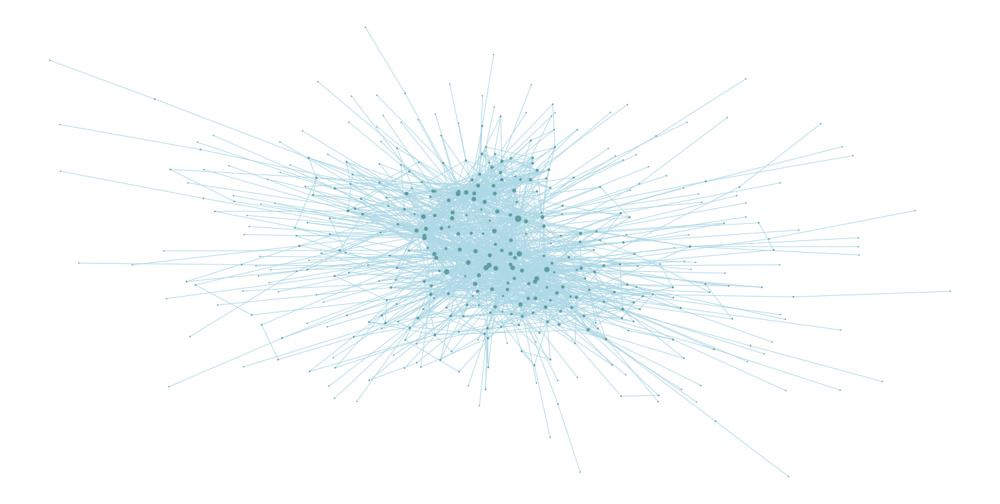

In [4]:
Graphtype = nx.complete_graph(1697)
Gnetwork = nx.from_pandas_edgelist(network, source = 'player_1name', target = 'player_2name', create_using=Graphtype)
pos=nx.spring_layout(Gnetwork)
d = dict(Gnetwork.degree)
node_size = [d[v] for v in Gnetwork.nodes()]
plt.figure(figsize=(20,10))
nx.draw(Gnetwork,pos,node_color='#5F9EA0',edge_color='#ADD8E6', node_size=node_size, with_labels=False)
print(nx.info(Gnetwork))

### Dataframe of Adjacency

In [5]:
nodes = list(Gnetwork.nodes)
df = pd.DataFrame(columns=['node1', 'node2', 'linked'])
for a in nodes:
    neighbors=list(Gnetwork.neighbors(a))
    for b in nodes:
        if b in neighbors:
            df = df.append({'node1': a, 'node2': b, 'linked': 1}, ignore_index=True)
        if b not in neighbors:
            df = df.append({'node1': a, 'node2': b, 'linked': 0}, ignore_index=True)
            
df.head(10)

,node1,node2,linked
0,Smith M.,Smith M.,0
1,Smith M.,Wright P.,1
2,Smith M.,Anderson G.,0
3,Smith M.,Wade J.,1
4,Smith M.,Price G.,1
5,Smith M.,Rydz C.,0
6,Smith M.,Humphries L.,1
7,Smith M.,King M.,1
8,Smith M.,Searle R.,1
9,Smith M.,Cross R.,1


## Neighborhood-Based Link Prediction Methods
<a id = '2'></a>

### Sorensen Index
<a id = 'x'></a>
The Sorensen index, which measures the number of common neighbors according to their arithmetic mean, considers the number of unique nodes in the common neighborhood.

$$ S_(xy)  = \frac{|\Gamma(u)  \cap  \Gamma(v)|}{|\Gamma(u) +  \Gamma(v)|}$$

In [6]:
def _apply_prediction(G, func, ebunch=None):
    if ebunch is None:
        ebunch = nx.non_edges(G)
    return ((u, v, func(u, v)) for u, v in ebunch)

def sorensen_coefficient(G, ebunch=None):
    def predict(u, v):
        total_size = G.degree(u) + G.degree(v)
        if total_size == 0:
            return 0
        return 2 * len(list(nx.common_neighbors(G, u, v))) / total_size

    return _apply_prediction(G, predict, ebunch)

sn = sorensen_coefficient(Gnetwork, ebunch=None)
for u, v, p in sn:
    if p>0:
        print(f"({u}, {v}) -> {p:.8f}")

(Jenkins T., Manning M.) -> 0.21052632
(Jenkins T., Watkins J.) -> 0.06666667
(Jenkins T., Brown K.) -> 0.15789474
(Jenkins T., Barnard M.) -> 0.06666667
(Jenkins T., Painter K.) -> 0.23728814
(Jenkins T., van Duijvenbode D.) -> 0.05555556
(Jenkins T., Anderson K.) -> 0.10810811
(Jenkins T., Olson D.) -> 0.07142857
(Jenkins T., Haines J.) -> 0.07142857
(Jenkins T., Richardson D.) -> 0.07142857
(Jenkins T., Deller K.) -> 0.08888889
(Jenkins T., Aspinall N.) -> 0.09523810
(Jenkins T., Searle R.) -> 0.04878049
(Jenkins T., van de Rijk K.) -> 0.07142857
(Jenkins T., Lerchbacher Z.) -> 0.05714286
(Jenkins T., MacArthur S.) -> 0.07142857
(Jenkins T., Schenk J.) -> 0.12500000
(Jenkins T., Wilson J.) -> 0.05555556
(Jenkins T., Kist C.) -> 0.12500000
(Jenkins T., Kirchner S.) -> 0.06896552
(Jenkins T., Lloyd C.) -> 0.23076923
(Jenkins T., Gilding A.) -> 0.12500000
(Jenkins T., Thomson M.) -> 0.07142857
(Jenkins T., Norris A.) -> 0.05405405
(Jenkins T., Eidams R.) -> 0.06896552
(Jenkins T., Buny

(Stompe C., O'Connor W.) -> 0.08695652
(Stompe C., Davis B.) -> 0.13333333
(Stompe C., Humphries L.) -> 0.14285714
(Stompe C., Cullen J.) -> 0.14814815
(Stompe C., Lazarenko C.) -> 0.15384615
(Stompe C., Joyce R.) -> 0.09090909
(Stompe C., Clarys E.) -> 0.11764706
(Stompe C., Lowe J.) -> 0.11764706
(Stompe C., Grubb S.) -> 0.15384615
(Stompe C., Weber J.) -> 0.15384615
(Stompe C., Navratil M.) -> 0.14285714
(Stompe C., Manley P.) -> 0.13953488
(Stompe C., Monk C.) -> 0.12500000
(Stompe C., Harding R.) -> 0.11764706
(Stompe C., West S.) -> 0.19047619
(Stompe C., Clark J.) -> 0.11111111
(Stompe C., Hylton M.) -> 0.12500000
(Stompe C., Teehan C.) -> 0.13333333
(Stompe C., Burgess S.) -> 0.07407407
(Stompe C., Price G.) -> 0.18181818
(Stompe C., Beaton S.) -> 0.20512821
(Stompe C., Winstanley D.) -> 0.11111111
(Stompe C., Smith A.) -> 0.14285714
(Stompe C., Askew D.) -> 0.15384615
(Stompe C., Verrier G.) -> 0.10000000
(Stompe C., Malicdem N.) -> 0.12500000
(Stompe C., Pipe J.) -> 0.2307692

(Dudbridge M., Van der Rassel J.) -> 0.18750000
(Dudbridge M., Winstanley D.) -> 0.06666667
(Dudbridge M., Smith A.) -> 0.20000000
(Dudbridge M., Askew D.) -> 0.26315789
(Dudbridge M., Tichowitsch S.) -> 0.07692308
(Dudbridge M., Verrier G.) -> 0.06250000
(Dudbridge M., Pipe J.) -> 0.05263158
(Dudbridge M., Honey D.) -> 0.08000000
(Dudbridge M., Welding G.) -> 0.13793103
(Dudbridge M., Brown S.) -> 0.12765957
(Dudbridge M., Sams L.) -> 0.06666667
(Dudbridge M., Munch K.) -> 0.13333333
(Dudbridge M., de Vreede R.) -> 0.08000000
(Dudbridge M., Muramatsu H.) -> 0.12903226
(Dudbridge M., Korte P.) -> 0.07692308
(Dudbridge M., Caves A.) -> 0.07142857
(Dudbridge M., Mawson G.) -> 0.11111111
(Dudbridge M., Evans S.) -> 0.07692308
(Dudbridge M., Caris M.) -> 0.13333333
(Dudbridge M., Noppert D.) -> 0.06250000
(Dudbridge M., Murnan J.) -> 0.06896552
(Dudbridge M., Ono K.) -> 0.07692308
(Dudbridge M., de Zwaan J.) -> 0.12903226
(Dudbridge M., Roach B.) -> 0.08000000
(Dudbridge M., Cross R.) -> 0

(Williams P., Lazarenko C.) -> 0.21052632
(Williams P., Joyce R.) -> 0.13333333
(Williams P., Reyes C.) -> 0.12500000
(Williams P., Clarys E.) -> 0.20000000
(Williams P., Lowe J.) -> 0.14814815
(Williams P., Grubb S.) -> 0.33333333
(Williams P., Manley P.) -> 0.16666667
(Williams P., Monk C.) -> 0.22222222
(Williams P., Harding R.) -> 0.60000000
(Williams P., Gardner R.) -> 0.15384615
(Williams P., Ratajski K.) -> 0.14285714
(Williams P., Burgess S.) -> 0.10000000
(Williams P., Kirby T.) -> 0.20000000
(Williams P., Price G.) -> 0.07692308
(Williams P., Beaton S.) -> 0.06250000
(Williams P., Smith A.) -> 0.09523810
(Williams P., Askew D.) -> 0.10526316
(Williams P., Verrier G.) -> 0.15384615
(Williams P., Pipe J.) -> 0.10526316
(Williams P., Brown S.) -> 0.14285714
(Williams P., Horvat D.) -> 0.28571429
(Williams P., Robinson H.) -> 0.22222222
(Williams P., Muramatsu H.) -> 0.33333333
(Williams P., Caves A.) -> 0.22222222
(Williams P., Mawson G.) -> 0.23529412
(Williams P., Chisnall D.)

(Van Eijden R., Jones W.) -> 0.07692308
(Van Eijden R., Joyce R.) -> 0.16666667
(Van Eijden R., Dolan B.) -> 0.07407407
(Van Eijden R., Maish S.) -> 0.16666667
(Van Eijden R., Wade J.) -> 0.04255319
(Kuivenhoven M., Brown K.) -> 0.14285714
(Kuivenhoven M., MacArthur S.) -> 0.50000000
(Kuivenhoven M., Suljovic M.) -> 0.16000000
(Kuivenhoven M., Whitlock S.) -> 0.05263158
(Kuivenhoven M., Wright P.) -> 0.05405405
(Kuivenhoven M., Jones W.) -> 0.07407407
(Kuivenhoven M., Asada S.) -> 0.20000000
(Kuivenhoven M., King M.) -> 0.05555556
(Kuivenhoven M., Joyce R.) -> 0.15384615
(Kuivenhoven M., Beaton S.) -> 0.06666667
(Kuivenhoven M., Smith A.) -> 0.10526316
(Kuivenhoven M., Brown S.) -> 0.07692308
(Kuivenhoven M., Korte P.) -> 0.40000000
(Kuivenhoven M., Newton W.) -> 0.07142857
(Kuivenhoven M., Alcinas T.) -> 0.18181818
(Kuivenhoven M., Farmer S.) -> 0.28571429
(Kuivenhoven M., Labanauskas D.) -> 0.15384615
(Kuivenhoven M., Klaasen J.) -> 0.07692308
(Kuivenhoven M., Dolan B.) -> 0.07142857

(Chapman M., Askew D.) -> 0.13333333
(Chapman M., Brown S.) -> 0.08333333
(Chapman M., Sams L.) -> 0.28571429
(Chapman M., Laursen P.) -> 0.14285714
(Chapman M., Harrington R.) -> 0.10526316
(Chapman M., Taylor P.) -> 0.02816901
(Chapman M., Raw S.) -> 0.22222222
(Chapman M., French W.) -> 0.33333333
(Chapman M., Baxter R.) -> 0.08000000
(Chapman M., Hamilton A.) -> 0.05882353
(Chapman M., Maish S.) -> 0.18181818
(Chapman M., McDine K.) -> 0.22222222
(Chapman M., Anderson G.) -> 0.04347826
(Chapman M., Ferrell J.) -> 0.33333333
(Chapman M., Evison P.) -> 0.08333333
(Chapman M., Buckle R.) -> 0.50000000
(Chapman M., Warriner-Little A.) -> 0.06666667
(Chapman M., Smith D.) -> 0.07407407
(Chapman M., Harvey J.) -> 0.09090909
(Roith B., Deller K.) -> 0.10526316
(Roith B., Schenk J.) -> 0.33333333
(Roith B., Lowe J.) -> 0.08695652
(Roith B., Manley P.) -> 0.06250000
(Roith B., Magowan J.) -> 0.66666667
(Roith B., Gardner R.) -> 0.22222222
(Roith B., Burgess S.) -> 0.12500000
(Roith B., Kirb

(Meeuwisse Y., Price G.) -> 0.09090909
(Meeuwisse Y., Lauby D. Jr.) -> 0.66666667
(Meeuwisse Y., Zonneveld N.) -> 1.00000000
(Meeuwisse Y., Kantele M.) -> 0.40000000
(Meeuwisse Y., Gurney D.) -> 0.08695652
(Malicdem N., Brown K.) -> 0.13333333
(Malicdem N., Searle R.) -> 0.11111111
(Malicdem N., Whitlock S.) -> 0.05128205
(Malicdem N., Jacques P.) -> 0.40000000
(Malicdem N., Asada S.) -> 0.18181818
(Malicdem N., Humphries L.) -> 0.20000000
(Malicdem N., Cullen J.) -> 0.10526316
(Malicdem N., West S.) -> 0.15384615
(Malicdem N., Price G.) -> 0.08000000
(Malicdem N., Chisnall D.) -> 0.13333333
(Malicdem N., de Zwaan J.) -> 0.18181818
(Malicdem N., Laursen P.) -> 0.11764706
(Malicdem N., Newton W.) -> 0.06896552
(Malicdem N., Alcinas T.) -> 0.16666667
(Malicdem N., Zong X. C.) -> 0.33333333
(Malicdem N., Klaasen J.) -> 0.14814815
(Malicdem N., Dolan B.) -> 0.06896552
(Malicdem N., Hendriks J.) -> 0.25000000
(Malicdem N., Taylor P.) -> 0.02702703
(Malicdem N., Lewis J.) -> 0.10526316
(Mali

(Newton W., Brown K.) -> 0.22222222
(Newton W., van Duijvenbode D.) -> 0.05882353
(Newton W., Anderson K.) -> 0.11428571
(Newton W., Ryder L.) -> 0.14285714
(Newton W., Konchikov R.) -> 0.07692308
(Newton W., Green R.) -> 0.07692308
(Newton W., Searle R.) -> 0.10256410
(Newton W., Lerchbacher Z.) -> 0.06060606
(Newton W., MacArthur S.) -> 0.07692308
(Newton W., Schenk J.) -> 0.06666667
(Newton W., Kist C.) -> 0.13333333
(Newton W., Hogg J.) -> 0.07692308
(Newton W., Soutar A.) -> 0.06896552
(Newton W., Norris A.) -> 0.11428571
(Newton W., Meulenkamp R.) -> 0.05882353
(Newton W., Mason C.) -> 0.10810811
(Newton W., Ovens D.) -> 0.04255319
(Newton W., Huybrechts K.) -> 0.08510638
(Newton W., Whitlock S.) -> 0.23333333
(Newton W., Lindskjold D.) -> 0.07692308
(Newton W., Priestley D.) -> 0.06666667
(Newton W., Dekker J.) -> 0.06250000
(Newton W., Ljubic A.) -> 0.07692308
(Newton W., Krcmar B.) -> 0.07142857
(Newton W., McGarry C.) -> 0.06896552
(Newton W., Asada S.) -> 0.12500000
(Newton 

(French W., Van der Voort V.) -> 0.05405405
(French W., Warriner-Little A.) -> 0.05882353
(French W., Smith D.) -> 0.12903226
(French W., Komula J.) -> 0.20000000
(French W., Webster M.) -> 0.07142857
(French W., Vonck R.) -> 0.25000000
(French W., Mardle W.) -> 0.07692308
(French W., Ladley D.) -> 0.28571429
(French W., Petersen D.) -> 0.08695652
(French W., Harvey J.) -> 0.07692308
(Brooks B., Searle R.) -> 0.12500000
(Brooks B., Price G.) -> 0.08695652
(Brooks B., Hunt A.) -> 0.25000000
(Brooks B., Cross R.) -> 0.12500000
(Brooks B., Koltsov B.) -> 0.22222222
(Brooks B., Anderson G.) -> 0.04255319
(Brooks B., van Barneveld R.) -> 0.04761905
(Baggish D., Brown K.) -> 0.12500000
(Baggish D., van Duijvenbode D.) -> 0.14285714
(Baggish D., Anderson K.) -> 0.13333333
(Baggish D., de Sousa J.) -> 0.16666667
(Baggish D., Suljovic M.) -> 0.07407407
(Baggish D., Ovens D.) -> 0.07407407
(Baggish D., Nentjes G.) -> 0.28571429
(Baggish D., Priestley D.) -> 0.05000000
(Baggish D., Dekker J.) -> 

(McDine K., Spiolek K.) -> 0.11764706
(McDine K., Evans R.) -> 0.10526316
(McDine K., Viljanen K.) -> 0.14285714
(McDine K., Anderson G.) -> 0.15094340
(McDine K., Ferrell J.) -> 0.15384615
(McDine K., Evison P.) -> 0.12903226
(McDine K., Fitton L.) -> 0.15384615
(McDine K., Rodriguez R.-J.) -> 0.13333333
(McDine K., Hine S.) -> 0.15384615
(McDine K., Buckle R.) -> 0.18181818
(McDine K., Van der Voort V.) -> 0.15000000
(McDine K., Warriner-Little A.) -> 0.16216216
(McDine K., McBrearty F.) -> 0.22222222
(McDine K., Wade J.) -> 0.15094340
(McDine K., Webster M.) -> 0.19354839
(McDine K., Vonck R.) -> 0.18181818
(McDine K., Jouannet B.) -> 0.20000000
(McDine K., Clegg M.) -> 0.22222222
(McDine K., Osborne C.) -> 0.17391304
(McDine K., Petersen D.) -> 0.07692308
(McDine K., Harvey J.) -> 0.06896552
(McDine K., Gurney D.) -> 0.06666667
(McDine K., North R.) -> 0.18181818
(Spiolek K., Watkins J.) -> 0.50000000
(Spiolek K., Brown K.) -> 0.10000000
(Spiolek K., Havenga W.) -> 0.16666667
(Spio

(Jouannet B., Cullen J.) -> 0.11764706
(Jouannet B., Van der Voort V.) -> 0.05882353
(Jouannet B., Manley P.) -> 0.06060606
(Jouannet B., Wade J.) -> 0.04255319
(Jouannet B., Teehan C.) -> 0.40000000
(Jouannet B., Petersen D.) -> 0.10000000
(Burton S., Lauby D. Jr.) -> 0.66666667
(Burton S., de Zwaan J.) -> 0.25000000
(Burton S., Suljovic M.) -> 0.08695652
(Burton S., Huybrechts K.) -> 0.08695652
(Burton S., Wright P.) -> 0.05714286
(Burton S., Anderson G.) -> 0.04347826
(Burton S., O'Connor W.) -> 0.16666667
(Burton S., West S.) -> 0.20000000
(Burton S., King R.) -> 1.00000000
(Ridd P., Chisnall D.) -> 0.07142857
(Ridd P., Anderson K.) -> 0.16666667
(Ridd P., Puha H.) -> 0.66666667
(Ridd P., Ryder L.) -> 0.40000000
(Ridd P., Duo D.) -> 0.66666667
(Ridd P., Klaasen J.) -> 0.08000000
(Ridd P., Taylor P.) -> 0.05555556
(Ridd P., Long J.) -> 0.50000000
(Ridd P., Meulenkamp R.) -> 0.18181818
(Ridd P., Webster D.) -> 0.10000000
(Ridd P., Huybrechts K.) -> 0.08333333
(Ridd P., Whitlock S.) -

(Schenk J., de Zwaan J.) -> 0.16666667
(Schenk J., Laursen P.) -> 0.11111111
(Schenk J., Alcinas T.) -> 0.15384615
(Schenk J., Klaasen J.) -> 0.07142857
(Schenk J., Taylor P.) -> 0.08000000
(Schenk J., Kijamet O.) -> 0.28571429
(Schenk J., Burnett R.) -> 0.09090909
(Schenk J., Barbero J.) -> 0.28571429
(Schenk J., Raw S.) -> 0.15384615
(Schenk J., Roy A.) -> 0.09090909
(Schenk J., Suljovic M.) -> 0.07407407
(Schenk J., Huybrechts K.) -> 0.07407407
(Schenk J., Whitlock S.) -> 0.10000000
(Schenk J., Kwadijk L.) -> 0.33333333
(Schenk J., Baxter R.) -> 0.13793103
(Schenk J., Atwood W.) -> 0.22222222
(Schenk J., Greebe T.) -> 0.28571429
(Schenk J., Maish S.) -> 0.13333333
(Schenk J., Kurz N.) -> 0.20000000
(Schenk J., Wright P.) -> 0.05128205
(Schenk J., Anderson G.) -> 0.04000000
(Schenk J., Jowett D.) -> 0.33333333
(Schenk J., Ferrell J.) -> 0.20000000
(Schenk J., Evison P.) -> 0.14285714
(Schenk J., van Barneveld R.) -> 0.04444444
(Schenk J., Buckle R.) -> 0.25000000
(Schenk J., Van der 

(Ljubic A., Rydz C.) -> 0.20000000
(Ljubic A., Anderson G.) -> 0.04347826
(Ljubic A., Cullen J.) -> 0.12500000
(Ljubic A., van Barneveld R.) -> 0.04878049
(Ljubic A., Kumar N.) -> 0.50000000
(Ljubic A., Wade J.) -> 0.04347826
(Ljubic A., Price G.) -> 0.09090909
(Kurz N., Chisnall D.) -> 0.12903226
(Kurz N., Cross R.) -> 0.10526316
(Kurz N., Alcinas T.) -> 0.15384615
(Kurz N., Klaasen J.) -> 0.14285714
(Kurz N., Taylor P.) -> 0.02666667
(Kurz N., Burnett R.) -> 0.09090909
(Kurz N., Roy A.) -> 0.09090909
(Kurz N., Lim P.) -> 0.08333333
(Kurz N., Dobey C.) -> 0.10000000
(Kurz N., Kwadijk L.) -> 0.33333333
(Kurz N., Williams J.) -> 0.28571429
(Kurz N., Wright P.) -> 0.20512821
(Kurz N., Smith J.) -> 0.18181818
(Kurz N., Anderson G.) -> 0.04000000
(Kurz N., O'Connor W.) -> 0.12500000
(Kurz N., Henderson J.) -> 0.10526316
(Kurz N., Rodriguez R.-J.) -> 0.16666667
(Kurz N., Van der Voort V.) -> 0.05405405
(Kurz N., Clayton J.) -> 0.25000000
(Kurz N., Wade J.) -> 0.04000000
(Kurz N., Hunt A.) -

(Verrier G., van Barneveld R.) -> 0.04166667
(Verrier G., Van der Voort V.) -> 0.05000000
(Verrier G., Warriner-Little A.) -> 0.05405405
(Verrier G., Burnett R.) -> 0.08000000
(Verrier G., Raw S.) -> 0.12500000
(Verrier G., Seyler T.) -> 0.15384615
(Verrier G., Roy A.) -> 0.08000000
(Verrier G., Webster D.) -> 0.15384615
(Verrier G., Webster M.) -> 0.06451613
(Verrier G., Szabo R.) -> 0.16666667
(Verrier G., Lim P.) -> 0.14814815
(Verrier G., Dobey C.) -> 0.08695652
(Verrier G., Baxter R.) -> 0.06250000
(Verrier G., Walsh M.) -> 0.07692308
(Honey D., Hamilton A.) -> 0.05882353
(Honey D., Munch K.) -> 0.28571429
(Honey D., Caris M.) -> 0.28571429
(Honey D., Scholten R.) -> 0.08333333
(Honey D., Anderson G.) -> 0.04347826
(Honey D., Labanauskas D.) -> 0.18181818
(Honey D., van Barneveld R.) -> 0.04878049
(Honey D., Taylor P.) -> 0.02816901
(Honey D., Vos G.) -> 0.66666667
(Honey D., Van der Voort V.) -> 0.06060606
(Honey D., Wade J.) -> 0.04347826
(Honey D., Webster D.) -> 0.10526316
(Ho

(Tabern A., Kokiri K.) -> 0.10526316
(Tabern A., Clegg M.) -> 0.10526316
(Tabern A., Viljanen K.) -> 0.08333333
(Tabern A., Harvey J.) -> 0.15384615
(Tabern A., Anderson G.) -> 0.12698413
(Tabern A., Ferrell J.) -> 0.08695652
(Tabern A., Evison P.) -> 0.09756098
(Tabern A., Gurney D.) -> 0.10000000
(Tabern A., Fitton L.) -> 0.26086957
(Schnier H., Warriner-Little A.) -> 0.06666667
(Schnier H., Seyler T.) -> 0.33333333
(Williams J., Clayton J.) -> 0.15384615
(Burnett S., Webster M.) -> 0.08333333
(Yongsheng S., Welge A.) -> 0.18181818
(Yongsheng S., Rand S.) -> 0.20000000
(Yongsheng S., Wade J.) -> 0.07843137
(Yongsheng S., Evans R.) -> 0.11764706
(Yongsheng S., Harvey J.) -> 0.07407407
(Yongsheng S., Anderson G.) -> 0.03921569
(Yongsheng S., Ferrell J.) -> 0.18181818
(Yongsheng S., Gurney D.) -> 0.07142857
(Yongsheng S., Fitton L.) -> 0.18181818
(Smith S., Hine S.) -> 0.25000000
(Smith S., Welge A.) -> 0.25000000
(Smith S., Maish S.) -> 0.15384615
(Smith S., Wade J.) -> 0.04166667
(Smi

### Adamic Adar
<a id = 't'></a>
The Adamic–Adar measure is the sum of the log of the intersection of the neighbors of two nodes. This captures a two-hop similarity, which can yield better results than simple one-hop methods. It is computed as follows:
$$ S_(xy)  = \sum_{ z\in \Gamma(u)  \cap  \Gamma(v)} {1/log(k_z)}$$

In [7]:
aai = nx.adamic_adar_index(Gnetwork, ebunch=None)
for u, v, p in aai:
    if p>0:
        print(f"({u}, {v}) -> {p:.8f}")

(Jenkins T., Manning M.) -> 1.19116382
(Jenkins T., Watkins J.) -> 0.31892899
(Jenkins T., Brown K.) -> 0.80746506
(Jenkins T., Barnard M.) -> 0.28599967
(Jenkins T., Painter K.) -> 2.15800963
(Jenkins T., van Duijvenbode D.) -> 0.26269731
(Jenkins T., Anderson K.) -> 0.58941274
(Jenkins T., Olson D.) -> 0.31465798
(Jenkins T., Haines J.) -> 0.31066747
(Jenkins T., Richardson D.) -> 0.28599967
(Jenkins T., Deller K.) -> 0.62585667
(Jenkins T., Aspinall N.) -> 0.53024370
(Jenkins T., Searle R.) -> 0.26269731
(Jenkins T., van de Rijk K.) -> 0.31066747
(Jenkins T., Lerchbacher Z.) -> 0.26754639
(Jenkins T., MacArthur S.) -> 0.26269731
(Jenkins T., Schenk J.) -> 0.72029415
(Jenkins T., Wilson J.) -> 0.26754639
(Jenkins T., Kist C.) -> 0.64646957
(Jenkins T., Kirchner S.) -> 0.26269731
(Jenkins T., Lloyd C.) -> 1.88170364
(Jenkins T., Gilding A.) -> 0.52388657
(Jenkins T., Thomson M.) -> 0.28599967
(Jenkins T., Norris A.) -> 0.31892899
(Jenkins T., Eidams R.) -> 0.26754639
(Jenkins T., Buny

(Aspinall N., Bezzeg N.) -> 0.28853901
(Aspinall N., Yamada Y.) -> 0.45511961
(Aspinall N., Bunting S.) -> 1.70051407
(Aspinall N., Priestley D.) -> 0.26269731
(Aspinall N., Edhouse R.) -> 0.32845874
(Aspinall N., Eccles T.) -> 0.31066747
(Aspinall N., Jacques P.) -> 0.43429448
(Aspinall N., Barstow C.) -> 0.26754639
(Aspinall N., Clark M.) -> 0.28853901
(Aspinall N., Dekker J.) -> 0.34597626
(Aspinall N., Ljubic A.) -> 0.31066747
(Aspinall N., Wright P.) -> 1.61723513
(Aspinall N., Smith J.) -> 0.26269731
(Aspinall N., Razma M.) -> 0.26269731
(Aspinall N., Stein S.) -> 0.26754639
(Aspinall N., Hopp M.) -> 0.55608539
(Aspinall N., Jones W.) -> 0.63451526
(Aspinall N., Asada S.) -> 0.45511961
(Aspinall N., Artut J.) -> 0.26269731
(Aspinall N., Durrant G.) -> 0.94979367
(Aspinall N., O'Connor W.) -> 0.63187181
(Aspinall N., Humphries L.) -> 1.25806290
(Aspinall N., King M.) -> 1.21008567
(Aspinall N., Cullen J.) -> 0.57821385
(Aspinall N., Joyce R.) -> 0.72266600
(Aspinall N., Reyes C.) 

(Stompe C., Harvey J.) -> 0.23537746
(Stompe C., McGowan M.) -> 0.55430644
(Stompe C., Gurney D.) -> 0.31892899
(Wilson J., Butler L.) -> 0.69278483
(Wilson J., Deller K.) -> 0.97405124
(Wilson J., Searle R.) -> 0.74054784
(Wilson J., de Sousa J.) -> 0.32351545
(Wilson J., Lerchbacher Z.) -> 0.72266600
(Wilson J., Schenk J.) -> 0.28126641
(Wilson J., Kist C.) -> 0.26754639
(Wilson J., Lloyd C.) -> 0.26754639
(Wilson J., Eidams R.) -> 0.26754639
(Wilson J., Suljovic M.) -> 0.26754639
(Wilson J., Lewis A.) -> 0.54881280
(Wilson J., Bristow E.) -> 0.28126641
(Wilson J., Whitlock S.) -> 0.72266600
(Wilson J., Smith M.) -> 1.56620486
(Wilson J., Pallett D.) -> 0.32351545
(Wilson J., Nicholson P.) -> 0.60478187
(Wilson J., Nentjes G.) -> 0.32351545
(Wilson J., Bunting S.) -> 0.72266600
(Wilson J., Barstow C.) -> 0.26754639
(Wilson J., Wright P.) -> 0.26754639
(Wilson J., Stein S.) -> 0.26754639
(Wilson J., Hopp M.) -> 0.59106184
(Wilson J., Asada S.) -> 0.45511961
(Wilson J., Durrant G.) -> 

(Dudbridge M., Davis B.) -> 0.71787297
(Dudbridge M., Humphries L.) -> 0.56962499
(Dudbridge M., King M.) -> 2.03028259
(Dudbridge M., Cullen J.) -> 0.54476775
(Dudbridge M., Ayres T.) -> 0.28599967
(Dudbridge M., Lazarenko C.) -> 0.51895595
(Dudbridge M., Joyce R.) -> 0.26269731
(Dudbridge M., Reyes C.) -> 0.81242558
(Dudbridge M., Clarys E.) -> 0.64311672
(Dudbridge M., Lowe J.) -> 0.23537746
(Dudbridge M., Grubb S.) -> 0.23537746
(Dudbridge M., Wylie G.) -> 0.32351545
(Dudbridge M., Manley P.) -> 1.13474015
(Dudbridge M., Monk C.) -> 0.55889291
(Dudbridge M., Harding R.) -> 0.87687259
(Dudbridge M., West S.) -> 0.26269731
(Dudbridge M., Hylton M.) -> 0.30341308
(Dudbridge M., Burgess S.) -> 0.23537746
(Dudbridge M., Price G.) -> 0.26269731
(Dudbridge M., Van der Rassel J.) -> 1.34827605
(Dudbridge M., Winstanley D.) -> 0.35295612
(Dudbridge M., Smith A.) -> 1.28320456
(Dudbridge M., Askew D.) -> 1.49891217
(Dudbridge M., Tichowitsch S.) -> 0.30692768
(Dudbridge M., Verrier G.) -> 0.

(Hashimoto M., O'Connor W.) -> 0.30341308
(Hashimoto M., Humphries L.) -> 0.90573366
(Hashimoto M., King M.) -> 0.30341308
(Hashimoto M., Reyes C.) -> 0.26269731
(Hashimoto M., Lowe J.) -> 0.64303635
(Hashimoto M., West S.) -> 0.26269731
(Hashimoto M., Price G.) -> 0.56611039
(Hashimoto M., Beaton S.) -> 0.30341308
(Hashimoto M., Smith A.) -> 0.26269731
(Hashimoto M., Chisnall D.) -> 0.26269731
(Hashimoto M., Murnan J.) -> 0.33962327
(Hashimoto M., de Zwaan J.) -> 0.30341308
(Hashimoto M., Cross R.) -> 0.56611039
(Hashimoto M., Klaasen J.) -> 0.26269731
(Hashimoto M., Dolan B.) -> 0.56611039
(Hashimoto M., Smith R.) -> 0.33962327
(Hashimoto M., Taylor P.) -> 0.56611039
(Hashimoto M., Oreshkin A.) -> 0.33962327
(Hashimoto M., Woodhouse L.) -> 0.64303635
(Hashimoto M., Wattimena J.) -> 0.26269731
(Hashimoto M., Bowles J.) -> 0.26269731
(Hashimoto M., Part J.) -> 0.33962327
(Hashimoto M., Dobey C.) -> 0.26269731
(Hashimoto M., Baxter R.) -> 0.26269731
(Hashimoto M., Caven J.) -> 0.2626973

(Williams P., Welge A.) -> 0.29697420
(Williams P., Van der Voort V.) -> 0.80518288
(Williams P., Smith D.) -> 0.81361807
(Williams P., Seyler T.) -> 0.28853901
(Williams P., Komula J.) -> 0.28126641
(Williams P., Wade J.) -> 0.28126641
(Williams P., Webster M.) -> 0.23537746
(Williams P., Szabo R.) -> 0.23537746
(Williams P., Rodriguez C.) -> 0.28853901
(Williams P., Osborne C.) -> 0.56980542
(Williams P., Harvey J.) -> 0.23537746
(Williams P., McGowan M.) -> 0.23537746
(Pallett D., Brown K.) -> 0.26118926
(Pallett D., Searle R.) -> 0.64703091
(Pallett D., Soutar A.) -> 0.32351545
(Pallett D., Meulenkamp R.) -> 0.32351545
(Pallett D., Ovens D.) -> 0.26118926
(Pallett D., Nicholson P.) -> 0.90822016
(Pallett D., Nentjes G.) -> 0.32351545
(Pallett D., Priestley D.) -> 0.26118926
(Pallett D., Eccles T.) -> 0.26118926
(Pallett D., Dekker J.) -> 0.26118926
(Pallett D., Wright P.) -> 0.26118926
(Pallett D., Hopp M.) -> 0.32351545
(Pallett D., Jones W.) -> 0.26118926
(Pallett D., Humphries L

(Cyr B., Convery G.) -> 0.43429448
(Cyr B., Davis B.) -> 0.43429448
(Cyr B., King M.) -> 0.43429448
(Cyr B., Klaasen J.) -> 0.43429448
(Cyr B., Shepherd K.) -> 0.43429448
(Cyr B., Walsh M.) -> 0.91023923
(Cyr B., McDine K.) -> 0.43429448
(Cyr B., van Barneveld R.) -> 0.91023923
(Cyr B., McBrearty F.) -> 0.43429448
(Perez C., Lerchbacher Z.) -> 0.31465798
(Perez C., Norris A.) -> 0.31465798
(Perez C., Suljovic M.) -> 0.31465798
(Perez C., Ovens D.) -> 0.34597626
(Perez C., Priestley D.) -> 0.38987125
(Perez C., Krcmar B.) -> 0.38987125
(Perez C., Wright P.) -> 0.38987125
(Perez C., Hopp M.) -> 0.31465798
(Perez C., Jones W.) -> 0.31465798
(Perez C., McGarry C.) -> 0.38987125
(Perez C., Artut J.) -> 0.31465798
(Perez C., Monk C.) -> 0.38987125
(Perez C., Ilagan L.) -> 0.41703239
(Perez C., Beaton S.) -> 0.34597626
(Perez C., Askew D.) -> 0.34597626
(Perez C., Larsson D.) -> 0.31465798
(Perez C., Korte P.) -> 0.38987125
(Perez C., Caris M.) -> 1.75735302
(Perez C., Cross R.) -> 0.41703239

(Jones W., Huybrechts R.) -> 0.82080794
(Jones W., Walsh M.) -> 0.28853901
(Jones W., Atwood W.) -> 0.29120668
(Jones W., Greebe T.) -> 0.29120668
(Jones W., Hamilton A.) -> 2.38264103
(Jones W., Tabern A.) -> 0.70591225
(Jones W., Williams J.) -> 0.36926937
(Jones W., van den Bergh D.) -> 0.26118926
(Jones W., Burnett S.) -> 0.43429448
(Jones W., Campbell M.) -> 0.26118926
(Jones W., Maish S.) -> 0.55811063
(Jones W., Ward H.) -> 0.28126641
(Jones W., Miller R.) -> 0.31892899
(Jones W., Spiolek K.) -> 0.63718293
(Jones W., Hudson P.) -> 0.26269731
(Jones W., White I.) -> 0.94190065
(Jones W., Evans R.) -> 0.28126641
(Jones W., van de Pas B.) -> 0.31465798
(Jones W., Viljanen K.) -> 0.28853901
(Jones W., Rydz C.) -> 0.26269731
(Jones W., van Gerwen M.) -> 1.96997868
(Jones W., Anderson G.) -> 1.43966825
(Jones W., Kleermaker M.) -> 0.91323310
(Jones W., Jowett D.) -> 0.29120668
(Jones W., Evison P.) -> 0.64416280
(Jones W., Henderson J.) -> 0.28853901
(Jones W., Hine S.) -> 0.31892899


(King M., Ayres T.) -> 0.36067376
(King M., Lazarenko C.) -> 0.86123412
(King M., Reyes C.) -> 0.52873564
(King M., Clarys E.) -> 0.34597626
(King M., Lowe J.) -> 1.35961655
(King M., Grubb S.) -> 0.23537746
(King M., Kumar N.) -> 0.72769986
(King M., Manley P.) -> 1.08476080
(King M., Monk C.) -> 0.59605122
(King M., Harding R.) -> 0.23537746
(King M., Ratajski K.) -> 1.65157886
(King M., Burgess S.) -> 0.55430644
(King M., Evans D.) -> 0.37892318
(King M., Kirby T.) -> 0.30692768
(King M., Arendse N.) -> 0.31066747
(King M., Van der Rassel J.) -> 0.31892899
(King M., Beaton S.) -> 1.40548743
(King M., Askew D.) -> 0.81549570
(King M., Tichowitsch S.) -> 0.36067376
(King M., Verrier G.) -> 0.23537746
(King M., Pipe J.) -> 0.58135371
(King M., Woods K.) -> 0.51389834
(King M., Honey D.) -> 0.26118926
(King M., Brown S.) -> 1.17767752
(King M., Sams L.) -> 0.31892899
(King M., Munch K.) -> 1.17142848
(King M., Larsson D.) -> 0.45511961
(King M., Murray R.) -> 0.26754639
(King M., Horvat

(Bolton A., Bates B.) -> 0.62133493
(Bolton A., Webster D.) -> 0.62133493
(Bolton A., Osborne C.) -> 0.62133493
(Wada T., van de Rijk K.) -> 0.31066747
(Wada T., Suljovic M.) -> 0.31066747
(Wada T., Convery G.) -> 0.31066747
(Wada T., Wright P.) -> 0.31066747
(Wada T., Pipe J.) -> 0.31066747
(Wada T., Laursen P.) -> 0.31066747
(Wada T., Thornton R.) -> 0.31066747
(Wada T., Dolan B.) -> 0.31066747
(Wada T., Young D.) -> 0.31066747
(Wada T., Part J.) -> 0.31066747
(Wada T., Caven J.) -> 0.31066747
(Wada T., Walsh M.) -> 0.31066747
(Wada T., Rand S.) -> 0.31066747
(Wada T., Matsunaga Y.) -> 0.31066747
(Wada T., van Barneveld R.) -> 0.31066747
(Wada T., Komula J.) -> 0.31066747
(Wada T., Wade J.) -> 0.31066747
(Wada T., Osborne C.) -> 0.31066747
(Shibata T., Clemens G.) -> 1.44269504
(Clark J., van Duijvenbode D.) -> 0.27108503
(Clark J., Anderson K.) -> 0.27108503
(Clark J., Deller K.) -> 0.61013567
(Clark J., Payne T.) -> 0.43429448
(Clark J., Green R.) -> 0.27108503
(Clark J., Havenga W

(Arendse N., Klaasen J.) -> 0.31066747
(Arendse N., van de Pas B.) -> 0.31066747
(Arendse N., Rydz C.) -> 0.31066747
(Arendse N., Anderson G.) -> 0.31066747
(Arendse N., Liu Y.) -> 0.31066747
(Arendse N., van Barneveld R.) -> 0.31066747
(Arendse N., Wade J.) -> 0.31066747
(Arendse N., Foulkes E.) -> 0.31066747
(Arendse N., Osborne C.) -> 0.31066747
(Roncero B., Deller K.) -> 0.28126641
(Roncero B., Schenk J.) -> 0.28126641
(Roncero B., Manley P.) -> 0.28126641
(Roncero B., Gardner R.) -> 0.28126641
(Roncero B., Askew D.) -> 0.28126641
(Roncero B., Brown S.) -> 0.28126641
(Roncero B., Sams L.) -> 0.28126641
(Roncero B., Laursen P.) -> 0.28126641
(Roncero B., Harrington R.) -> 0.28126641
(Roncero B., Taylor P.) -> 0.28126641
(Roncero B., Raw S.) -> 0.28126641
(Roncero B., French W.) -> 0.28126641
(Roncero B., Baxter R.) -> 0.28126641
(Roncero B., Hamilton A.) -> 0.28126641
(Roncero B., Maish S.) -> 0.28126641
(Roncero B., McDine K.) -> 0.28126641
(Roncero B., Anderson G.) -> 0.28126641
(

(de Vreede R., de Decker M.) -> 0.30692768
(de Vreede R., Gurney D.) -> 0.30692768
(Snook R., Norris A.) -> 0.55811063
(Snook R., Stein S.) -> 0.55811063
(Snook R., van Gerwen M.) -> 0.55811063
(Mawson G., Butler L.) -> 0.66949171
(Mawson G., Watkins J.) -> 0.23537746
(Mawson G., Brown K.) -> 0.23537746
(Mawson G., de Sousa J.) -> 0.32351545
(Mawson G., Havenga W.) -> 0.29120668
(Mawson G., Schenk J.) -> 0.29120668
(Mawson G., Justice N.) -> 0.23537746
(Mawson G., Suljovic M.) -> 0.57974568
(Mawson G., Mason C.) -> 0.52391646
(Mawson G., Huybrechts K.) -> 0.23537746
(Mawson G., Whitlock S.) -> 0.81512314
(Mawson G., Priestley D.) -> 3.48800770
(Mawson G., Burrows K.) -> 0.31892899
(Mawson G., Wright P.) -> 0.23537746
(Mawson G., McGarry C.) -> 0.23537746
(Mawson G., Artut J.) -> 0.23537746
(Mawson G., Grubb S.) -> 0.23537746
(Mawson G., Harding R.) -> 0.52391646
(Mawson G., Van der Rassel J.) -> 0.29120668
(Mawson G., Askew D.) -> 0.58135371
(Mawson G., Verrier G.) -> 0.87323543
(Mawso

(Jun T., Askew D.) -> 0.51389834
(Jun T., Bates B.) -> 0.51389834
(Jun T., Newton W.) -> 0.51389834
(Jun T., Part J.) -> 0.51389834
(Jun T., Warriner-Little A.) -> 0.51389834
(Roach B., Artut J.) -> 0.32845874
(Roach B., Clarys E.) -> 0.32845874
(Roach B., Caves A.) -> 0.32845874
(Roach B., Scholten R.) -> 0.32845874
(Roach B., Thornton R.) -> 0.32845874
(Roach B., Carver R.) -> 0.32845874
(Roach B., Taylor P.) -> 0.32845874
(Roach B., Whatley S.) -> 0.32845874
(Roach B., Shepherd K.) -> 0.32845874
(Roach B., Part J.) -> 0.32845874
(Roach B., Caven J.) -> 0.32845874
(Roach B., Walsh M.) -> 0.32845874
(Roach B., Fatum D.) -> 0.32845874
(Roach B., Maish S.) -> 0.32845874
(Roach B., Evison P.) -> 0.32845874
(Roach B., Warriner-Little A.) -> 0.32845874
(Robb B., Suljovic M.) -> 0.45511961
(Robb B., Krcmar B.) -> 0.45511961
(Robb B., Dobey C.) -> 1.89781465
(Robb B., Ashton L.) -> 0.45511961
(Robb B., Van der Voort V.) -> 0.45511961
(Robb B., Webster M.) -> 0.45511961
(Evetts T., Brown K.) 

(Smith R., Hunt A.) -> 1.36535884
(Smith R., Smith A.) -> 0.60951512
(Smith R., Askew D.) -> 0.34597626
(Smith R., Muramatsu H.) -> 0.28126641
(Smith R., Chisnall D.) -> 0.60478187
(Smith R., Caris M.) -> 0.28599967
(Smith R., Justicia J.) -> 0.36067376
(Smith R., Cross R.) -> 0.77863507
(Smith R., Laursen P.) -> 0.34597626
(Smith R., Scholten R.) -> 0.28599967
(Smith R., Schindler M.) -> 1.19150564
(Smith R., Labanauskas D.) -> 0.28126641
(Smith R., Kime G.) -> 0.28599967
(Smith R., Klaasen J.) -> 0.28599967
(Smith R., Taylor P.) -> 0.91324234
(Smith R., Koltsov B.) -> 0.45511961
(Smith R., Oreshkin A.) -> 0.62562294
(Smith R., Lewis J.) -> 0.32351545
(Smith R., Burnett R.) -> 0.62724267
(Smith R., Roy A.) -> 0.34597626
(Smith R., Webster D.) -> 0.98791643
(Smith R., Brooks B.) -> 0.45511961
(Smith R., Woodhouse L.) -> 0.33962327
(Smith R., Rosenauer M.) -> 0.28599967
(Smith R., Wattimena J.) -> 0.32351545
(Smith R., Young D.) -> 0.28599967
(Smith R., Part J.) -> 0.33962327
(Smith R.,

(Mathers G., Wright P.) -> 0.51389834
(Mathers G., Cross R.) -> 0.51389834
(Mathers G., Charl P.) -> 0.41703239
(Mathers G., Mansell M.) -> 0.51389834
(Mathers G., Labanauskas D.) -> 0.41703239
(Mathers G., van de Pas B.) -> 0.41703239
(Mathers G., van Gerwen M.) -> 0.41703239
(Mathers G., Van der Voort V.) -> 0.41703239
(Mathers G., Wade J.) -> 0.51389834
(Richardson J., Barnard M.) -> 0.28599967
(Richardson J., van Duijvenbode D.) -> 0.27108503
(Richardson J., Anderson K.) -> 0.55708470
(Richardson J., Green R.) -> 0.27108503
(Richardson J., Searle R.) -> 0.32351545
(Richardson J., Schenk J.) -> 0.28599967
(Richardson J., Kijamet O.) -> 0.28599967
(Richardson J., Barbero J.) -> 0.28599967
(Richardson J., Whitlock S.) -> 0.55708470
(Richardson J., Nentjes G.) -> 0.32351545
(Richardson J., Priestley D.) -> 0.28599967
(Richardson J., Kurz N.) -> 0.28599967
(Richardson J., Wright P.) -> 0.65526904
(Richardson J., Humphries L.) -> 0.32351545
(Richardson J., Forde A.) -> 0.27108503
(Richar

(van den Bergh D., van Gerwen M.) -> 2.75715436
(van den Bergh D., Anderson G.) -> 3.90606606
(van den Bergh D., Evison P.) -> 0.33962327
(van den Bergh D., Henderson J.) -> 1.10288325
(van den Bergh D., Shah T. H.) -> 0.37892318
(van den Bergh D., Rodriguez R.-J.) -> 1.08463383
(van den Bergh D., van Barneveld R.) -> 1.00078620
(van den Bergh D., Clemens G.) -> 0.79595557
(van den Bergh D., Simm K.) -> 0.35295612
(van den Bergh D., Van der Voort V.) -> 0.93738631
(van den Bergh D., Warriner-Little A.) -> 0.33962327
(van den Bergh D., Smith D.) -> 0.60081253
(van den Bergh D., Wade J.) -> 0.94537847
(van den Bergh D., Webster M.) -> 1.27728411
(van den Bergh D., Edgar M.) -> 0.32351545
(van den Bergh D., Latif Sapup M.) -> 0.33962327
(van den Bergh D., Petersen D.) -> 1.08289926
(van den Bergh D., Harvey J.) -> 0.33962327
(van den Bergh D., de Decker M.) -> 0.30692768
(van den Bergh D., Gurney D.) -> 1.10288325
(Fatum D., Artut J.) -> 0.32845874
(Fatum D., Clarys E.) -> 0.32845874
(Fat

(Hudson P., Wright P.) -> 0.26269731
(Hudson P., Asada S.) -> 0.26269731
(Hudson P., Price G.) -> 0.72134752
(Hudson P., Smith A.) -> 0.26269731
(Hudson P., Korte P.) -> 0.26269731
(Hudson P., Alcinas T.) -> 0.26269731
(Hudson P., Klaasen J.) -> 0.26269731
(Hudson P., Koltsov B.) -> 0.72134752
(Hudson P., Webster D.) -> 0.26269731
(Hudson P., Hamilton A.) -> 0.26269731
(Hudson P., Rydz C.) -> 0.26269731
(Hudson P., van Gerwen M.) -> 0.26269731
(Hudson P., Anderson G.) -> 0.26269731
(Hudson P., Kleermaker M.) -> 0.26269731
(Hudson P., van Barneveld R.) -> 0.26269731
(Hudson P., Van der Voort V.) -> 0.26269731
(Hudson P., Ladley D.) -> 0.26269731
(Hudson P., Petersen D.) -> 0.26269731
(Pratnemer B., Ryder L.) -> 0.37892318
(Pratnemer B., Kist C.) -> 0.37892318
(Pratnemer B., Taylor P.) -> 0.37892318
(Pratnemer B., Dobey C.) -> 0.37892318
(Pratnemer B., Walsh M.) -> 0.37892318
(Pratnemer B., Smith B.) -> 0.37892318
(Pratnemer B., Petersen D.) -> 0.37892318
(Pratnemer B., Gurney D.) -> 0.3

(Edgar M., de Decker M.) -> 0.43429448
(Edgar M., Smith A.) -> 0.32351545
(Jouannet B., Sams L.) -> 1.44269504
(Jouannet B., Deller K.) -> 0.31465798
(Jouannet B., Scholten R.) -> 0.31465798
(Jouannet B., Branks I.) -> 0.31465798
(Jouannet B., Roy A.) -> 0.31465798
(Jouannet B., Whitlock S.) -> 0.31465798
(Jouannet B., Cullen J.) -> 0.31465798
(Jouannet B., Van der Voort V.) -> 0.31465798
(Jouannet B., Manley P.) -> 0.31465798
(Jouannet B., Wade J.) -> 0.31465798
(Jouannet B., Teehan C.) -> 0.31465798
(Jouannet B., Petersen D.) -> 0.31465798
(Burton S., Lauby D. Jr.) -> 0.37892318
(Burton S., de Zwaan J.) -> 0.37892318
(Burton S., Suljovic M.) -> 0.37892318
(Burton S., Huybrechts K.) -> 0.37892318
(Burton S., Wright P.) -> 0.37892318
(Burton S., Anderson G.) -> 0.37892318
(Burton S., O'Connor W.) -> 0.37892318
(Burton S., West S.) -> 0.37892318
(Burton S., King R.) -> 0.37892318
(Ridd P., Chisnall D.) -> 0.28853901
(Ridd P., Anderson K.) -> 0.28853901
(Ridd P., Puha H.) -> 0.51389834
(

(Petersen D., Asada S.) -> 0.26269731
(Petersen D., Artut J.) -> 0.26269731
(Petersen D., Evison P.) -> 0.64244444
(Petersen D., O'Connor W.) -> 0.30341308
(Petersen D., Henderson J.) -> 0.34597626
(Petersen D., Fitton L.) -> 0.32351545
(Petersen D., Smith B.) -> 0.37892318
(Petersen D., Cullen J.) -> 0.31465798
(Petersen D., Rodriguez R.-J.) -> 0.36067376
(Petersen D., van Barneveld R.) -> 0.89466400
(Petersen D., MacNeil K.) -> 0.91023923
(Petersen D., Buckle R.) -> 0.31892899
(Petersen D., Simm K.) -> 0.35295612
(Petersen D., Frost M.) -> 0.26269731
(Petersen D., Van der Voort V.) -> 1.85871131
(Petersen D., Warriner-Little A.) -> 0.64244444
(Petersen D., Clayton J.) -> 0.35295612
(Petersen D., Manley P.) -> 0.95710242
(Petersen D., Webster M.) -> 0.35295612
(Petersen D., Szabo R.) -> 0.36926937
(Petersen D., Hughes J.) -> 0.37892318
(Petersen D., Gardner R.) -> 0.31892899
(Petersen D., Kokiri K.) -> 0.30341308
(Petersen D., Teehan C.) -> 0.69358116
(Petersen D., Ladley D.) -> 0.262

(Hempel F., Tabern A.) -> 0.37892318
(Hempel F., Dekker J.) -> 0.34597626
(Hempel F., White I.) -> 0.34597626
(Hempel F., Smith J.) -> 0.37892318
(Hempel F., Humphries L.) -> 0.34597626
(Hempel F., Clayton J.) -> 0.34597626
(Hempel F., Hughes J.) -> 0.37892318
(Hempel F., Teehan C.) -> 0.37892318
(Hempel F., Gurney D.) -> 0.37892318
(Branks I., Scholten R.) -> 0.31465798
(Branks I., Roy A.) -> 0.31465798
(Branks I., Whitlock S.) -> 0.31465798
(Branks I., Cullen J.) -> 0.31465798
(Branks I., Van der Voort V.) -> 0.31465798
(Branks I., Manley P.) -> 0.31465798
(Branks I., Wade J.) -> 0.31465798
(Branks I., Teehan C.) -> 0.31465798
(Kist C., Murray R.) -> 0.26754639
(Kist C., de Zwaan J.) -> 0.30692768
(Kist C., Cross R.) -> 0.26754639
(Kist C., Labanauskas D.) -> 0.26754639
(Kist C., Taylor P.) -> 1.27232623
(Kist C., Norris A.) -> 0.31892899
(Kist C., Webster D.) -> 0.26754639
(Kist C., de Graaf J.) -> 0.31892899
(Kist C., Lim P.) -> 0.26754639
(Kist C., Suljovic M.) -> 0.26754639
(Kist

(Meulenkamp R., Chisnall D.) -> 0.65780838
(Meulenkamp R., de Zwaan J.) -> 0.30341308
(Meulenkamp R., Cross R.) -> 0.30341308
(Meulenkamp R., Laursen P.) -> 0.91023923
(Meulenkamp R., Klaasen J.) -> 0.28853901
(Meulenkamp R., Taylor P.) -> 1.28015045
(Meulenkamp R., Koltsov B.) -> 0.36926937
(Meulenkamp R., Burnett R.) -> 0.31892899
(Meulenkamp R., Webster D.) -> 0.28853901
(Meulenkamp R., Lim P.) -> 0.31892899
(Meulenkamp R., Whitlock S.) -> 0.28853901
(Meulenkamp R., Baxter R.) -> 0.31892899
(Meulenkamp R., Walsh M.) -> 0.31892899
(Meulenkamp R., Bezzeg N.) -> 0.28853901
(Meulenkamp R., Hamilton A.) -> 0.28853901
(Meulenkamp R., Maish S.) -> 0.31892899
(Meulenkamp R., Dekker J.) -> 0.91023923
(Meulenkamp R., White I.) -> 0.31892899
(Meulenkamp R., Evans R.) -> 0.30341308
(Meulenkamp R., Wright P.) -> 0.86152370
(Meulenkamp R., Smith J.) -> 0.36926937
(Meulenkamp R., Anderson G.) -> 0.98132383
(Meulenkamp R., O'Connor W.) -> 0.30341308
(Meulenkamp R., Henderson J.) -> 0.91088107
(Meul

(Smith J., Cross R.) -> 0.62337107
(Smith J., Klaasen J.) -> 0.26269731
(Smith J., Taylor P.) -> 0.63196668
(Smith J., Koltsov B.) -> 0.36926937
(Smith J., Lim P.) -> 1.00229425
(Smith J., Bowles J.) -> 0.26269731
(Smith J., Baxter R.) -> 0.26269731
(Smith J., Tabern A.) -> 0.37892318
(Smith J., Boulton A.) -> 0.26269731
(Smith J., White I.) -> 0.26269731
(Smith J., Razma M.) -> 0.26269731
(Smith J., Artut J.) -> 0.26269731
(Smith J., Rodriguez R.-J.) -> 0.36067376
(Smith J., van Barneveld R.) -> 0.26269731
(Smith J., Frost M.) -> 0.26269731
(Smith J., Van der Voort V.) -> 1.35331420
(Smith J., Clayton J.) -> 0.72134752
(Smith J., Wade J.) -> 0.26269731
(Smith J., Hughes J.) -> 0.37892318
(Smith J., West S.) -> 0.26269731
(Smith J., Teehan C.) -> 0.37892318
(Smith J., Price G.) -> 0.26269731
(Smith J., Hunt A.) -> 0.36067376
(Smith J., Smith A.) -> 0.26269731
(Smith J., Gurney D.) -> 1.01088987
(Razma M., Chisnall D.) -> 0.26269731
(Razma M., Cross R.) -> 0.26269731
(Razma M., Klaasen 

(Manley P., Sams L.) -> 0.28126641
(Manley P., Munch K.) -> 0.26118926
(Manley P., Robinson H.) -> 0.96187945
(Manley P., Muramatsu H.) -> 0.83130185
(Manley P., Caves A.) -> 0.62133493
(Manley P., Chisnall D.) -> 0.51664387
(Manley P., Caris M.) -> 0.26118926
(Manley P., Cross R.) -> 0.23537746
(Manley P., Laursen P.) -> 0.51664387
(Manley P., Mansell M.) -> 0.23537746
(Manley P., Scholten R.) -> 1.88520753
(Manley P., Schindler M.) -> 0.28126641
(Manley P., Labanauskas D.) -> 0.54245567
(Manley P., Klaasen J.) -> 1.34587226
(Manley P., Carver R.) -> 0.31465798
(Manley P., Vos G.) -> 0.26118926
(Manley P., Burnett R.) -> 1.89469710
(Manley P., Verrier G.) -> 1.57096355
(Manley P., Raw S.) -> 1.76176563
(Manley P., Roy A.) -> 1.15767711
(Manley P., Webster D.) -> 2.00700134
(Manley P., Lim P.) -> 1.89373405
(Manley P., Heydon N.) -> 0.26118926
(Manley P., Young D.) -> 0.93200240
(Manley P., Stewart R.) -> 0.26118926
(Manley P., Dobey C.) -> 0.23537746
(Manley P., Walsh M.) -> 0.8612341

(Thompson C., van Barneveld R.) -> 0.36926937
(Thompson C., Van der Voort V.) -> 0.36926937
(Alcinas T., White I.) -> 0.28357849
(Alcinas T., Rydz C.) -> 0.54627580
(Alcinas T., Anderson G.) -> 1.34223138
(Alcinas T., Henderson J.) -> 0.34597626
(Alcinas T., Shah T. H.) -> 0.37892318
(Alcinas T., Klaasen J.) -> 0.83227547
(Alcinas T., Rodriguez R.-J.) -> 0.41703239
(Alcinas T., van Barneveld R.) -> 0.26269731
(Alcinas T., Taylor P.) -> 0.91555442
(Alcinas T., Clemens G.) -> 0.66250167
(Alcinas T., Peng L. Ch.) -> 0.55811063
(Alcinas T., Van der Voort V.) -> 0.89467323
(Alcinas T., Burnett R.) -> 0.28599967
(Alcinas T., Roy A.) -> 0.28599967
(Alcinas T., Ladley D.) -> 0.26269731
(Alcinas T., Kwadijk L.) -> 0.28599967
(Alcinas T., Walsh M.) -> 0.34597626
(Benecky R., Wade J.) -> 0.43429448
(Schindler M., Hamilton A.) -> 0.28126641
(Schindler M., White I.) -> 1.00261393
(Schindler M., Evans R.) -> 0.28126641
(Schindler M., Anderson G.) -> 0.28126641
(Schindler M., Labanauskas D.) -> 0.281

(Raw S., Anderson G.) -> 0.28126641
(Raw S., Ferrell J.) -> 0.68369602
(Raw S., Buckle R.) -> 0.28126641
(Raw S., Warriner-Little A.) -> 1.77228634
(Raw S., Lim P.) -> 0.31892899
(Raw S., Harvey J.) -> 0.60019540
(Raw S., Baxter R.) -> 0.28126641
(Kenny N., Evans R.) -> 0.51389834
(Kenny N., Anderson G.) -> 0.41703239
(Kenny N., van Barneveld R.) -> 0.51389834
(Kenny N., Gurney D.) -> 0.41703239
(Whatley S., Hamilton A.) -> 0.35295612
(Whatley S., Tabern A.) -> 0.35295612
(Whatley S., Maish S.) -> 0.32845874
(Whatley S., White I.) -> 0.35295612
(Whatley S., Evison P.) -> 0.68141486
(Whatley S., Warriner-Little A.) -> 0.32845874
(Whatley S., Wade J.) -> 0.55811063
(Whatley S., Roy A.) -> 0.35295612
(Whatley S., Webster M.) -> 0.35295612
(Whatley S., Ladley D.) -> 0.55811063
(Whatley S., Harvey J.) -> 0.55811063
(Whatley S., Walsh M.) -> 0.32845874
(Lawrence M., Hamilton A.) -> 0.30341308
(Lawrence M., Anderson G.) -> 0.30341308
(Lawrence M., Wade J.) -> 0.30341308
(Lawrence M., Webster 

### Common Neighbor Index
<a id = 'u'></a>
This is a common approach to link prediction that computes the number of common neighbors. Entities with more neighbors in common are more likely to have a link. It is computed as follows:
$$ S_(xy)  = {|\Gamma(u)  \cap  \Gamma(v)|}$$

In [8]:
cni = nx.common_neighbor_centrality(Gnetwork, ebunch=None)
for u, v, p in cni:
    if p>0:
        print(f"({u}, {v}) -> {p}")

(Jenkins T., Whitcombe D.) -> 28.866666666666664
(Jenkins T., Butler L.) -> 28.866666666666664
(Jenkins T., Moen A.) -> 21.649999999999995
(Jenkins T., Manning M.) -> 46.49999999999999
(Jenkins T., Watkins J.) -> 44.09999999999999
(Jenkins T., Dave H.) -> 28.866666666666664
(Jenkins T., Stevenson S.) -> 28.866666666666664
(Jenkins T., Brown K.) -> 45.69999999999999
(Jenkins T., Barnard M.) -> 44.09999999999999
(Jenkins T., Painter K.) -> 48.89999999999999
(Jenkins T., Smith K.) -> 28.866666666666664
(Jenkins T., Kuczynski J.) -> 28.866666666666664
(Jenkins T., van Duijvenbode D.) -> 44.09999999999999
(Jenkins T., Downs S.) -> 28.866666666666664
(Jenkins T., Anderson K.) -> 44.89999999999999
(Jenkins T., Kciuk K.) -> 28.866666666666664
(Jenkins T., Carolissen C.) -> 28.866666666666664
(Jenkins T., Olson D.) -> 44.09999999999999
(Jenkins T., Haines J.) -> 44.09999999999999
(Jenkins T., Telnekes D.) -> 21.649999999999995
(Jenkins T., Richardson D.) -> 44.09999999999999
(Jenkins T., Deller

(Stevenson S., North R.) -> 21.649999999999995
(Painter K., Whitcombe D.) -> 28.866666666666664
(Painter K., Butler L.) -> 28.866666666666664
(Painter K., Moen A.) -> 28.866666666666664
(Painter K., Watkins J.) -> 44.09999999999999
(Painter K., Brown K.) -> 45.69999999999999
(Painter K., Barnard M.) -> 28.866666666666664
(Painter K., Smith K.) -> 21.649999999999995
(Painter K., Kuczynski J.) -> 44.09999999999999
(Painter K., van Duijvenbode D.) -> 44.89999999999999
(Painter K., Downs S.) -> 44.09999999999999
(Painter K., Anderson K.) -> 45.69999999999999
(Painter K., Kciuk K.) -> 28.866666666666664
(Painter K., Carolissen C.) -> 28.866666666666664
(Painter K., Olson D.) -> 44.09999999999999
(Painter K., Ryder L.) -> 44.09999999999999
(Painter K., Haines J.) -> 44.09999999999999
(Painter K., Telnekes D.) -> 21.649999999999995
(Painter K., Richardson D.) -> 28.866666666666664
(Painter K., Deller K.) -> 47.29999999999999
(Painter K., Payne T.) -> 21.649999999999995
(Painter K., Lennon S.)

(Carolissen C., Price G.) -> 28.866666666666664
(Carolissen C., Ilagan L.) -> 21.649999999999995
(Carolissen C., Roncero B.) -> 17.319999999999997
(Carolissen C., Van der Rassel J.) -> 21.649999999999995
(Carolissen C., McGrath M.) -> 17.319999999999997
(Carolissen C., Hunt A.) -> 21.649999999999995
(Carolissen C., Gaweenuntawong T.) -> 17.319999999999997
(Carolissen C., Beaton S.) -> 28.866666666666664
(Carolissen C., Winstanley D.) -> 21.649999999999995
(Carolissen C., Smith A.) -> 28.866666666666664
(Carolissen C., Nagakawa A.) -> 21.649999999999995
(Carolissen C., Askew D.) -> 21.649999999999995
(Carolissen C., Tichowitsch S.) -> 28.866666666666664
(Carolissen C., Verrier G.) -> 21.649999999999995
(Carolissen C., Meeuwisse Y.) -> 21.649999999999995
(Carolissen C., Malicdem N.) -> 21.649999999999995
(Carolissen C., Pipe J.) -> 21.649999999999995
(Carolissen C., Woods K.) -> 17.319999999999997
(Carolissen C., Honey D.) -> 21.649999999999995
(Carolissen C., Lauby D. Jr.) -> 28.8666666

(Aspinall N., Groen S.) -> 28.866666666666664
(Aspinall N., Lloyd C.) -> 44.89999999999999
(Aspinall N., Barham P.) -> 21.649999999999995
(Aspinall N., Hogg J.) -> 28.866666666666664
(Aspinall N., Gilding A.) -> 44.89999999999999
(Aspinall N., Thomson M.) -> 28.866666666666664
(Aspinall N., Justice N.) -> 28.866666666666664
(Aspinall N., Soutar A.) -> 44.09999999999999
(Aspinall N., Norris A.) -> 44.09999999999999
(Aspinall N., Eidams R.) -> 44.09999999999999
(Aspinall N., Bunyard J.) -> 21.649999999999995
(Aspinall N., Kijamet O.) -> 28.866666666666664
(Aspinall N., Anderson B.) -> 28.866666666666664
(Aspinall N., Barry K.) -> 44.09999999999999
(Aspinall N., Barbero J.) -> 28.866666666666664
(Aspinall N., Long J.) -> 28.866666666666664
(Aspinall N., Allsopp D.) -> 21.649999999999995
(Aspinall N., Meulenkamp R.) -> 44.89999999999999
(Aspinall N., Chino M.) -> 21.649999999999995
(Aspinall N., Dudbridge M.) -> 44.09999999999999
(Aspinall N., Meikle R.) -> 28.866666666666664
(Aspinall N.,

(Payne J., Fatum D.) -> 21.649999999999995
(Payne J., Burnett S.) -> 28.866666666666664
(Payne J., Gray A.) -> 28.866666666666664
(Payne J., Yongsheng S.) -> 21.649999999999995
(Payne J., Cadogan W.) -> 21.649999999999995
(Payne J., Campbell M.) -> 28.866666666666664
(Payne J., Smith S.) -> 28.866666666666664
(Payne J., Maish S.) -> 28.866666666666664
(Payne J., Spedding G.) -> 21.649999999999995
(Payne J., Rand S.) -> 28.866666666666664
(Payne J., Ward H.) -> 28.866666666666664
(Payne J., Boulton A.) -> 28.866666666666664
(Payne J., Waites S.) -> 28.866666666666664
(Payne J., Zonneveld N.) -> 21.649999999999995
(Payne J., Miller R.) -> 21.649999999999995
(Payne J., O'Neill H.) -> 14.433333333333332
(Payne J., McDine K.) -> 28.866666666666664
(Payne J., Spiolek K.) -> 28.866666666666664
(Payne J., Heta D.) -> 28.866666666666664
(Payne J., Hudson P.) -> 28.866666666666664
(Payne J., Pratnemer B.) -> 28.866666666666664
(Payne J., White I.) -> 44.09999999999999
(Payne J., Pein A.) -> 28.8

(Lloyd C., Pein A.) -> 28.866666666666664
(Lloyd C., Evans R.) -> 44.89999999999999
(Lloyd C., van de Pas B.) -> 44.09999999999999
(Lloyd C., Losper C.) -> 44.09999999999999
(Lloyd C., Matsunaga Y.) -> 28.866666666666664
(Lloyd C., Landers M.) -> 44.09999999999999
(Lloyd C., Michels M.) -> 44.09999999999999
(Lloyd C., Viljanen K.) -> 44.09999999999999
(Lloyd C., Robinson M.) -> 28.866666666666664
(Lloyd C., Rydz C.) -> 28.866666666666664
(Lloyd C., Sherrock F.) -> 28.866666666666664
(Lloyd C., Suzuki T.) -> 28.866666666666664
(Lloyd C., Dobromyslova A.) -> 28.866666666666664
(Lloyd C., Hon A.) -> 21.649999999999995
(Lloyd C., Liu Y.) -> 28.866666666666664
(Lloyd C., Kleermaker M.) -> 28.866666666666664
(Lloyd C., Finnan C.) -> 21.649999999999995
(Lloyd C., Jowett D.) -> 44.09999999999999
(Lloyd C., Ferrell J.) -> 44.09999999999999
(Lloyd C., Henderson J.) -> 44.89999999999999
(Lloyd C., Orvis R.) -> 21.649999999999995
(Lloyd C., Fitton L.) -> 44.89999999999999
(Lloyd C., Williams L.) -

(Bunyard J., Platt D.) -> 28.866666666666664
(Bunyard J., Tabern A.) -> 28.866666666666664
(Bunyard J., Schnier H.) -> 21.649999999999995
(Bunyard J., Williams J.) -> 28.866666666666664
(Bunyard J., van den Bergh D.) -> 28.866666666666664
(Bunyard J., Fatum D.) -> 28.866666666666664
(Bunyard J., Burnett S.) -> 28.866666666666664
(Bunyard J., Gray A.) -> 21.649999999999995
(Bunyard J., Yongsheng S.) -> 28.866666666666664
(Bunyard J., Cadogan W.) -> 21.649999999999995
(Bunyard J., Campbell M.) -> 21.649999999999995
(Bunyard J., Smith S.) -> 28.866666666666664
(Bunyard J., Maish S.) -> 28.866666666666664
(Bunyard J., Spedding G.) -> 21.649999999999995
(Bunyard J., Rand S.) -> 28.866666666666664
(Bunyard J., Ward H.) -> 21.649999999999995
(Bunyard J., Boulton A.) -> 28.866666666666664
(Bunyard J., Waites S.) -> 17.319999999999997
(Bunyard J., Zonneveld N.) -> 21.649999999999995
(Bunyard J., Miller R.) -> 21.649999999999995
(Bunyard J., O'Neill H.) -> 17.319999999999997
(Bunyard J., McDine 

(Sedlacek K., Gionzon J.) -> 21.649999999999995
(Sedlacek K., Sayed A.) -> 21.649999999999995
(Sedlacek K., Dekker J.) -> 44.09999999999999
(Sedlacek K., Burrows K.) -> 21.649999999999995
(Sedlacek K., Ljubic A.) -> 21.649999999999995
(Sedlacek K., Kurz N.) -> 21.649999999999995
(Sedlacek K., Convery G.) -> 28.866666666666664
(Sedlacek K., Hedman D.) -> 17.319999999999997
(Sedlacek K., Leung K. F.) -> 21.649999999999995
(Sedlacek K., Krcmar B.) -> 21.649999999999995
(Sedlacek K., Bruguier W.) -> 17.319999999999997
(Sedlacek K., Monk A.) -> 28.866666666666664
(Sedlacek K., Van Eijden R.) -> 28.866666666666664
(Sedlacek K., Kuivenhoven M.) -> 28.866666666666664
(Sedlacek K., Wright P.) -> 44.09999999999999
(Sedlacek K., Smith J.) -> 21.649999999999995
(Sedlacek K., Lam R.) -> 21.649999999999995
(Sedlacek K., Razma M.) -> 21.649999999999995
(Sedlacek K., Stein S.) -> 28.866666666666664
(Sedlacek K., Hopp M.) -> 28.866666666666664
(Sedlacek K., Jones W.) -> 28.866666666666664
(Sedlacek K.,

(Bristow E., Gurney D.) -> 28.866666666666664
(Bristow E., North R.) -> 28.866666666666664
(Jenkins A., Whitcombe D.) -> 28.866666666666664
(Jenkins A., Butler L.) -> 28.866666666666664
(Jenkins A., Moen A.) -> 28.866666666666664
(Jenkins A., Watkins J.) -> 28.866666666666664
(Jenkins A., Brown K.) -> 44.09999999999999
(Jenkins A., Barnard M.) -> 28.866666666666664
(Jenkins A., Kuczynski J.) -> 28.866666666666664
(Jenkins A., van Duijvenbode D.) -> 44.09999999999999
(Jenkins A., Anderson K.) -> 44.09999999999999
(Jenkins A., Olson D.) -> 28.866666666666664
(Jenkins A., Ryder L.) -> 44.09999999999999
(Jenkins A., Deller K.) -> 45.69999999999999
(Jenkins A., Payne T.) -> 28.866666666666664
(Jenkins A., Konchikov R.) -> 21.649999999999995
(Jenkins A., Green R.) -> 44.09999999999999
(Jenkins A., Searle R.) -> 28.866666666666664
(Jenkins A., van de Rijk K.) -> 28.866666666666664
(Jenkins A., de Sousa J.) -> 28.866666666666664
(Jenkins A., Duo D.) -> 28.866666666666664
(Jenkins A., Lerchbach

(Smith M., Soutar A.) -> 44.09999999999999
(Smith M., Norris A.) -> 44.89999999999999
(Smith M., Kijamet O.) -> 28.866666666666664
(Smith M., Barbero J.) -> 28.866666666666664
(Smith M., Long J.) -> 44.09999999999999
(Smith M., Allsopp D.) -> 28.866666666666664
(Smith M., Chino M.) -> 28.866666666666664
(Smith M., de Graaf J.) -> 28.866666666666664
(Smith M., Mason C.) -> 44.09999999999999
(Smith M., McGeeney M.) -> 44.09999999999999
(Smith M., Ovens D.) -> 28.866666666666664
(Smith M., Huybrechts K.) -> 48.89999999999999
(Smith M., Whitlock S.) -> 50.49999999999999
(Smith M., Burness K.) -> 28.866666666666664
(Smith M., Williams P.) -> 44.09999999999999
(Smith M., Pallett D.) -> 44.09999999999999
(Smith M., Nicholson P.) -> 47.29999999999999
(Smith M., Fullwell N.) -> 28.866666666666664
(Smith M., Jones M.) -> 44.09999999999999
(Smith M., Haavisto J.) -> 28.866666666666664
(Smith M., Michael J.) -> 44.09999999999999
(Smith M., Salmon M.) -> 28.866666666666664
(Smith M., Bezzeg N.) -> 

(Jones M., Dobey C.) -> 28.866666666666664
(Jones M., Kwadijk L.) -> 21.649999999999995
(Jones M., Baxter R.) -> 28.866666666666664
(Jones M., Caven J.) -> 28.866666666666664
(Jones M., Huybrechts R.) -> 28.866666666666664
(Jones M., Ashton L.) -> 21.649999999999995
(Jones M., Walsh M.) -> 28.866666666666664
(Jones M., Lauby D. Sr.) -> 21.649999999999995
(Jones M., Barry J.) -> 17.319999999999997
(Jones M., Atwood W.) -> 21.649999999999995
(Jones M., Greebe T.) -> 21.649999999999995
(Jones M., Hamilton A.) -> 28.866666666666664
(Jones M., Rodriguez Ru. J.) -> 21.649999999999995
(Jones M., Platt D.) -> 21.649999999999995
(Jones M., Tabern A.) -> 28.866666666666664
(Jones M., Schnier H.) -> 21.649999999999995
(Jones M., Williams J.) -> 28.866666666666664
(Jones M., van den Bergh D.) -> 28.866666666666664
(Jones M., Fatum D.) -> 21.649999999999995
(Jones M., Burnett S.) -> 17.319999999999997
(Jones M., Gray A.) -> 21.649999999999995
(Jones M., Yongsheng S.) -> 28.866666666666664
(Jones M.

(Stoddart G., Alker S.) -> 28.866666666666664
(Stoddart G., Vos G.) -> 28.866666666666664
(Stoddart G., Koltsov B.) -> 28.866666666666664
(Stoddart G., Gorbunov D.) -> 28.866666666666664
(Stoddart G., Oreshkin A.) -> 28.866666666666664
(Stoddart G., Lewis J.) -> 44.09999999999999
(Stoddart G., Scheffer W.) -> 21.649999999999995
(Stoddart G., Burnett R.) -> 45.69999999999999
(Stoddart G., Chen N. L.) -> 28.866666666666664
(Stoddart G., Mathers G.) -> 21.649999999999995
(Stoddart G., Kenny N.) -> 21.649999999999995
(Stoddart G., Richardson J.) -> 28.866666666666664
(Stoddart G., Whatley S.) -> 28.866666666666664
(Stoddart G., Lawrence M.) -> 28.866666666666664
(Stoddart G., Roy A.) -> 46.49999999999999
(Stoddart G., Webster D.) -> 44.09999999999999
(Stoddart G., Puleo C.) -> 21.649999999999995
(Stoddart G., Holden M.) -> 28.866666666666664
(Stoddart G., Lim P.) -> 45.69999999999999
(Stoddart G., French W.) -> 44.09999999999999
(Stoddart G., Brooks B.) -> 21.649999999999995
(Stoddart G., 

(Clark M., Clark J.) -> 28.866666666666664
(Clark M., Gardner R.) -> 28.866666666666664
(Clark M., Ratajski K.) -> 28.866666666666664
(Clark M., Sano T.) -> 21.649999999999995
(Clark M., Hylton M.) -> 44.09999999999999
(Clark M., Teehan C.) -> 44.09999999999999
(Clark M., Burgess S.) -> 44.89999999999999
(Clark M., Evans D.) -> 28.866666666666664
(Clark M., Kirby T.) -> 28.866666666666664
(Clark M., Arendse N.) -> 28.866666666666664
(Clark M., Price G.) -> 44.09999999999999
(Clark M., Ilagan L.) -> 44.09999999999999
(Clark M., Roncero B.) -> 28.866666666666664
(Clark M., Van der Rassel J.) -> 28.866666666666664
(Clark M., McGrath M.) -> 21.649999999999995
(Clark M., Hunt A.) -> 44.09999999999999
(Clark M., Gaweenuntawong T.) -> 21.649999999999995
(Clark M., Beaton S.) -> 44.09999999999999
(Clark M., Winstanley D.) -> 44.89999999999999
(Clark M., Smith A.) -> 44.09999999999999
(Clark M., Nagakawa A.) -> 21.649999999999995
(Clark M., Askew D.) -> 44.89999999999999
(Clark M., Tichowitsch 

(Lam R., van Gerwen M.) -> 28.866666666666664
(Lam R., Anderson G.) -> 28.866666666666664
(Lam R., Suzuki T.) -> 17.319999999999997
(Lam R., Dobromyslova A.) -> 21.649999999999995
(Lam R., Hon A.) -> 21.649999999999995
(Lam R., Liu Y.) -> 28.866666666666664
(Lam R., Kleermaker M.) -> 28.866666666666664
(Lam R., Finnan C.) -> 21.649999999999995
(Lam R., Jowett D.) -> 21.649999999999995
(Lam R., Ferrell J.) -> 21.649999999999995
(Lam R., Evison P.) -> 28.866666666666664
(Lam R., Henderson J.) -> 28.866666666666664
(Lam R., Orvis R.) -> 21.649999999999995
(Lam R., Fitton L.) -> 21.649999999999995
(Lam R., Williams L.) -> 21.649999999999995
(Lam R., Smith B.) -> 28.866666666666664
(Lam R., Shah T. H.) -> 21.649999999999995
(Lam R., Rodriguez R.-J.) -> 28.866666666666664
(Lam R., Hine S.) -> 28.866666666666664
(Lam R., van Barneveld R.) -> 44.09999999999999
(Lam R., MacNeil K.) -> 21.649999999999995
(Lam R., Clemens G.) -> 28.866666666666664
(Lam R., Buckle R.) -> 21.649999999999995
(Lam R.

(Parry W., Kleermaker M.) -> 28.866666666666664
(Parry W., Finnan C.) -> 28.866666666666664
(Parry W., Jowett D.) -> 21.649999999999995
(Parry W., Ferrell J.) -> 28.866666666666664
(Parry W., Evison P.) -> 28.866666666666664
(Parry W., Henderson J.) -> 28.866666666666664
(Parry W., Orvis R.) -> 21.649999999999995
(Parry W., Fitton L.) -> 28.866666666666664
(Parry W., Williams L.) -> 21.649999999999995
(Parry W., Smith B.) -> 28.866666666666664
(Parry W., Shah T. H.) -> 21.649999999999995
(Parry W., Rodriguez R.-J.) -> 44.09999999999999
(Parry W., Hine S.) -> 44.09999999999999
(Parry W., MacNeil K.) -> 28.866666666666664
(Parry W., Clemens G.) -> 28.866666666666664
(Parry W., Buckle R.) -> 21.649999999999995
(Parry W., Simm K.) -> 21.649999999999995
(Parry W., Peng L. Ch.) -> 21.649999999999995
(Parry W., Heaver J.) -> 17.319999999999997
(Parry W., Welge A.) -> 28.866666666666664
(Parry W., Frost M.) -> 28.866666666666664
(Parry W., Van der Voort V.) -> 44.09999999999999
(Parry W., Warr

(Lazarenko C., Kokiri K.) -> 28.866666666666664
(Lazarenko C., Ridd P.) -> 28.866666666666664
(Lazarenko C., Clegg M.) -> 28.866666666666664
(Lazarenko C., Hedman A.) -> 28.866666666666664
(Lazarenko C., Ladley D.) -> 28.866666666666664
(Lazarenko C., Latif Sapup M.) -> 28.866666666666664
(Lazarenko C., Foulkes E.) -> 21.649999999999995
(Lazarenko C., Osborne C.) -> 44.09999999999999
(Lazarenko C., Petersen D.) -> 44.09999999999999
(Lazarenko C., Harvey J.) -> 48.099999999999994
(Lazarenko C., de Decker M.) -> 28.866666666666664
(Lazarenko C., McGowan M.) -> 44.09999999999999
(Lazarenko C., Gilitwala A.) -> 21.649999999999995
(Lazarenko C., Green A.) -> 44.09999999999999
(Lazarenko C., Gurney D.) -> 28.866666666666664
(Lazarenko C., North R.) -> 28.866666666666664
(Joyce R., Whitcombe D.) -> 28.866666666666664
(Joyce R., Butler L.) -> 21.649999999999995
(Joyce R., Moen A.) -> 21.649999999999995
(Joyce R., Watkins J.) -> 28.866666666666664
(Joyce R., Brown K.) -> 44.89999999999999
(Joyc

(Lowe J., Ulang G.) -> 21.649999999999995
(Lowe J., Shepherd K.) -> 44.09999999999999
(Lowe J., Young D.) -> 28.866666666666664
(Lowe J., Stewart R.) -> 28.866666666666664
(Lowe J., Part J.) -> 48.89999999999999
(Lowe J., Suzuki M.) -> 21.649999999999995
(Lowe J., Dobey C.) -> 44.09999999999999
(Lowe J., Kwadijk L.) -> 28.866666666666664
(Lowe J., Baxter R.) -> 45.69999999999999
(Lowe J., Caven J.) -> 44.09999999999999
(Lowe J., Huybrechts R.) -> 28.866666666666664
(Lowe J., Ashton L.) -> 28.866666666666664
(Lowe J., Walsh M.) -> 44.89999999999999
(Lowe J., Lauby D. Sr.) -> 44.09999999999999
(Lowe J., Barry J.) -> 28.866666666666664
(Lowe J., Atwood W.) -> 44.09999999999999
(Lowe J., Greebe T.) -> 44.09999999999999
(Lowe J., Hamilton A.) -> 45.69999999999999
(Lowe J., Rodriguez Ru. J.) -> 28.866666666666664
(Lowe J., Platt D.) -> 44.09999999999999
(Lowe J., Tabern A.) -> 44.89999999999999
(Lowe J., Schnier H.) -> 28.866666666666664
(Lowe J., Williams J.) -> 21.649999999999995
(Lowe J.,

(Wada T., Heta D.) -> 28.866666666666664
(Wada T., Hudson P.) -> 28.866666666666664
(Wada T., Pratnemer B.) -> 28.866666666666664
(Wada T., White I.) -> 28.866666666666664
(Wada T., Pein A.) -> 21.649999999999995
(Wada T., Evans R.) -> 28.866666666666664
(Wada T., van de Pas B.) -> 28.866666666666664
(Wada T., Losper C.) -> 28.866666666666664
(Wada T., Matsunaga Y.) -> 44.09999999999999
(Wada T., Landers M.) -> 21.649999999999995
(Wada T., Michels M.) -> 28.866666666666664
(Wada T., Viljanen K.) -> 28.866666666666664
(Wada T., Robinson M.) -> 21.649999999999995
(Wada T., Rydz C.) -> 28.866666666666664
(Wada T., Sherrock F.) -> 28.866666666666664
(Wada T., van Gerwen M.) -> 28.866666666666664
(Wada T., Anderson G.) -> 28.866666666666664
(Wada T., Suzuki T.) -> 17.319999999999997
(Wada T., Dobromyslova A.) -> 21.649999999999995
(Wada T., Hon A.) -> 21.649999999999995
(Wada T., Liu Y.) -> 28.866666666666664
(Wada T., Kleermaker M.) -> 28.866666666666664
(Wada T., Finnan C.) -> 21.64999999

(Burgess S., Dobromyslova A.) -> 21.649999999999995
(Burgess S., Hon A.) -> 17.319999999999997
(Burgess S., Liu Y.) -> 21.649999999999995
(Burgess S., Kleermaker M.) -> 28.866666666666664
(Burgess S., Finnan C.) -> 28.866666666666664
(Burgess S., Jowett D.) -> 44.09999999999999
(Burgess S., Ferrell J.) -> 45.69999999999999
(Burgess S., Evison P.) -> 49.69999999999999
(Burgess S., Henderson J.) -> 28.866666666666664
(Burgess S., Orvis R.) -> 28.866666666666664
(Burgess S., Fitton L.) -> 44.09999999999999
(Burgess S., Williams L.) -> 21.649999999999995
(Burgess S., Smith B.) -> 28.866666666666664
(Burgess S., Shah T. H.) -> 21.649999999999995
(Burgess S., Rodriguez R.-J.) -> 28.866666666666664
(Burgess S., Hine S.) -> 44.89999999999999
(Burgess S., van Barneveld R.) -> 44.89999999999999
(Burgess S., MacNeil K.) -> 28.866666666666664
(Burgess S., Clemens G.) -> 28.866666666666664
(Burgess S., Buckle R.) -> 44.09999999999999
(Burgess S., Simm K.) -> 21.649999999999995
(Burgess S., Peng L. 

(Gaweenuntawong T., Ward B.) -> 21.649999999999995
(Gaweenuntawong T., Kime G.) -> 21.649999999999995
(Gaweenuntawong T., Klaasen J.) -> 28.866666666666664
(Gaweenuntawong T., Viinikka V.) -> 17.319999999999997
(Gaweenuntawong T., Carver R.) -> 17.319999999999997
(Gaweenuntawong T., Dolan B.) -> 21.649999999999995
(Gaweenuntawong T., Hendriks J.) -> 21.649999999999995
(Gaweenuntawong T., Kirk A.) -> 17.319999999999997
(Gaweenuntawong T., Smith R.) -> 21.649999999999995
(Gaweenuntawong T., Fitzgerald S.) -> 17.319999999999997
(Gaweenuntawong T., Taylor P.) -> 28.866666666666664
(Gaweenuntawong T., Alker S.) -> 17.319999999999997
(Gaweenuntawong T., Vos G.) -> 21.649999999999995
(Gaweenuntawong T., Koltsov B.) -> 21.649999999999995
(Gaweenuntawong T., Gorbunov D.) -> 17.319999999999997
(Gaweenuntawong T., Oreshkin A.) -> 21.649999999999995
(Gaweenuntawong T., Lewis J.) -> 21.649999999999995
(Gaweenuntawong T., Scheffer W.) -> 17.319999999999997
(Gaweenuntawong T., Burnett R.) -> 21.64999

(Woods K., Waites S.) -> 21.649999999999995
(Woods K., Zonneveld N.) -> 17.319999999999997
(Woods K., Miller R.) -> 28.866666666666664
(Woods K., O'Neill H.) -> 14.433333333333332
(Woods K., McDine K.) -> 21.649999999999995
(Woods K., Spiolek K.) -> 28.866666666666664
(Woods K., Heta D.) -> 21.649999999999995
(Woods K., Hudson P.) -> 21.649999999999995
(Woods K., Pratnemer B.) -> 21.649999999999995
(Woods K., White I.) -> 21.649999999999995
(Woods K., Pein A.) -> 28.866666666666664
(Woods K., Evans R.) -> 28.866666666666664
(Woods K., van de Pas B.) -> 21.649999999999995
(Woods K., Losper C.) -> 21.649999999999995
(Woods K., Matsunaga Y.) -> 21.649999999999995
(Woods K., Landers M.) -> 17.319999999999997
(Woods K., Michels M.) -> 21.649999999999995
(Woods K., Viljanen K.) -> 28.866666666666664
(Woods K., Robinson M.) -> 21.649999999999995
(Woods K., Rydz C.) -> 21.649999999999995
(Woods K., Sherrock F.) -> 21.649999999999995
(Woods K., van Gerwen M.) -> 28.866666666666664
(Woods K., An

(Snook R., Barry J.) -> 17.319999999999997
(Snook R., Atwood W.) -> 21.649999999999995
(Snook R., Greebe T.) -> 21.649999999999995
(Snook R., Hamilton A.) -> 21.649999999999995
(Snook R., Rodriguez Ru. J.) -> 21.649999999999995
(Snook R., Platt D.) -> 21.649999999999995
(Snook R., Tabern A.) -> 28.866666666666664
(Snook R., Schnier H.) -> 17.319999999999997
(Snook R., Williams J.) -> 21.649999999999995
(Snook R., van den Bergh D.) -> 21.649999999999995
(Snook R., Fatum D.) -> 17.319999999999997
(Snook R., Burnett S.) -> 17.319999999999997
(Snook R., Gray A.) -> 21.649999999999995
(Snook R., Yongsheng S.) -> 21.649999999999995
(Snook R., Cadogan W.) -> 17.319999999999997
(Snook R., Campbell M.) -> 21.649999999999995
(Snook R., Smith S.) -> 21.649999999999995
(Snook R., Maish S.) -> 21.649999999999995
(Snook R., Spedding G.) -> 17.319999999999997
(Snook R., Rand S.) -> 21.649999999999995
(Snook R., Ward H.) -> 21.649999999999995
(Snook R., Boulton A.) -> 21.649999999999995
(Snook R., Wai

(Ono K., Kokiri K.) -> 21.649999999999995
(Ono K., Ridd P.) -> 28.866666666666664
(Ono K., Clegg M.) -> 28.866666666666664
(Ono K., Hedman A.) -> 28.866666666666664
(Ono K., Ladley D.) -> 21.649999999999995
(Ono K., Latif Sapup M.) -> 21.649999999999995
(Ono K., Foulkes E.) -> 21.649999999999995
(Ono K., Osborne C.) -> 28.866666666666664
(Ono K., Petersen D.) -> 28.866666666666664
(Ono K., Harvey J.) -> 44.09999999999999
(Ono K., de Decker M.) -> 28.866666666666664
(Ono K., McGowan M.) -> 44.09999999999999
(Ono K., Gilitwala A.) -> 21.649999999999995
(Ono K., Green A.) -> 28.866666666666664
(Ono K., Gurney D.) -> 28.866666666666664
(Ono K., North R.) -> 28.866666666666664
(Jun T., Whitcombe D.) -> 21.649999999999995
(Jun T., Butler L.) -> 28.866666666666664
(Jun T., Moen A.) -> 17.319999999999997
(Jun T., Watkins J.) -> 21.649999999999995
(Jun T., Brown K.) -> 28.866666666666664
(Jun T., Barnard M.) -> 21.649999999999995
(Jun T., Kuczynski J.) -> 21.649999999999995
(Jun T., van Duijven

(Umberger J., Hine S.) -> 28.866666666666664
(Umberger J., van Barneveld R.) -> 28.866666666666664
(Umberger J., MacNeil K.) -> 21.649999999999995
(Umberger J., Clemens G.) -> 21.649999999999995
(Umberger J., Buckle R.) -> 28.866666666666664
(Umberger J., Simm K.) -> 21.649999999999995
(Umberger J., Peng L. Ch.) -> 17.319999999999997
(Umberger J., Heaver J.) -> 17.319999999999997
(Umberger J., Welge A.) -> 28.866666666666664
(Umberger J., Frost M.) -> 21.649999999999995
(Umberger J., Van der Voort V.) -> 28.866666666666664
(Umberger J., Warriner-Little A.) -> 44.09999999999999
(Umberger J., Kantele M.) -> 28.866666666666664
(Umberger J., McBrearty F.) -> 17.319999999999997
(Umberger J., Clayton J.) -> 21.649999999999995
(Umberger J., Ruiz F.) -> 21.649999999999995
(Umberger J., Smith D.) -> 44.89999999999999
(Umberger J., Seyler T.) -> 28.866666666666664
(Umberger J., Komula J.) -> 21.649999999999995
(Umberger J., Kellett S.) -> 21.649999999999995
(Umberger J., Barellano R.) -> 21.6499

(Ward B., Whitlock S.) -> 28.866666666666664
(Ward B., Burness K.) -> 21.649999999999995
(Ward B., Fullwell N.) -> 17.319999999999997
(Ward B., Salmon M.) -> 21.649999999999995
(Ward B., Bezzeg N.) -> 17.319999999999997
(Ward B., Ferenc O.) -> 21.649999999999995
(Ward B., Nentjes G.) -> 21.649999999999995
(Ward B., Yamada Y.) -> 21.649999999999995
(Ward B., Lindskjold D.) -> 21.649999999999995
(Ward B., Priestley D.) -> 21.649999999999995
(Ward B., Jacques P.) -> 17.319999999999997
(Ward B., Schmutzler F.) -> 21.649999999999995
(Ward B., Gionzon J.) -> 17.319999999999997
(Ward B., Sayed A.) -> 21.649999999999995
(Ward B., Dekker J.) -> 28.866666666666664
(Ward B., Burrows K.) -> 17.319999999999997
(Ward B., Ljubic A.) -> 21.649999999999995
(Ward B., Kurz N.) -> 21.649999999999995
(Ward B., Convery G.) -> 21.649999999999995
(Ward B., Hedman D.) -> 17.319999999999997
(Ward B., Leung K. F.) -> 21.649999999999995
(Ward B., Krcmar B.) -> 21.649999999999995
(Ward B., Wright P.) -> 28.8666666

(Fitzgerald S., van Gerwen M.) -> 28.866666666666664
(Fitzgerald S., Anderson G.) -> 21.649999999999995
(Fitzgerald S., Suzuki T.) -> 14.433333333333332
(Fitzgerald S., Dobromyslova A.) -> 17.319999999999997
(Fitzgerald S., Hon A.) -> 17.319999999999997
(Fitzgerald S., Liu Y.) -> 21.649999999999995
(Fitzgerald S., Kleermaker M.) -> 21.649999999999995
(Fitzgerald S., Finnan C.) -> 17.319999999999997
(Fitzgerald S., Jowett D.) -> 17.319999999999997
(Fitzgerald S., Ferrell J.) -> 21.649999999999995
(Fitzgerald S., Evison P.) -> 28.866666666666664
(Fitzgerald S., Henderson J.) -> 28.866666666666664
(Fitzgerald S., Orvis R.) -> 17.319999999999997
(Fitzgerald S., Fitton L.) -> 21.649999999999995
(Fitzgerald S., Williams L.) -> 17.319999999999997
(Fitzgerald S., Smith B.) -> 17.319999999999997
(Fitzgerald S., Shah T. H.) -> 17.319999999999997
(Fitzgerald S., Rodriguez R.-J.) -> 21.649999999999995
(Fitzgerald S., Hine S.) -> 21.649999999999995
(Fitzgerald S., van Barneveld R.) -> 28.8666666666

(Mathers G., McGowan M.) -> 21.649999999999995
(Mathers G., Gilitwala A.) -> 21.649999999999995
(Mathers G., Green A.) -> 21.649999999999995
(Mathers G., Gurney D.) -> 28.866666666666664
(Mathers G., North R.) -> 21.649999999999995
(Richardson J., Whitcombe D.) -> 21.649999999999995
(Richardson J., Butler L.) -> 21.649999999999995
(Richardson J., Moen A.) -> 21.649999999999995
(Richardson J., Watkins J.) -> 28.866666666666664
(Richardson J., Brown K.) -> 28.866666666666664
(Richardson J., Barnard M.) -> 44.09999999999999
(Richardson J., Kuczynski J.) -> 28.866666666666664
(Richardson J., van Duijvenbode D.) -> 44.09999999999999
(Richardson J., Anderson K.) -> 44.89999999999999
(Richardson J., Olson D.) -> 28.866666666666664
(Richardson J., Ryder L.) -> 28.866666666666664
(Richardson J., Deller K.) -> 28.866666666666664
(Richardson J., Payne T.) -> 21.649999999999995
(Richardson J., Konchikov R.) -> 21.649999999999995
(Richardson J., Green R.) -> 44.09999999999999
(Richardson J., Searle

(Woodhouse L., Koltsov B.) -> 28.866666666666664
(Woodhouse L., Burnett R.) -> 28.866666666666664
(Woodhouse L., Raw S.) -> 28.866666666666664
(Woodhouse L., Kenny N.) -> 28.866666666666664
(Woodhouse L., Whatley S.) -> 21.649999999999995
(Woodhouse L., Lawrence M.) -> 21.649999999999995
(Woodhouse L., Roy A.) -> 28.866666666666664
(Woodhouse L., Webster D.) -> 44.09999999999999
(Woodhouse L., Puleo C.) -> 44.09999999999999
(Woodhouse L., Moss I.) -> 21.649999999999995
(Woodhouse L., Fleet A.) -> 28.866666666666664
(Woodhouse L., Cadby C.) -> 21.649999999999995
(Woodhouse L., Rosenauer M.) -> 28.866666666666664
(Woodhouse L., Bailey J.) -> 28.866666666666664
(Woodhouse L., Wattimena J.) -> 44.09999999999999
(Woodhouse L., Bowles J.) -> 28.866666666666664
(Woodhouse L., Stephenson M.) -> 28.866666666666664
(Woodhouse L., Heydon N.) -> 28.866666666666664
(Woodhouse L., Ulang G.) -> 21.649999999999995
(Woodhouse L., Shepherd K.) -> 28.866666666666664
(Woodhouse L., Young D.) -> 28.8666666

(Suzuki M., Allsopp D.) -> 17.319999999999997
(Suzuki M., Meulenkamp R.) -> 21.649999999999995
(Suzuki M., Chino M.) -> 14.433333333333332
(Suzuki M., de Graaf J.) -> 21.649999999999995
(Suzuki M., Suljovic M.) -> 21.649999999999995
(Suzuki M., Mason C.) -> 21.649999999999995
(Suzuki M., McGeeney M.) -> 17.319999999999997
(Suzuki M., Ovens D.) -> 21.649999999999995
(Suzuki M., Huybrechts K.) -> 44.09999999999999
(Suzuki M., Whitlock S.) -> 28.866666666666664
(Suzuki M., Burness K.) -> 21.649999999999995
(Suzuki M., Fullwell N.) -> 21.649999999999995
(Suzuki M., Salmon M.) -> 21.649999999999995
(Suzuki M., Bezzeg N.) -> 21.649999999999995
(Suzuki M., Ferenc O.) -> 17.319999999999997
(Suzuki M., Nentjes G.) -> 28.866666666666664
(Suzuki M., Yamada Y.) -> 21.649999999999995
(Suzuki M., Lindskjold D.) -> 21.649999999999995
(Suzuki M., Priestley D.) -> 28.866666666666664
(Suzuki M., Jacques P.) -> 21.649999999999995
(Suzuki M., Schmutzler F.) -> 17.319999999999997
(Suzuki M., Gionzon J.) ->

(van den Bergh D., Foulkes E.) -> 28.866666666666664
(van den Bergh D., Osborne C.) -> 28.866666666666664
(van den Bergh D., Petersen D.) -> 45.69999999999999
(van den Bergh D., Harvey J.) -> 44.09999999999999
(van den Bergh D., de Decker M.) -> 44.09999999999999
(van den Bergh D., McGowan M.) -> 28.866666666666664
(van den Bergh D., Gilitwala A.) -> 28.866666666666664
(van den Bergh D., Green A.) -> 28.866666666666664
(van den Bergh D., Gurney D.) -> 45.69999999999999
(van den Bergh D., North R.) -> 28.866666666666664
(Fatum D., Whitcombe D.) -> 28.866666666666664
(Fatum D., Butler L.) -> 28.866666666666664
(Fatum D., Moen A.) -> 21.649999999999995
(Fatum D., Watkins J.) -> 28.866666666666664
(Fatum D., Brown K.) -> 28.866666666666664
(Fatum D., Barnard M.) -> 21.649999999999995
(Fatum D., Kuczynski J.) -> 28.866666666666664
(Fatum D., van Duijvenbode D.) -> 21.649999999999995
(Fatum D., Anderson K.) -> 21.649999999999995
(Fatum D., Olson D.) -> 21.649999999999995
(Fatum D., Ryder L.)

(O'Neill H., Cross R.) -> 17.319999999999997
(O'Neill H., Laursen P.) -> 17.319999999999997
(O'Neill H., Neyens K.) -> 14.433333333333332
(O'Neill H., Charl P.) -> 14.433333333333332
(O'Neill H., Mansell M.) -> 17.319999999999997
(O'Neill H., Scholten R.) -> 21.649999999999995
(O'Neill H., Thompson C.) -> 14.433333333333332
(O'Neill H., Alcinas T.) -> 17.319999999999997
(O'Neill H., Benecky R.) -> 14.433333333333332
(O'Neill H., Schindler M.) -> 17.319999999999997
(O'Neill H., Zong X. C.) -> 14.433333333333332
(O'Neill H., Labanauskas D.) -> 17.319999999999997
(O'Neill H., Newton D.) -> 17.319999999999997
(O'Neill H., Kime G.) -> 14.433333333333332
(O'Neill H., Klaasen J.) -> 17.319999999999997
(O'Neill H., Viinikka V.) -> 17.319999999999997
(O'Neill H., Carver R.) -> 21.649999999999995
(O'Neill H., Taylor P.) -> 21.649999999999995
(O'Neill H., Vos G.) -> 14.433333333333332
(O'Neill H., Koltsov B.) -> 17.319999999999997
(O'Neill H., Burnett R.) -> 28.866666666666664
(O'Neill H., Raw S.

(Losper C., Rydz C.) -> 28.866666666666664
(Losper C., Sherrock F.) -> 28.866666666666664
(Losper C., van Gerwen M.) -> 44.09999999999999
(Losper C., Anderson G.) -> 28.866666666666664
(Losper C., Suzuki T.) -> 17.319999999999997
(Losper C., Dobromyslova A.) -> 21.649999999999995
(Losper C., Hon A.) -> 21.649999999999995
(Losper C., Liu Y.) -> 28.866666666666664
(Losper C., Kleermaker M.) -> 28.866666666666664
(Losper C., Finnan C.) -> 21.649999999999995
(Losper C., Jowett D.) -> 21.649999999999995
(Losper C., Ferrell J.) -> 28.866666666666664
(Losper C., Evison P.) -> 44.09999999999999
(Losper C., Henderson J.) -> 44.09999999999999
(Losper C., Orvis R.) -> 21.649999999999995
(Losper C., Fitton L.) -> 28.866666666666664
(Losper C., Williams L.) -> 21.649999999999995
(Losper C., Smith B.) -> 21.649999999999995
(Losper C., Shah T. H.) -> 21.649999999999995
(Losper C., Rodriguez R.-J.) -> 28.866666666666664
(Losper C., Hine S.) -> 28.866666666666664
(Losper C., van Barneveld R.) -> 44.099

(Liu Y., Kijamet O.) -> 21.649999999999995
(Liu Y., Burnett R.) -> 28.866666666666664
(Liu Y., Verrier G.) -> 21.649999999999995
(Liu Y., Barbero J.) -> 21.649999999999995
(Liu Y., Raw S.) -> 21.649999999999995
(Liu Y., Kenny N.) -> 21.649999999999995
(Liu Y., Long J.) -> 28.866666666666664
(Liu Y., Whatley S.) -> 21.649999999999995
(Liu Y., Allsopp D.) -> 17.319999999999997
(Liu Y., Lawrence M.) -> 21.649999999999995
(Liu Y., Meulenkamp R.) -> 28.866666666666664
(Liu Y., Chino M.) -> 21.649999999999995
(Liu Y., Roy A.) -> 21.649999999999995
(Liu Y., Webster D.) -> 28.866666666666664
(Liu Y., Puleo C.) -> 21.649999999999995
(Liu Y., de Graaf J.) -> 28.866666666666664
(Liu Y., Lim P.) -> 28.866666666666664
(Liu Y., Suljovic M.) -> 28.866666666666664
(Liu Y., Mason C.) -> 28.866666666666664
(Liu Y., McGeeney M.) -> 21.649999999999995
(Liu Y., Ovens D.) -> 21.649999999999995
(Liu Y., Huybrechts K.) -> 44.09999999999999
(Liu Y., Moss I.) -> 17.319999999999997
(Liu Y., Rosenauer M.) -> 28.8

(Barellano R., White I.) -> 17.319999999999997
(Barellano R., Pein A.) -> 17.319999999999997
(Barellano R., Evans R.) -> 17.319999999999997
(Barellano R., Wright P.) -> 21.649999999999995
(Barellano R., Smith J.) -> 17.319999999999997
(Barellano R., Razma M.) -> 17.319999999999997
(Barellano R., Stein S.) -> 17.319999999999997
(Barellano R., Viljanen K.) -> 21.649999999999995
(Barellano R., McGarry C.) -> 17.319999999999997
(Barellano R., Robinson M.) -> 17.319999999999997
(Barellano R., Rydz C.) -> 17.319999999999997
(Barellano R., Anderson G.) -> 21.649999999999995
(Barellano R., Hon A.) -> 14.433333333333332
(Barellano R., Asada S.) -> 17.319999999999997
(Barellano R., Jowett D.) -> 21.649999999999995
(Barellano R., Ferrell J.) -> 17.319999999999997
(Barellano R., Artut J.) -> 21.649999999999995
(Barellano R., Evison P.) -> 28.866666666666664
(Barellano R., O'Connor W.) -> 17.319999999999997
(Barellano R., MacKay A.) -> 17.319999999999997
(Barellano R., Henderson J.) -> 17.319999999

(Burton S., Van der Rassel J.) -> 21.649999999999995
(Burton S., Hunt A.) -> 21.649999999999995
(Burton S., McGowan M.) -> 21.649999999999995
(Burton S., Smith A.) -> 28.866666666666664
(Burton S., Nagakawa A.) -> 17.319999999999997
(Burton S., Askew D.) -> 21.649999999999995
(Burton S., Gilitwala A.) -> 28.866666666666664
(Burton S., Green A.) -> 21.649999999999995
(Burton S., Gurney D.) -> 28.866666666666664
(Burton S., North R.) -> 28.866666666666664
(Burton S., Tichowitsch S.) -> 21.649999999999995
(Ridd P., Whitcombe D.) -> 21.649999999999995
(Ridd P., Butler L.) -> 21.649999999999995
(Ridd P., Honey D.) -> 28.866666666666664
(Ridd P., Lauby D. Jr.) -> 21.649999999999995
(Ridd P., Moen A.) -> 21.649999999999995
(Ridd P., Watkins J.) -> 28.866666666666664
(Ridd P., Harris C.) -> 21.649999999999995
(Ridd P., Brown K.) -> 28.866666666666664
(Ridd P., Sams L.) -> 21.649999999999995
(Ridd P., Munch K.) -> 28.866666666666664
(Ridd P., Murray R.) -> 28.866666666666664
(Ridd P., Robinson 

(Gilitwala A., Puleo C.) -> 21.649999999999995
(Gilitwala A., de Graaf J.) -> 21.649999999999995
(Gilitwala A., Lim P.) -> 28.866666666666664
(Gilitwala A., Suljovic M.) -> 28.866666666666664
(Gilitwala A., Mason C.) -> 21.649999999999995
(Gilitwala A., McGeeney M.) -> 21.649999999999995
(Gilitwala A., Ovens D.) -> 21.649999999999995
(Gilitwala A., Huybrechts K.) -> 28.866666666666664
(Gilitwala A., Moss I.) -> 17.319999999999997
(Gilitwala A., Rosenauer M.) -> 28.866666666666664
(Gilitwala A., Bailey J.) -> 21.649999999999995
(Gilitwala A., Bowles J.) -> 28.866666666666664
(Gilitwala A., Whitlock S.) -> 28.866666666666664
(Gilitwala A., Stephenson M.) -> 21.649999999999995
(Gilitwala A., Heydon N.) -> 21.649999999999995
(Gilitwala A., Young D.) -> 28.866666666666664
(Gilitwala A., Burness K.) -> 28.866666666666664
(Gilitwala A., Stewart R.) -> 21.649999999999995
(Gilitwala A., Dobey C.) -> 28.866666666666664
(Gilitwala A., Kwadijk L.) -> 21.649999999999995
(Gilitwala A., Baxter R.) ->

(Kuczynski J., Cross R.) -> 28.866666666666664
(Kuczynski J., Laursen P.) -> 28.866666666666664
(Kuczynski J., Deller K.) -> 28.866666666666664
(Kuczynski J., Payne T.) -> 21.649999999999995
(Kuczynski J., Neyens K.) -> 21.649999999999995
(Kuczynski J., Charl P.) -> 21.649999999999995
(Kuczynski J., Mansell M.) -> 28.866666666666664
(Kuczynski J., Konchikov R.) -> 17.319999999999997
(Kuczynski J., Green R.) -> 21.649999999999995
(Kuczynski J., Searle R.) -> 28.866666666666664
(Kuczynski J., van de Rijk K.) -> 21.649999999999995
(Kuczynski J., Scholten R.) -> 44.09999999999999
(Kuczynski J., de Sousa J.) -> 21.649999999999995
(Kuczynski J., Duo D.) -> 21.649999999999995
(Kuczynski J., Thompson C.) -> 21.649999999999995
(Kuczynski J., Lerchbacher Z.) -> 21.649999999999995
(Kuczynski J., Alcinas T.) -> 28.866666666666664
(Kuczynski J., MacArthur S.) -> 28.866666666666664
(Kuczynski J., Havenga W.) -> 28.866666666666664
(Kuczynski J., Benecky R.) -> 21.649999999999995
(Kuczynski J., Schind

(Searle R., Carver R.) -> 28.866666666666664
(Searle R., Marijanovic R.) -> 44.09999999999999
(Searle R., Hazel P.) -> 21.649999999999995
(Searle R., Bulen P.) -> 21.649999999999995
(Searle R., Kirchner S.) -> 44.09999999999999
(Searle R., Hogg J.) -> 28.866666666666664
(Searle R., Taylor P.) -> 46.49999999999999
(Searle R., Vos G.) -> 28.866666666666664
(Searle R., Koltsov B.) -> 28.866666666666664
(Searle R., Justice N.) -> 28.866666666666664
(Searle R., Soutar A.) -> 44.09999999999999
(Searle R., Norris A.) -> 28.866666666666664
(Searle R., Kijamet O.) -> 28.866666666666664
(Searle R., Burnett R.) -> 28.866666666666664
(Searle R., Verrier G.) -> 28.866666666666664
(Searle R., Barbero J.) -> 28.866666666666664
(Searle R., Raw S.) -> 28.866666666666664
(Searle R., Kenny N.) -> 28.866666666666664
(Searle R., Long J.) -> 28.866666666666664
(Searle R., Whatley S.) -> 21.649999999999995
(Searle R., Allsopp D.) -> 21.649999999999995
(Searle R., Lawrence M.) -> 28.866666666666664
(Searle R.

(Branks I., Hedman D.) -> 17.319999999999997
(Branks I., Leung K. F.) -> 17.319999999999997
(Branks I., Krcmar B.) -> 21.649999999999995
(Branks I., White I.) -> 28.866666666666664
(Branks I., Pein A.) -> 21.649999999999995
(Branks I., Evans R.) -> 28.866666666666664
(Branks I., Wright P.) -> 28.866666666666664
(Branks I., Smith J.) -> 21.649999999999995
(Branks I., Razma M.) -> 21.649999999999995
(Branks I., Stein S.) -> 21.649999999999995
(Branks I., Viljanen K.) -> 28.866666666666664
(Branks I., McGarry C.) -> 21.649999999999995
(Branks I., Robinson M.) -> 21.649999999999995
(Branks I., Rydz C.) -> 28.866666666666664
(Branks I., Anderson G.) -> 28.866666666666664
(Branks I., Hon A.) -> 17.319999999999997
(Branks I., Asada S.) -> 28.866666666666664
(Branks I., Jowett D.) -> 28.866666666666664
(Branks I., Ferrell J.) -> 21.649999999999995
(Branks I., Artut J.) -> 28.866666666666664
(Branks I., Evison P.) -> 28.866666666666664
(Branks I., O'Connor W.) -> 21.649999999999995
(Branks I., 

(Kijamet O., Vonck R.) -> 21.649999999999995
(Kijamet O., Palfreyman L.) -> 28.866666666666664
(Kijamet O., Hughes J.) -> 21.649999999999995
(Kijamet O., West S.) -> 28.866666666666664
(Kijamet O., King R.) -> 21.649999999999995
(Kijamet O., Gardner R.) -> 28.866666666666664
(Kijamet O., Kokiri K.) -> 28.866666666666664
(Kijamet O., Teehan C.) -> 21.649999999999995
(Kijamet O., Clegg M.) -> 21.649999999999995
(Kijamet O., Ladley D.) -> 28.866666666666664
(Kijamet O., Price G.) -> 28.866666666666664
(Kijamet O., Harvey J.) -> 28.866666666666664
(Kijamet O., Ilagan L.) -> 28.866666666666664
(Kijamet O., Van der Rassel J.) -> 28.866666666666664
(Kijamet O., Hunt A.) -> 28.866666666666664
(Kijamet O., Smith A.) -> 28.866666666666664
(Kijamet O., Nagakawa A.) -> 21.649999999999995
(Kijamet O., Askew D.) -> 28.866666666666664
(Kijamet O., MacNeil K.) -> 21.649999999999995
(Kijamet O., Zhuang D.) -> 28.866666666666664
(Kijamet O., Gurney D.) -> 28.866666666666664
(Kijamet O., Miller R.) -> 21

(Huybrechts K., Zong X. C.) -> 28.866666666666664
(Huybrechts K., Labanauskas D.) -> 45.69999999999999
(Huybrechts K., Newton D.) -> 28.866666666666664
(Huybrechts K., Kime G.) -> 28.866666666666664
(Huybrechts K., Klaasen J.) -> 46.49999999999999
(Huybrechts K., Viinikka V.) -> 21.649999999999995
(Huybrechts K., Carver R.) -> 28.866666666666664
(Huybrechts K., Vos G.) -> 28.866666666666664
(Huybrechts K., Koltsov B.) -> 28.866666666666664
(Huybrechts K., Burnett R.) -> 44.89999999999999
(Huybrechts K., Verrier G.) -> 44.09999999999999
(Huybrechts K., Raw S.) -> 28.866666666666664
(Huybrechts K., Kenny N.) -> 28.866666666666664
(Huybrechts K., Whatley S.) -> 28.866666666666664
(Huybrechts K., Lawrence M.) -> 28.866666666666664
(Huybrechts K., Roy A.) -> 44.89999999999999
(Huybrechts K., Webster D.) -> 44.09999999999999
(Huybrechts K., Puleo C.) -> 28.866666666666664
(Huybrechts K., Lim P.) -> 44.09999999999999
(Huybrechts K., Moss I.) -> 28.866666666666664
(Huybrechts K., Rosenauer M.)

(Priestley D., Van der Rassel J.) -> 44.89999999999999
(Priestley D., Hunt A.) -> 28.866666666666664
(Priestley D., Smith A.) -> 45.69999999999999
(Priestley D., Nagakawa A.) -> 44.09999999999999
(Priestley D., MacNeil K.) -> 28.866666666666664
(Priestley D., Zhuang D.) -> 28.866666666666664
(Priestley D., Gurney D.) -> 44.89999999999999
(Priestley D., Miller R.) -> 28.866666666666664
(Priestley D., Tichowitsch S.) -> 28.866666666666664
(Jacques P., Honey D.) -> 21.649999999999995
(Jacques P., Lauby D. Jr.) -> 21.649999999999995
(Jacques P., Harris C.) -> 28.866666666666664
(Jacques P., Sams L.) -> 21.649999999999995
(Jacques P., Munch K.) -> 21.649999999999995
(Jacques P., Murray R.) -> 21.649999999999995
(Jacques P., Robinson H.) -> 17.319999999999997
(Jacques P., Muramatsu H.) -> 21.649999999999995
(Jacques P., Norman J.) -> 17.319999999999997
(Jacques P., Korte P.) -> 21.649999999999995
(Jacques P., Padgett M.) -> 17.319999999999997
(Jacques P., Caves A.) -> 21.649999999999995
(Jac

(Smith J., McGarry C.) -> 28.866666666666664
(Smith J., Robinson M.) -> 21.649999999999995
(Smith J., Rydz C.) -> 28.866666666666664
(Smith J., Hon A.) -> 21.649999999999995
(Smith J., Asada S.) -> 28.866666666666664
(Smith J., Jowett D.) -> 21.649999999999995
(Smith J., Ferrell J.) -> 28.866666666666664
(Smith J., Artut J.) -> 44.09999999999999
(Smith J., Evison P.) -> 28.866666666666664
(Smith J., O'Connor W.) -> 28.866666666666664
(Smith J., MacKay A.) -> 21.649999999999995
(Smith J., Henderson J.) -> 28.866666666666664
(Smith J., Fitton L.) -> 28.866666666666664
(Smith J., Smith B.) -> 28.866666666666664
(Smith J., Shah T. H.) -> 28.866666666666664
(Smith J., Cullen J.) -> 28.866666666666664
(Smith J., Forde A.) -> 28.866666666666664
(Smith J., Rodriguez R.-J.) -> 44.09999999999999
(Smith J., Hine S.) -> 28.866666666666664
(Smith J., van Barneveld R.) -> 44.09999999999999
(Smith J., Clemens G.) -> 28.866666666666664
(Smith J., Buckle R.) -> 28.866666666666664
(Smith J., Simm K.) ->

(Tagarao A., Manley P.) -> 28.866666666666664
(Tagarao A., Reynolds A.) -> 14.433333333333332
(Tagarao A., Wade J.) -> 21.649999999999995
(Tagarao A., Harding R.) -> 28.866666666666664
(Tagarao A., Webster M.) -> 28.866666666666664
(Tagarao A., Szabo R.) -> 28.866666666666664
(Tagarao A., Vonck R.) -> 21.649999999999995
(Tagarao A., Palfreyman L.) -> 21.649999999999995
(Tagarao A., Hughes J.) -> 17.319999999999997
(Tagarao A., West S.) -> 21.649999999999995
(Tagarao A., King R.) -> 17.319999999999997
(Tagarao A., Gardner R.) -> 21.649999999999995
(Tagarao A., Kokiri K.) -> 17.319999999999997
(Tagarao A., Teehan C.) -> 21.649999999999995
(Tagarao A., Clegg M.) -> 21.649999999999995
(Tagarao A., Ladley D.) -> 17.319999999999997
(Tagarao A., Price G.) -> 21.649999999999995
(Tagarao A., Harvey J.) -> 28.866666666666664
(Tagarao A., Ilagan L.) -> 21.649999999999995
(Tagarao A., Van der Rassel J.) -> 21.649999999999995
(Tagarao A., Hunt A.) -> 21.649999999999995
(Tagarao A., Smith A.) -> 21.

(Smith A., Verrier G.) -> 28.866666666666664
(Smith A., McBrearty F.) -> 28.866666666666664
(Smith A., Raw S.) -> 28.866666666666664
(Smith A., Kenny N.) -> 28.866666666666664
(Smith A., Clayton J.) -> 28.866666666666664
(Smith A., Ruiz F.) -> 28.866666666666664
(Smith A., Seyler T.) -> 44.09999999999999
(Smith A., Whatley S.) -> 28.866666666666664
(Smith A., Lawrence M.) -> 28.866666666666664
(Smith A., Komula J.) -> 28.866666666666664
(Smith A., Roy A.) -> 44.09999999999999
(Smith A., Webster D.) -> 44.09999999999999
(Smith A., Webster M.) -> 44.89999999999999
(Smith A., Puleo C.) -> 28.866666666666664
(Smith A., Szabo R.) -> 28.866666666666664
(Smith A., Vonck R.) -> 28.866666666666664
(Smith A., Lim P.) -> 44.89999999999999
(Smith A., Palfreyman L.) -> 21.649999999999995
(Smith A., Hughes J.) -> 28.866666666666664
(Smith A., Moss I.) -> 21.649999999999995
(Smith A., Rosenauer M.) -> 44.09999999999999
(Smith A., Kokiri K.) -> 28.866666666666664
(Smith A., Bailey J.) -> 28.8666666666

(Chisnall D., Scholten R.) -> 28.866666666666664
(Chisnall D., Rydz C.) -> 44.89999999999999
(Chisnall D., Thompson C.) -> 28.866666666666664
(Chisnall D., Alcinas T.) -> 45.69999999999999
(Chisnall D., Hon A.) -> 21.649999999999995
(Chisnall D., Jowett D.) -> 28.866666666666664
(Chisnall D., Ferrell J.) -> 28.866666666666664
(Chisnall D., Benecky R.) -> 28.866666666666664
(Chisnall D., Evison P.) -> 28.866666666666664
(Chisnall D., Schindler M.) -> 44.09999999999999
(Chisnall D., Fitton L.) -> 44.09999999999999
(Chisnall D., Zong X. C.) -> 28.866666666666664
(Chisnall D., Labanauskas D.) -> 45.69999999999999
(Chisnall D., Newton D.) -> 28.866666666666664
(Chisnall D., Smith B.) -> 28.866666666666664
(Chisnall D., Shah T. H.) -> 44.09999999999999
(Chisnall D., Kime G.) -> 28.866666666666664
(Chisnall D., Viinikka V.) -> 21.649999999999995
(Chisnall D., Carver R.) -> 28.866666666666664
(Chisnall D., Hine S.) -> 44.89999999999999
(Chisnall D., van Barneveld R.) -> 49.69999999999999
(Chis

(Labanauskas D., Evans R.) -> 44.89999999999999
(Labanauskas D., Viljanen K.) -> 44.09999999999999
(Labanauskas D., Robinson M.) -> 21.649999999999995
(Labanauskas D., Rydz C.) -> 28.866666666666664
(Labanauskas D., Anderson G.) -> 47.29999999999999
(Labanauskas D., Hon A.) -> 21.649999999999995
(Labanauskas D., Jowett D.) -> 28.866666666666664
(Labanauskas D., Ferrell J.) -> 28.866666666666664
(Labanauskas D., Evison P.) -> 28.866666666666664
(Labanauskas D., Henderson J.) -> 28.866666666666664
(Labanauskas D., Fitton L.) -> 28.866666666666664
(Labanauskas D., Newton D.) -> 28.866666666666664
(Labanauskas D., Smith B.) -> 21.649999999999995
(Labanauskas D., Shah T. H.) -> 28.866666666666664
(Labanauskas D., Kime G.) -> 28.866666666666664
(Labanauskas D., Klaasen J.) -> 44.89999999999999
(Labanauskas D., Viinikka V.) -> 28.866666666666664
(Labanauskas D., Rodriguez R.-J.) -> 44.09999999999999
(Labanauskas D., Carver R.) -> 28.866666666666664
(Labanauskas D., Hine S.) -> 44.099999999999

(Young D., Hughes J.) -> 28.866666666666664
(Young D., Kokiri K.) -> 28.866666666666664
(Young D., Clegg M.) -> 44.09999999999999
(Young D., Ladley D.) -> 28.866666666666664
(Young D., Harvey J.) -> 28.866666666666664
(Young D., Stewart R.) -> 28.866666666666664
(Young D., Dobey C.) -> 44.09999999999999
(Young D., Kwadijk L.) -> 28.866666666666664
(Young D., Baxter R.) -> 46.49999999999999
(Young D., Ashton L.) -> 28.866666666666664
(Young D., Walsh M.) -> 45.69999999999999
(Young D., MacNeil K.) -> 28.866666666666664
(Young D., Zhuang D.) -> 21.649999999999995
(Young D., Gurney D.) -> 44.89999999999999
(Young D., Miller R.) -> 28.866666666666664
(Stewart R., Atwood W.) -> 28.866666666666664
(Stewart R., Greebe T.) -> 28.866666666666664
(Stewart R., Hamilton A.) -> 44.09999999999999
(Stewart R., Tabern A.) -> 28.866666666666664
(Stewart R., Schnier H.) -> 21.649999999999995
(Stewart R., Williams J.) -> 28.866666666666664
(Stewart R., Burnett S.) -> 21.649999999999995
(Stewart R., Yongs

(Frost M., Vonck R.) -> 28.866666666666664
(Frost M., Palfreyman L.) -> 21.649999999999995
(Frost M., Hughes J.) -> 21.649999999999995
(Frost M., MacNeil K.) -> 21.649999999999995
(Frost M., Kokiri K.) -> 21.649999999999995
(Frost M., Clegg M.) -> 28.866666666666664
(Frost M., Ladley D.) -> 28.866666666666664
(Frost M., Zhuang D.) -> 21.649999999999995
(Frost M., Van der Voort V.) -> 44.09999999999999
(Frost M., Warriner-Little A.) -> 28.866666666666664
(Frost M., Harvey J.) -> 28.866666666666664
(Frost M., McBrearty F.) -> 21.649999999999995
(Frost M., Clayton J.) -> 28.866666666666664
(Frost M., Ruiz F.) -> 21.649999999999995
(Frost M., Miller R.) -> 21.649999999999995
(Frost M., Seyler T.) -> 28.866666666666664
(Frost M., Komula J.) -> 28.866666666666664
(Frost M., Gurney D.) -> 44.09999999999999
(Frost M., Wade J.) -> 44.09999999999999
(Frost M., Webster M.) -> 28.866666666666664
(Frost M., Szabo R.) -> 28.866666666666664
(Van der Voort V., Vonck R.) -> 44.09999999999999
(Van der V

### Jaccard Coefficient
<a id = 'z'></a>
Jaccard coefficient takes the ratio of Intersection over Union. It measures similarity between finite sample sets, and is defined as the size of the intersection divided by the size of the union of the sample sets.

$$ S_(xy)  = \frac{|\Gamma(u)  \cap  \Gamma(v)|}{|\Gamma(u)  \cup  \Gamma(v)|}$$

In [9]:
jc = nx.jaccard_coefficient(Gnetwork, ebunch=None)
for u, v, p in jc:
    if p>0:
        print(f"({u}, {v}) -> {p}")

(Jenkins T., Manning M.) -> 0.11764705882352941
(Jenkins T., Watkins J.) -> 0.034482758620689655
(Jenkins T., Brown K.) -> 0.08571428571428572
(Jenkins T., Barnard M.) -> 0.034482758620689655
(Jenkins T., Painter K.) -> 0.1346153846153846
(Jenkins T., van Duijvenbode D.) -> 0.02857142857142857
(Jenkins T., Anderson K.) -> 0.05714285714285714
(Jenkins T., Olson D.) -> 0.037037037037037035
(Jenkins T., Haines J.) -> 0.037037037037037035
(Jenkins T., Richardson D.) -> 0.037037037037037035
(Jenkins T., Deller K.) -> 0.046511627906976744
(Jenkins T., Aspinall N.) -> 0.05
(Jenkins T., Searle R.) -> 0.025
(Jenkins T., van de Rijk K.) -> 0.037037037037037035
(Jenkins T., Lerchbacher Z.) -> 0.029411764705882353
(Jenkins T., MacArthur S.) -> 0.037037037037037035
(Jenkins T., Schenk J.) -> 0.06666666666666667
(Jenkins T., Wilson J.) -> 0.02857142857142857
(Jenkins T., Kist C.) -> 0.06666666666666667
(Jenkins T., Kirchner S.) -> 0.03571428571428571
(Jenkins T., Lloyd C.) -> 0.13043478260869565
(Je

(Richardson D., Schenk J.) -> 0.2
(Richardson D., Thomson M.) -> 1.0
(Richardson D., Kijamet O.) -> 0.5
(Richardson D., Anderson B.) -> 0.043478260869565216
(Richardson D., Barbero J.) -> 0.5
(Richardson D., Dudbridge M.) -> 0.041666666666666664
(Richardson D., Lewis A.) -> 0.021739130434782608
(Richardson D., Huybrechts K.) -> 0.045454545454545456
(Richardson D., Whitlock S.) -> 0.02857142857142857
(Richardson D., Priestley D.) -> 0.02857142857142857
(Richardson D., Kurz N.) -> 0.2
(Richardson D., Wright P.) -> 0.029411764705882353
(Richardson D., Ayres T.) -> 0.5
(Richardson D., Beaton S.) -> 0.037037037037037035
(Richardson D., Welding G.) -> 0.2
(Richardson D., Chisnall D.) -> 0.038461538461538464
(Richardson D., Murnan J.) -> 0.2
(Richardson D., Alcinas T.) -> 0.125
(Richardson D., Thornton R.) -> 0.041666666666666664
(Richardson D., Klaasen J.) -> 0.043478260869565216
(Richardson D., Taylor P.) -> 0.014285714285714285
(Richardson D., Burnett R.) -> 0.058823529411764705
(Richardso

(Mitchell S., White I.) -> 0.058823529411764705
(Stompe C., Watkins J.) -> 0.07142857142857142
(Stompe C., Brown K.) -> 0.09523809523809523
(Stompe C., Kuczynski J.) -> 0.06666666666666667
(Stompe C., Ryder L.) -> 0.07142857142857142
(Stompe C., Deller K.) -> 0.034482758620689655
(Stompe C., Payne T.) -> 0.08333333333333333
(Stompe C., Searle R.) -> 0.08333333333333333
(Stompe C., de Sousa J.) -> 0.05555555555555555
(Stompe C., Lerchbacher Z.) -> 0.05263157894736842
(Stompe C., Havenga W.) -> 0.07142857142857142
(Stompe C., Payne J.) -> 0.0625
(Stompe C., Bulen P.) -> 0.08333333333333333
(Stompe C., Lloyd C.) -> 0.05714285714285714
(Stompe C., Justice N.) -> 0.0625
(Stompe C., Norris A.) -> 0.047619047619047616
(Stompe C., Anderson B.) -> 0.06060606060606061
(Stompe C., Meulenkamp R.) -> 0.10526315789473684
(Stompe C., Meikle R.) -> 0.06666666666666667
(Stompe C., Portela D.) -> 0.058823529411764705
(Stompe C., Hashimoto M.) -> 0.06666666666666667
(Stompe C., Suljovic M.) -> 0.13333333

(Eidams R., Bunting S.) -> 0.058823529411764705
(Eidams R., Barstow C.) -> 0.3333333333333333
(Eidams R., Wright P.) -> 0.02857142857142857
(Eidams R., Stein S.) -> 0.25
(Eidams R., Hopp M.) -> 0.08333333333333333
(Eidams R., King M.) -> 0.029411764705882353
(Eidams R., Cullen J.) -> 0.0625
(Eidams R., Joyce R.) -> 0.09090909090909091
(Eidams R., Reyes C.) -> 0.08333333333333333
(Eidams R., Price G.) -> 0.045454545454545456
(Eidams R., Murray R.) -> 0.3333333333333333
(Eidams R., Chisnall D.) -> 0.037037037037037035
(Eidams R., Cross R.) -> 0.06666666666666667
(Eidams R., Labanauskas D.) -> 0.09090909090909091
(Eidams R., Thornton R.) -> 0.04
(Eidams R., Klaasen J.) -> 0.041666666666666664
(Eidams R., Taylor P.) -> 0.014084507042253521
(Eidams R., Webster D.) -> 0.05263157894736842
(Eidams R., Lim P.) -> 0.05
(Eidams R., Young D.) -> 0.09090909090909091
(Eidams R., Dobey C.) -> 0.0625
(Eidams R., Tabern A.) -> 0.05263157894736842
(Eidams R., McDine K.) -> 0.1111111111111111
(Eidams R.,

(Barry K., Ridd P.) -> 0.2
(Barry K., Osborne C.) -> 0.05555555555555555
(Barry K., Gurney D.) -> 0.04
(Dudbridge M., Watkins J.) -> 0.038461538461538464
(Dudbridge M., Brown K.) -> 0.16666666666666666
(Dudbridge M., Barnard M.) -> 0.038461538461538464
(Dudbridge M., van Duijvenbode D.) -> 0.03125
(Dudbridge M., Anderson K.) -> 0.0625
(Dudbridge M., Olson D.) -> 0.041666666666666664
(Dudbridge M., Deller K.) -> 0.05
(Dudbridge M., Searle R.) -> 0.05555555555555555
(Dudbridge M., MacArthur S.) -> 0.041666666666666664
(Dudbridge M., Schenk J.) -> 0.07407407407407407
(Dudbridge M., Kist C.) -> 0.03571428571428571
(Dudbridge M., Kirchner S.) -> 0.04
(Dudbridge M., Justice N.) -> 0.03571428571428571
(Dudbridge M., Soutar A.) -> 0.037037037037037035
(Dudbridge M., Kijamet O.) -> 0.04
(Dudbridge M., Barbero J.) -> 0.08333333333333333
(Dudbridge M., Meulenkamp R.) -> 0.03125
(Dudbridge M., Portela D.) -> 0.034482758620689655
(Dudbridge M., Hashimoto M.) -> 0.037037037037037035
(Dudbridge M., M

(Jenkins A., Mawson G.) -> 0.16
(Jenkins A., Caris M.) -> 0.045454545454545456
(Jenkins A., Cross R.) -> 0.03333333333333333
(Jenkins A., Evetts T.) -> 0.047619047619047616
(Jenkins A., Laursen P.) -> 0.034482758620689655
(Jenkins A., Bates B.) -> 0.038461538461538464
(Jenkins A., Umberger J.) -> 0.10526315789473684
(Jenkins A., Scholten R.) -> 0.1111111111111111
(Jenkins A., Thompson C.) -> 0.058823529411764705
(Jenkins A., Harrington R.) -> 0.06060606060606061
(Jenkins A., Newton W.) -> 0.13513513513513514
(Jenkins A., Labanauskas D.) -> 0.08
(Jenkins A., Newton D.) -> 0.058823529411764705
(Jenkins A., Thornton R.) -> 0.07894736842105263
(Jenkins A., Klaasen J.) -> 0.02564102564102564
(Jenkins A., Carver R.) -> 0.05263157894736842
(Jenkins A., Dolan B.) -> 0.07692307692307693
(Jenkins A., Hendriks J.) -> 0.05
(Jenkins A., Smith R.) -> 0.03333333333333333
(Jenkins A., Taylor P.) -> 0.11538461538461539
(Jenkins A., Alker S.) -> 0.1111111111111111
(Jenkins A., Vos G.) -> 0.0555555555555

(Smith M., Lauby D. Jr.) -> 0.07407407407407407
(Smith M., Brown S.) -> 0.041666666666666664
(Smith M., Larsson D.) -> 0.06896551724137931
(Smith M., Murray R.) -> 0.03571428571428571
(Smith M., Muramatsu H.) -> 0.030303030303030304
(Smith M., Korte P.) -> 0.03571428571428571
(Smith M., Padgett M.) -> 0.037037037037037035
(Smith M., Mawson G.) -> 0.05405405405405406
(Smith M., Chisnall D.) -> 0.15217391304347827
(Smith M., Evans S.) -> 0.03571428571428571
(Smith M., Borland W.) -> 0.03571428571428571
(Smith M., Caris M.) -> 0.06451612903225806
(Smith M., Noppert D.) -> 0.029411764705882353
(Smith M., Murnan J.) -> 0.03225806451612903
(Smith M., Ono K.) -> 0.03571428571428571
(Smith M., Justicia J.) -> 0.03571428571428571
(Smith M., Robb B.) -> 0.03571428571428571
(Smith M., Evetts T.) -> 0.03225806451612903
(Smith M., Laursen P.) -> 0.05263157894736842
(Smith M., Bates B.) -> 0.027777777777777776
(Smith M., Mansell M.) -> 0.0625
(Smith M., Scholten R.) -> 0.02040816326530612
(Smith M.,

(Bunting S., Newton W.) -> 0.05128205128205128
(Bunting S., Alcinas T.) -> 0.09090909090909091
(Bunting S., Farmer S.) -> 0.05263157894736842
(Bunting S., Labanauskas D.) -> 0.08333333333333333
(Bunting S., Thornton R.) -> 0.05263157894736842
(Bunting S., Klaasen J.) -> 0.08333333333333333
(Bunting S., Dolan B.) -> 0.10810810810810811
(Bunting S., Taylor P.) -> 0.06172839506172839
(Bunting S., Lewis J.) -> 0.19230769230769232
(Bunting S., Richardson J.) -> 0.045454545454545456
(Bunting S., Puleo C.) -> 0.0625
(Bunting S., Holden M.) -> 0.047619047619047616
(Bunting S., Lim P.) -> 0.12903225806451613
(Bunting S., French W.) -> 0.05
(Bunting S., Baggish D.) -> 0.05
(Bunting S., Woodhouse L.) -> 0.1
(Bunting S., Wattimena J.) -> 0.125
(Bunting S., Stephenson M.) -> 0.0625
(Bunting S., Young D.) -> 0.08333333333333333
(Bunting S., Part J.) -> 0.02040816326530612
(Bunting S., Dobey C.) -> 0.06896551724137931
(Bunting S., Baxter R.) -> 0.02564102564102564
(Bunting S., Caven J.) -> 0.06896551

(Bruguier W., Schindler M.) -> 0.3333333333333333
(Bruguier W., Lewis J.) -> 0.06666666666666667
(Bruguier W., White I.) -> 0.058823529411764705
(Monk A., Brown K.) -> 0.07142857142857142
(Monk A., Ryder L.) -> 0.16666666666666666
(Monk A., Searle R.) -> 0.058823529411764705
(Monk A., Kist C.) -> 0.125
(Monk A., Suljovic M.) -> 0.04
(Monk A., Mason C.) -> 0.06666666666666667
(Monk A., Whitlock S.) -> 0.05405405405405406
(Monk A., Jones W.) -> 0.037037037037037035
(Monk A., Asada S.) -> 0.1
(Monk A., Humphries L.) -> 0.05263157894736842
(Monk A., Cullen J.) -> 0.05555555555555555
(Monk A., Reyes C.) -> 0.07142857142857142
(Monk A., Harding R.) -> 0.125
(Monk A., West S.) -> 0.08333333333333333
(Monk A., Price G.) -> 0.041666666666666664
(Monk A., Malicdem N.) -> 0.14285714285714285
(Monk A., Mawson G.) -> 0.06666666666666667
(Monk A., Chisnall D.) -> 0.034482758620689655
(Monk A., de Zwaan J.) -> 0.1
(Monk A., Laursen P.) -> 0.0625
(Monk A., Newton W.) -> 0.11538461538461539
(Monk A., A

(King M., McBrearty F.) -> 0.030303030303030304
(King M., Clayton J.) -> 0.07317073170731707
(King M., Ruiz F.) -> 0.030303030303030304
(King M., Seyler T.) -> 0.05555555555555555
(King M., Komula J.) -> 0.05555555555555555
(King M., Webster M.) -> 0.09803921568627451
(King M., Szabo R.) -> 0.027777777777777776
(King M., Vonck R.) -> 0.02857142857142857
(King M., Mardle W.) -> 0.08
(King M., Rodriguez C.) -> 0.027777777777777776
(King M., Hughes J.) -> 0.058823529411764705
(King M., Ladley D.) -> 0.029411764705882353
(King M., Foulkes E.) -> 0.029411764705882353
(King M., Osborne C.) -> 0.09090909090909091
(King M., Petersen D.) -> 0.10869565217391304
(King M., Harvey J.) -> 0.038461538461538464
(King M., McGowan M.) -> 0.05263157894736842
(King M., Gilitwala A.) -> 0.030303030303030304
(King M., Gurney D.) -> 0.1
(King M., North R.) -> 0.02857142857142857
(Ayres T., Barnard M.) -> 0.25
(Ayres T., Anderson K.) -> 0.09090909090909091
(Ayres T., Schenk J.) -> 0.16666666666666666
(Ayres T

(Reyes C., Caris M.) -> 0.0625
(Reyes C., de Zwaan J.) -> 0.058823529411764705
(Reyes C., Evetts T.) -> 0.06666666666666667
(Reyes C., Laursen P.) -> 0.09090909090909091
(Reyes C., Scholten R.) -> 0.030303030303030304
(Reyes C., Ross C.) -> 0.09090909090909091
(Reyes C., Labanauskas D.) -> 0.10526315789473684
(Reyes C., Newton D.) -> 0.09090909090909091
(Reyes C., Thornton R.) -> 0.12903225806451613
(Reyes C., Klaasen J.) -> 0.0625
(Reyes C., Dolan B.) -> 0.09090909090909091
(Reyes C., Taylor P.) -> 0.06578947368421052
(Reyes C., Vos G.) -> 0.08333333333333333
(Reyes C., Koltsov B.) -> 0.058823529411764705
(Reyes C., Lewis J.) -> 0.04
(Reyes C., Burnett R.) -> 0.037037037037037035
(Reyes C., Chen N. L.) -> 0.08333333333333333
(Reyes C., Kenny N.) -> 0.07692307692307693
(Reyes C., Webster D.) -> 0.11538461538461539
(Reyes C., Puleo C.) -> 0.09090909090909091
(Reyes C., Lim P.) -> 0.1111111111111111
(Reyes C., Baggish D.) -> 0.06666666666666667
(Reyes C., Woodhouse L.) -> 0.0625
(Reyes C

(Arendse N., Ljubic A.) -> 0.5
(Arendse N., Cullen J.) -> 0.0625
(Arendse N., Kumar N.) -> 0.25
(Arendse N., Price G.) -> 0.045454545454545456
(Arendse N., Newton W.) -> 0.038461538461538464
(Arendse N., Thornton R.) -> 0.04
(Arendse N., Klaasen J.) -> 0.041666666666666664
(Arendse N., van de Pas B.) -> 0.06666666666666667
(Arendse N., Rydz C.) -> 0.1
(Arendse N., Anderson G.) -> 0.021739130434782608
(Arendse N., Liu Y.) -> 0.5
(Arendse N., van Barneveld R.) -> 0.024390243902439025
(Arendse N., Wade J.) -> 0.021739130434782608
(Arendse N., Foulkes E.) -> 0.3333333333333333
(Arendse N., Osborne C.) -> 0.0625
(Roncero B., Deller K.) -> 0.05555555555555555
(Roncero B., Schenk J.) -> 0.2
(Roncero B., Manley P.) -> 0.03225806451612903
(Roncero B., Gardner R.) -> 0.125
(Roncero B., Askew D.) -> 0.07142857142857142
(Roncero B., Brown S.) -> 0.043478260869565216
(Roncero B., Sams L.) -> 0.16666666666666666
(Roncero B., Laursen P.) -> 0.07692307692307693
(Roncero B., Harrington R.) -> 0.0555555

(Winstanley D., Klaasen J.) -> 0.07407407407407407
(Winstanley D., Dolan B.) -> 0.03333333333333333
(Winstanley D., Hendriks J.) -> 0.1111111111111111
(Winstanley D., Smith R.) -> 0.05263157894736842
(Winstanley D., Taylor P.) -> 0.0410958904109589
(Winstanley D., Alker S.) -> 0.125
(Winstanley D., Oreshkin A.) -> 0.125
(Winstanley D., Lewis J.) -> 0.05
(Winstanley D., Whatley S.) -> 0.1
(Winstanley D., Roy A.) -> 0.09523809523809523
(Winstanley D., Rosenauer M.) -> 0.16666666666666666
(Winstanley D., Shepherd K.) -> 0.06666666666666667
(Winstanley D., Young D.) -> 0.06666666666666667
(Winstanley D., Part J.) -> 0.02564102564102564
(Winstanley D., Dobey C.) -> 0.05
(Winstanley D., Walsh M.) -> 0.09090909090909091
(Winstanley D., Hamilton A.) -> 0.05405405405405406
(Winstanley D., Tabern A.) -> 0.043478260869565216
(Winstanley D., Gray A.) -> 0.1111111111111111
(Winstanley D., Yongsheng S.) -> 0.09090909090909091
(Winstanley D., McDine K.) -> 0.07692307692307693
(Winstanley D., White I.

(Murnan J., Rydz C.) -> 0.07692307692307693
(Murnan J., van Gerwen M.) -> 0.06818181818181818
(Murnan J., Anderson G.) -> 0.041666666666666664
(Murnan J., Evison P.) -> 0.037037037037037035
(Murnan J., Henderson J.) -> 0.05555555555555555
(Murnan J., van Barneveld R.) -> 0.046511627906976744
(Murnan J., Van der Voort V.) -> 0.05714285714285714
(Murnan J., Warriner-Little A.) -> 0.030303030303030304
(Murnan J., Smith D.) -> 0.06896551724137931
(Murnan J., Wade J.) -> 0.02040816326530612
(Murnan J., Latif Sapup M.) -> 0.16666666666666666
(Murnan J., Petersen D.) -> 0.045454545454545456
(Murnan J., Harvey J.) -> 0.04
(Murnan J., McGowan M.) -> 0.09090909090909091
(Murnan J., Gurney D.) -> 0.038461538461538464
(Ono K., Watkins J.) -> 0.25
(Ono K., Brown K.) -> 0.08333333333333333
(Ono K., Deller K.) -> 0.05263157894736842
(Ono K., Justice N.) -> 0.16666666666666666
(Ono K., Mason C.) -> 0.07692307692307693
(Ono K., Huybrechts K.) -> 0.043478260869565216
(Ono K., Whitlock S.) -> 0.027777777

(Harrington R., Robinson H.) -> 0.15789473684210525
(Harrington R., Muramatsu H.) -> 0.041666666666666664
(Harrington R., Chisnall D.) -> 0.023255813953488372
(Harrington R., Cross R.) -> 0.03225806451612903
(Harrington R., Laursen P.) -> 0.10714285714285714
(Harrington R., Mansell M.) -> 0.041666666666666664
(Harrington R., Newton W.) -> 0.023809523809523808
(Harrington R., Cummings S.) -> 0.05
(Harrington R., Thornton R.) -> 0.05
(Harrington R., Klaasen J.) -> 0.025
(Harrington R., Viinikka V.) -> 0.05555555555555555
(Harrington R., Hendriks J.) -> 0.047619047619047616
(Harrington R., Gorbunov D.) -> 0.05555555555555555
(Harrington R., Lewis J.) -> 0.03125
(Harrington R., Burnett R.) -> 0.12903225806451613
(Harrington R., Raw S.) -> 0.23809523809523808
(Harrington R., Webster D.) -> 0.058823529411764705
(Harrington R., Holden M.) -> 0.043478260869565216
(Harrington R., Lim P.) -> 0.15625
(Harrington R., French W.) -> 0.045454545454545456
(Harrington R., Verwey J.) -> 0.05
(Harrington

(Gorbunov D., Spedding G.) -> 1.0
(Gorbunov D., Evison P.) -> 0.043478260869565216
(Gorbunov D., Fitton L.) -> 0.2
(Gorbunov D., Warriner-Little A.) -> 0.034482758620689655
(Gorbunov D., Smith D.) -> 0.038461538461538464
(Gorbunov D., Petersen D.) -> 0.05555555555555555
(Gorbunov D., Harvey J.) -> 0.047619047619047616
(Oreshkin A., de Sousa J.) -> 0.1111111111111111
(Oreshkin A., Lerchbacher Z.) -> 0.1
(Oreshkin A., Ovens D.) -> 0.041666666666666664
(Oreshkin A., Whitlock S.) -> 0.02702702702702703
(Oreshkin A., Dekker J.) -> 0.1111111111111111
(Oreshkin A., Leung K. F.) -> 0.3333333333333333
(Oreshkin A., Humphries L.) -> 0.05555555555555555
(Oreshkin A., West S.) -> 0.09090909090909091
(Oreshkin A., Teehan C.) -> 0.2
(Oreshkin A., Price G.) -> 0.043478260869565216
(Oreshkin A., Smith A.) -> 0.05555555555555555
(Oreshkin A., Caris M.) -> 0.125
(Oreshkin A., Scholten R.) -> 0.04
(Oreshkin A., Alcinas T.) -> 0.1
(Oreshkin A., Kime G.) -> 0.3333333333333333
(Oreshkin A., Klaasen J.) -> 0

(Holden M., van Gerwen M.) -> 0.02127659574468085
(Holden M., Anderson G.) -> 0.02
(Holden M., Kleermaker M.) -> 0.1
(Holden M., Ferrell J.) -> 0.1
(Holden M., Evison P.) -> 0.07407407407407407
(Holden M., Orvis R.) -> 0.16666666666666666
(Holden M., Fitton L.) -> 0.2222222222222222
(Holden M., van Barneveld R.) -> 0.022222222222222223
(Holden M., Van der Voort V.) -> 0.02702702702702703
(Holden M., Warriner-Little A.) -> 0.029411764705882353
(Holden M., Seyler T.) -> 0.1
(Holden M., Mardle W.) -> 0.038461538461538464
(Holden M., Ladley D.) -> 0.14285714285714285
(Holden M., Petersen D.) -> 0.043478260869565216
(French W., Brown K.) -> 0.06666666666666667
(French W., Deller K.) -> 0.045454545454545456
(French W., MacArthur S.) -> 0.2
(French W., Schenk J.) -> 0.1111111111111111
(French W., Suljovic M.) -> 0.038461538461538464
(French W., Whitlock S.) -> 0.02564102564102564
(French W., Wright P.) -> 0.02631578947368421
(French W., Asada S.) -> 0.09090909090909091
(French W., Forde A.) -

(Platt D., Hine S.) -> 0.14285714285714285
(Platt D., van Barneveld R.) -> 0.023809523809523808
(Platt D., Buckle R.) -> 0.2
(Platt D., Van der Voort V.) -> 0.029411764705882353
(Platt D., Warriner-Little A.) -> 0.06666666666666667
(Platt D., Smith D.) -> 0.03571428571428571
(Platt D., Wade J.) -> 0.02127659574468085
(Platt D., Webster M.) -> 0.04
(Platt D., Szabo R.) -> 0.16666666666666666
(Platt D., Mardle W.) -> 0.043478260869565216
(Platt D., Rodriguez C.) -> 0.16666666666666666
(Platt D., Petersen D.) -> 0.05
(Platt D., Harvey J.) -> 0.09090909090909091
(Platt D., McGowan M.) -> 0.1111111111111111
(van den Bergh D., Brown K.) -> 0.07407407407407407
(van den Bergh D., Barnard M.) -> 0.05
(van den Bergh D., van Duijvenbode D.) -> 0.038461538461538464
(van den Bergh D., Anderson K.) -> 0.07692307692307693
(van den Bergh D., Searle R.) -> 0.06666666666666667
(van den Bergh D., Kist C.) -> 0.045454545454545456
(van den Bergh D., Marijanovic R.) -> 0.1
(van den Bergh D., Soutar A.) -> 0

(Kleermaker M., Ferenc O.) -> 0.2
(Kleermaker M., Hamilton A.) -> 0.05555555555555555
(Kleermaker M., Williams J.) -> 0.16666666666666666
(Kleermaker M., Kurz N.) -> 0.1111111111111111
(Kleermaker M., White I.) -> 0.1
(Kleermaker M., Evans R.) -> 0.06666666666666667
(Kleermaker M., Wright P.) -> 0.08333333333333333
(Kleermaker M., Rydz C.) -> 0.07692307692307693
(Kleermaker M., Anderson G.) -> 0.041666666666666664
(Kleermaker M., Asada S.) -> 0.09090909090909091
(Kleermaker M., van Barneveld R.) -> 0.046511627906976744
(Kleermaker M., Van der Voort V.) -> 0.05714285714285714
(Kleermaker M., Clayton J.) -> 0.06666666666666667
(Kleermaker M., Smith D.) -> 0.03333333333333333
(Kleermaker M., Manley P.) -> 0.02857142857142857
(Kleermaker M., Komula J.) -> 0.1111111111111111
(Kleermaker M., Ladley D.) -> 0.16666666666666666
(Kleermaker M., Price G.) -> 0.04
(Kleermaker M., Osborne C.) -> 0.05263157894736842
(Kleermaker M., Petersen D.) -> 0.045454545454545456
(Kleermaker M., Smith A.) -> 0.

(Mardle W., Klaasen J.) -> 0.07317073170731707
(Mardle W., Viinikka V.) -> 0.047619047619047616
(Mardle W., Hogg J.) -> 0.047619047619047616
(Mardle W., Justice N.) -> 0.04
(Mardle W., Norris A.) -> 0.03333333333333333
(Mardle W., Burnett R.) -> 0.15151515151515152
(Mardle W., Verrier G.) -> 0.07407407407407407
(Mardle W., Raw S.) -> 0.03571428571428571
(Mardle W., Roy A.) -> 0.1875
(Mardle W., Webster D.) -> 0.05405405405405406
(Mardle W., Lim P.) -> 0.08108108108108109
(Mardle W., Suljovic M.) -> 0.075
(Mardle W., Mason C.) -> 0.1
(Mardle W., Ovens D.) -> 0.13157894736842105
(Mardle W., Huybrechts K.) -> 0.023809523809523808
(Mardle W., Bowles J.) -> 0.041666666666666664
(Mardle W., Whitlock S.) -> 0.037037037037037035
(Mardle W., Heydon N.) -> 0.045454545454545456
(Mardle W., Young D.) -> 0.06896551724137931
(Mardle W., Dobey C.) -> 0.02857142857142857
(Mardle W., Baxter R.) -> 0.15384615384615385
(Mardle W., Fullwell N.) -> 0.047619047619047616
(Mardle W., Greebe T.) -> 0.045454545

(Kuczynski J., Young D.) -> 0.07692307692307693
(Kuczynski J., Baxter R.) -> 0.037037037037037035
(Kuczynski J., Fullwell N.) -> 0.25
(Kuczynski J., Hamilton A.) -> 0.05714285714285714
(Kuczynski J., Tabern A.) -> 0.047619047619047616
(Kuczynski J., Priestley D.) -> 0.02631578947368421
(Kuczynski J., Smith S.) -> 0.16666666666666666
(Kuczynski J., Anderson G.) -> 0.020833333333333332
(Kuczynski J., MacKay A.) -> 0.2
(Kuczynski J., Hine S.) -> 0.125
(Kuczynski J., Buckle R.) -> 0.16666666666666666
(Kuczynski J., Welge A.) -> 0.125
(Kuczynski J., Manley P.) -> 0.029411764705882353
(Kuczynski J., Wade J.) -> 0.020833333333333332
(Kuczynski J., Ladley D.) -> 0.2
(van Duijvenbode D., Muramatsu H.) -> 0.06666666666666667
(van Duijvenbode D., Chisnall D.) -> 0.029411764705882353
(van Duijvenbode D., Anderson K.) -> 0.05555555555555555
(van Duijvenbode D., de Zwaan J.) -> 0.06666666666666667
(van Duijvenbode D., Green R.) -> 0.1111111111111111
(van Duijvenbode D., Searle R.) -> 0.0454545454545

(Green R., Cross R.) -> 0.07142857142857142
(Green R., Labanauskas D.) -> 0.1
(Green R., Klaasen J.) -> 0.043478260869565216
(Green R., Taylor P.) -> 0.014285714285714285
(Green R., Norris A.) -> 0.1
(Green R., Whitlock S.) -> 0.02857142857142857
(Green R., Stephenson M.) -> 1.0
(Green R., Young D.) -> 0.1
(Green R., Baxter R.) -> 0.041666666666666664
(Green R., Tabern A.) -> 0.05555555555555555
(Green R., Anderson G.) -> 0.022222222222222223
(Green R., Forde A.) -> 0.3333333333333333
(Green R., Rodriguez R.-J.) -> 0.14285714285714285
(Green R., Hine S.) -> 0.2
(Green R., Van der Voort V.) -> 0.03125
(Green R., Wade J.) -> 0.022222222222222223
(Green R., Webster M.) -> 0.043478260869565216
(Green R., Vonck R.) -> 0.3333333333333333
(Green R., Clegg M.) -> 1.0
(Green R., Ilagan L.) -> 0.14285714285714285
(Searle R., Chisnall D.) -> 0.14285714285714285
(Searle R., Justicia J.) -> 0.06666666666666667
(Searle R., Cross R.) -> 0.16666666666666666
(Searle R., Laursen P.) -> 0.038461538461538

(Huybrechts K., Webster D.) -> 0.02564102564102564
(Huybrechts K., Lim P.) -> 0.025
(Huybrechts K., Whitlock S.) -> 0.11764705882352941
(Huybrechts K., Burness K.) -> 0.041666666666666664
(Huybrechts K., Dobey C.) -> 0.12121212121212122
(Huybrechts K., Kwadijk L.) -> 0.045454545454545456
(Huybrechts K., Walsh M.) -> 0.02564102564102564
(Huybrechts K., Tabern A.) -> 0.08108108108108109
(Huybrechts K., Priestley D.) -> 0.07547169811320754
(Huybrechts K., Ljubic A.) -> 0.045454545454545456
(Huybrechts K., Kurz N.) -> 0.125
(Huybrechts K., Convery G.) -> 0.03571428571428571
(Huybrechts K., Pein A.) -> 0.045454545454545456
(Huybrechts K., Evans R.) -> 0.03125
(Huybrechts K., Wright P.) -> 0.19148936170212766
(Huybrechts K., Smith J.) -> 0.037037037037037035
(Huybrechts K., McGarry C.) -> 0.04
(Huybrechts K., Rydz C.) -> 0.06896551724137931
(Huybrechts K., Anderson G.) -> 0.13559322033898305
(Huybrechts K., Asada S.) -> 0.07407407407407407
(Huybrechts K., Artut J.) -> 0.03571428571428571
(Hu

(Yamada Y., Henderson J.) -> 0.0625
(Yamada Y., Van der Voort V.) -> 0.029411764705882353
(Yamada Y., Wade J.) -> 0.043478260869565216
(Lindskjold D., Scholten R.) -> 0.043478260869565216
(Lindskjold D., Thompson C.) -> 1.0
(Lindskjold D., van Barneveld R.) -> 0.025
(Lindskjold D., Van der Voort V.) -> 0.03125
(Lindskjold D., Ilagan L.) -> 0.14285714285714285
(Priestley D., Honey D.) -> 0.02857142857142857
(Priestley D., Munch K.) -> 0.025
(Priestley D., Robinson H.) -> 0.08333333333333333
(Priestley D., Muramatsu H.) -> 0.05
(Priestley D., Korte P.) -> 0.027777777777777776
(Priestley D., Caves A.) -> 0.05405405405405406
(Priestley D., Chisnall D.) -> 0.05172413793103448
(Priestley D., Caris M.) -> 0.025
(Priestley D., Cross R.) -> 0.0425531914893617
(Priestley D., Mansell M.) -> 0.024390243902439025
(Priestley D., Scholten R.) -> 0.16
(Priestley D., Alcinas T.) -> 0.023809523809523808
(Priestley D., Labanauskas D.) -> 0.022727272727272728
(Priestley D., Klaasen J.) -> 0.07407407407407

(Manley P., Stewart R.) -> 0.03225806451612903
(Manley P., Dobey C.) -> 0.022222222222222223
(Manley P., Walsh M.) -> 0.06521739130434782
(Manley P., Hamilton A.) -> 0.12280701754385964
(Manley P., Tabern A.) -> 0.06521739130434782
(Manley P., Burnett S.) -> 0.03225806451612903
(Manley P., Yongsheng S.) -> 0.027777777777777776
(Manley P., Maish S.) -> 0.10810810810810811
(Manley P., Rand S.) -> 0.029411764705882353
(Manley P., White I.) -> 0.043478260869565216
(Manley P., Pein A.) -> 0.03225806451612903
(Manley P., Evans R.) -> 0.05
(Manley P., Anderson G.) -> 0.10144927536231885
(Manley P., Ferrell J.) -> 0.125
(Manley P., Henderson J.) -> 0.022727272727272728
(Manley P., Fitton L.) -> 0.125
(Manley P., Hine S.) -> 0.02857142857142857
(Manley P., van Barneveld R.) -> 0.12698412698412698
(Manley P., Buckle R.) -> 0.0967741935483871
(Manley P., Welge A.) -> 0.058823529411764705
(Manley P., Van der Voort V.) -> 0.06779661016949153
(Manley P., Seyler T.) -> 0.058823529411764705
(Manley P.

(Hunt A., Anderson G.) -> 0.0625
(Hunt A., Henderson J.) -> 0.05263157894736842
(Hunt A., Klaasen J.) -> 0.03571428571428571
(Hunt A., Rodriguez R.-J.) -> 0.08333333333333333
(Hunt A., van Barneveld R.) -> 0.045454545454545456
(Hunt A., Taylor P.) -> 0.013333333333333334
(Hunt A., Koltsov B.) -> 0.08333333333333333
(Hunt A., Wade J.) -> 0.02
(Hunt A., Webster D.) -> 0.043478260869565216
(Hunt A., Lim P.) -> 0.041666666666666664
(Hunt A., Dobey C.) -> 0.10526315789473684
(Hunt A., Gurney D.) -> 0.037037037037037035
(Smith A., Hamilton A.) -> 0.0425531914893617
(Smith A., Tabern A.) -> 0.0625
(Smith A., Schnier H.) -> 0.0625
(Smith A., Robinson H.) -> 0.1111111111111111
(Smith A., Korte P.) -> 0.058823529411764705
(Smith A., Boulton A.) -> 0.05
(Smith A., Chisnall D.) -> 0.07692307692307693
(Smith A., Caris M.) -> 0.047619047619047616
(Smith A., White I.) -> 0.03125
(Smith A., de Zwaan J.) -> 0.045454545454545456
(Smith A., Cross R.) -> 0.07142857142857142
(Smith A., Evans R.) -> 0.08
(S

(Burnett R., Greebe T.) -> 0.05555555555555555
(Burnett R., Smith S.) -> 0.1111111111111111
(Burnett R., Maish S.) -> 0.08
(Burnett R., Rand S.) -> 0.05
(Burnett R., Evans R.) -> 0.037037037037037035
(Burnett R., Viljanen K.) -> 0.045454545454545456
(Burnett R., Anderson G.) -> 0.06896551724137931
(Burnett R., Henderson J.) -> 0.06896551724137931
(Burnett R., Fitton L.) -> 0.047619047619047616
(Burnett R., Hine S.) -> 0.047619047619047616
(Burnett R., van Barneveld R.) -> 0.09615384615384616
(Burnett R., Buckle R.) -> 0.05263157894736842
(Burnett R., Simm K.) -> 0.05555555555555555
(Burnett R., Welge A.) -> 0.1
(Burnett R., Van der Voort V.) -> 0.08888888888888889
(Burnett R., Warriner-Little A.) -> 0.12195121951219512
(Burnett R., Raw S.) -> 0.08695652173913043
(Burnett R., Clayton J.) -> 0.037037037037037035
(Burnett R., Seyler T.) -> 0.1
(Burnett R., Komula J.) -> 0.047619047619047616
(Burnett R., Wade J.) -> 0.08771929824561403
(Burnett R., Webster D.) -> 0.06060606060606061
(Burne

(Baxter R., Tabern A.) -> 0.07692307692307693
(Baxter R., Hine S.) -> 0.11538461538461539
(Baxter R., Buckle R.) -> 0.038461538461538464
(Baxter R., Cadogan W.) -> 0.041666666666666664
(Baxter R., Welge A.) -> 0.07407407407407407
(Baxter R., Frost M.) -> 0.041666666666666664
(Baxter R., Smith S.) -> 0.08
(Baxter R., Van der Voort V.) -> 0.07692307692307693
(Baxter R., Warriner-Little A.) -> 0.10416666666666667
(Baxter R., Maish S.) -> 0.0967741935483871
(Baxter R., Rand S.) -> 0.037037037037037035
(Baxter R., Boulton A.) -> 0.03571428571428571
(Baxter R., Miller R.) -> 0.041666666666666664
(Baxter R., Seyler T.) -> 0.11538461538461539
(Baxter R., Wade J.) -> 0.078125
(Baxter R., Vonck R.) -> 0.038461538461538464
(Baxter R., Palfreyman L.) -> 0.041666666666666664
(Baxter R., White I.) -> 0.07894736842105263
(Baxter R., Clegg M.) -> 0.041666666666666664
(Baxter R., Viljanen K.) -> 0.034482758620689655
(Baxter R., Harvey J.) -> 0.0975609756097561
(Baxter R., Jowett D.) -> 0.04166666666666

### Resource Allocation Index
<a id = 'v'></a>
The resource allocation index also considers non-direct links, and each link contributes to the resource unit.

$$ S_(xy)  = \sum_{ z\in \Gamma(u)  \cap  \Gamma(v)} {1/k_z}$$

In [10]:
ra = nx.resource_allocation_index(Gnetwork, ebunch=None)
for u, v, p in ra:
    if p>0:
        print(f"({u}, {v}) -> {p}")

(Jenkins T., Manning M.) -> 0.13984300013711778
(Jenkins T., Watkins J.) -> 0.043478260869565216
(Jenkins T., Brown K.) -> 0.07337311736288718
(Jenkins T., Barnard M.) -> 0.030303030303030304
(Jenkins T., Painter K.) -> 0.2794445459343158
(Jenkins T., van Duijvenbode D.) -> 0.022222222222222223
(Jenkins T., Anderson K.) -> 0.06734006734006734
(Jenkins T., Olson D.) -> 0.041666666666666664
(Jenkins T., Haines J.) -> 0.04
(Jenkins T., Richardson D.) -> 0.030303030303030304
(Jenkins T., Deller K.) -> 0.08193979933110368
(Jenkins T., Aspinall N.) -> 0.046031746031746035
(Jenkins T., Searle R.) -> 0.022222222222222223
(Jenkins T., van de Rijk K.) -> 0.04
(Jenkins T., Lerchbacher Z.) -> 0.023809523809523808
(Jenkins T., MacArthur S.) -> 0.022222222222222223
(Jenkins T., Schenk J.) -> 0.1303030303030303
(Jenkins T., Wilson J.) -> 0.023809523809523808
(Jenkins T., Kist C.) -> 0.09523809523809523
(Jenkins T., Kirchner S.) -> 0.022222222222222223
(Jenkins T., Lloyd C.) -> 0.2605884382738603
(Jen

(Manning M., Harrington R.) -> 0.16591970121381885
(Manning M., Newton W.) -> 0.029411764705882353
(Manning M., Alcinas T.) -> 0.030303030303030304
(Manning M., Farmer S.) -> 0.041666666666666664
(Manning M., Thornton R.) -> 0.08625541125541125
(Manning M., Klaasen J.) -> 0.04458874458874459
(Manning M., Carver R.) -> 0.041666666666666664
(Manning M., Hendriks J.) -> 0.014285714285714285
(Manning M., Lewis J.) -> 0.014285714285714285
(Manning M., Burnett R.) -> 0.11527035056446822
(Manning M., Raw S.) -> 0.06666666666666667
(Manning M., Richardson J.) -> 0.030303030303030304
(Manning M., Roy A.) -> 0.14542908072319838
(Manning M., Webster D.) -> 0.014285714285714285
(Manning M., Holden M.) -> 0.038461538461538464
(Manning M., Lim P.) -> 0.3178733031674208
(Manning M., Shepherd K.) -> 0.029411764705882353
(Manning M., Dobey C.) -> 0.014285714285714285
(Manning M., Kwadijk L.) -> 0.030303030303030304
(Manning M., Walsh M.) -> 0.05274725274725275
(Manning M., Greebe T.) -> 0.0294117647058

(Painter K., Webster M.) -> 0.26252514180902925
(Painter K., Szabo R.) -> 0.08095238095238096
(Painter K., Vonck R.) -> 0.08055555555555555
(Painter K., Mardle W.) -> 0.4075863678804855
(Painter K., Kelly D.) -> 0.043478260869565216
(Painter K., Edgar M.) -> 0.045454545454545456
(Painter K., Jouannet B.) -> 0.041666666666666664
(Painter K., Ridd P.) -> 0.03125
(Painter K., Clegg M.) -> 0.025
(Painter K., Hedman A.) -> 0.043478260869565216
(Painter K., Foulkes E.) -> 0.04
(Painter K., Petersen D.) -> 0.10833333333333334
(Painter K., Harvey J.) -> 0.28717573986116185
(Painter K., McGowan M.) -> 0.15714285714285714
(Painter K., Green A.) -> 0.029411764705882353
(Painter K., Gurney D.) -> 0.07291666666666666
(Painter K., North R.) -> 0.025
(Smith K., Wade J.) -> 0.3333333333333333
(Smith K., Edgar M.) -> 0.3333333333333333
(Downs S., Butler L.) -> 0.2222222222222222
(Downs S., Moen A.) -> 0.06666666666666667
(Downs S., Watkins J.) -> 0.014285714285714285
(Downs S., Brown K.) -> 0.014285714

(Wilson J., Webster D.) -> 0.023809523809523808
(Wilson J., Lim P.) -> 0.23593073593073594
(Wilson J., French W.) -> 0.02857142857142857
(Wilson J., Verwey J.) -> 0.045454545454545456
(Wilson J., Young D.) -> 0.023809523809523808
(Wilson J., Dobey C.) -> 0.023809523809523808
(Wilson J., Baxter R.) -> 0.02857142857142857
(Wilson J., Huybrechts R.) -> 0.045454545454545456
(Wilson J., Lauby D. Sr.) -> 0.06666666666666667
(Wilson J., Hamilton A.) -> 0.27402597402597406
(Wilson J., Tabern A.) -> 0.023809523809523808
(Wilson J., van den Bergh D.) -> 0.16666666666666666
(Wilson J., Maish S.) -> 0.02857142857142857
(Wilson J., Spedding G.) -> 0.045454545454545456
(Wilson J., Rand S.) -> 0.045454545454545456
(Wilson J., Zonneveld N.) -> 0.09090909090909091
(Wilson J., McDine K.) -> 0.052380952380952375
(Wilson J., Heta D.) -> 0.16666666666666666
(Wilson J., White I.) -> 0.045454545454545456
(Wilson J., Evans R.) -> 0.023809523809523808
(Wilson J., Viljanen K.) -> 0.023809523809523808
(Wilson J.

(Lloyd C., Smith D.) -> 0.2702303217030436
(Lloyd C., Wade J.) -> 0.1439217716071936
(Lloyd C., Vonck R.) -> 0.025
(Lloyd C., Kelly D.) -> 0.043478260869565216
(Lloyd C., Clegg M.) -> 0.025
(Lloyd C., Hedman A.) -> 0.043478260869565216
(Lloyd C., Osborne C.) -> 0.04880952380952381
(Lloyd C., Petersen D.) -> 0.022222222222222223
(Lloyd C., Harvey J.) -> 0.41529301762780846
(Lloyd C., McGowan M.) -> 0.043478260869565216
(Lloyd C., Green A.) -> 0.029411764705882353
(Lloyd C., Gurney D.) -> 0.1311766735679779
(Lloyd C., North R.) -> 0.025
(Barham P., Jones W.) -> 0.25
(Barham P., Artut J.) -> 0.25
(Barham P., Gurney D.) -> 0.25
(Gilding A., Brown K.) -> 0.021739130434782608
(Gilding A., van Duijvenbode D.) -> 0.06984126984126984
(Gilding A., Searle R.) -> 0.022222222222222223
(Gilding A., Lerchbacher Z.) -> 0.041666666666666664
(Gilding A., Kirchner S.) -> 0.022222222222222223
(Gilding A., Norris A.) -> 0.041666666666666664
(Gilding A., Anderson B.) -> 0.041666666666666664
(Gilding A., Dud

(Lewis A., Smith M.) -> 0.19048680078091842
(Lewis A., Williams P.) -> 0.045535714285714284
(Lewis A., Fullwell N.) -> 0.041666666666666664
(Lewis A., Haavisto J.) -> 0.022222222222222223
(Lewis A., Michael J.) -> 0.022222222222222223
(Lewis A., Salmon M.) -> 0.038461538461538464
(Lewis A., Bezzeg N.) -> 0.03125
(Lewis A., Ferenc O.) -> 0.06666666666666667
(Lewis A., Extercatte E.) -> 0.05555555555555555
(Lewis A., Yamada Y.) -> 0.05555555555555555
(Lewis A., Perez C.) -> 0.13257575757575757
(Lewis A., Stoddart G.) -> 0.07511520737327189
(Lewis A., Bunting S.) -> 0.18214285714285713
(Lewis A., Edhouse R.) -> 0.022222222222222223
(Lewis A., Barstow C.) -> 0.023809523809523808
(Lewis A., Clark M.) -> 0.1505670054583098
(Lewis A., Kurz N.) -> 0.09696969696969697
(Lewis A., Convery G.) -> 0.11142857142857143
(Lewis A., Monk A.) -> 0.06066176470588235
(Lewis A., Van Eijden R.) -> 0.16666666666666666
(Lewis A., Kuivenhoven M.) -> 0.022222222222222223
(Lewis A., Smith J.) -> 0.022222222222222

(Jenkins A., Walsh M.) -> 0.15823412698412698
(Jenkins A., Atwood W.) -> 0.11559139784946236
(Jenkins A., Greebe T.) -> 0.03225806451612903
(Jenkins A., Hamilton A.) -> 0.06521739130434782
(Jenkins A., van den Bergh D.) -> 0.021739130434782608
(Jenkins A., Yongsheng S.) -> 0.0625
(Jenkins A., Campbell M.) -> 0.021739130434782608
(Jenkins A., Smith S.) -> 0.045454545454545456
(Jenkins A., Maish S.) -> 0.12878787878787878
(Jenkins A., Rand S.) -> 0.0625
(Jenkins A., McDine K.) -> 0.08840579710144927
(Jenkins A., Spiolek K.) -> 0.07573632538569425
(Jenkins A., Pratnemer B.) -> 0.07142857142857142
(Jenkins A., Losper C.) -> 0.06666666666666667
(Jenkins A., Landers M.) -> 0.043478260869565216
(Jenkins A., Viljanen K.) -> 0.03125
(Jenkins A., van Gerwen M.) -> 0.1689613526570048
(Jenkins A., Anderson G.) -> 0.10923913043478262
(Jenkins A., Jowett D.) -> 0.03225806451612903
(Jenkins A., Fitton L.) -> 0.045454545454545456
(Jenkins A., Smith B.) -> 0.07142857142857142
(Jenkins A., Rodriguez R.-

(Perez C., Cross R.) -> 0.09090909090909091
(Perez C., Newton W.) -> 0.2094988344988345
(Perez C., Alcinas T.) -> 0.09090909090909091
(Perez C., Dolan B.) -> 0.041666666666666664
(Perez C., Smith R.) -> 0.05555555555555555
(Perez C., Taylor P.) -> 0.17414529914529914
(Perez C., Burnett R.) -> 0.05555555555555555
(Perez C., Roy A.) -> 0.05555555555555555
(Perez C., Heydon N.) -> 0.041666666666666664
(Perez C., Part J.) -> 0.07692307692307693
(Perez C., Baxter R.) -> 0.041666666666666664
(Perez C., Walsh M.) -> 0.05555555555555555
(Perez C., Hamilton A.) -> 0.041666666666666664
(Perez C., van den Bergh D.) -> 0.09090909090909091
(Perez C., Boulton A.) -> 0.07692307692307693
(Perez C., White I.) -> 0.041666666666666664
(Perez C., van de Pas B.) -> 0.041666666666666664
(Perez C., van Gerwen M.) -> 0.18813131313131312
(Perez C., Anderson G.) -> 0.09090909090909091
(Perez C., Rodriguez R.-J.) -> 0.09090909090909091
(Perez C., van Barneveld R.) -> 0.05555555555555555
(Perez C., MacNeil K.) ->

(Bunting S., Stephenson M.) -> 0.025
(Bunting S., Young D.) -> 0.04880952380952381
(Bunting S., Part J.) -> 0.022222222222222223
(Bunting S., Dobey C.) -> 0.08630952380952381
(Bunting S., Baxter R.) -> 0.025
(Bunting S., Caven J.) -> 0.04722222222222222
(Bunting S., Huybrechts R.) -> 0.022222222222222223
(Bunting S., Walsh M.) -> 0.05555555555555555
(Bunting S., Hamilton A.) -> 0.022222222222222223
(Bunting S., Tabern A.) -> 0.12023809523809523
(Bunting S., Gray A.) -> 0.05555555555555555
(Bunting S., McDine K.) -> 0.04880952380952381
(Bunting S., Hudson P.) -> 0.022222222222222223
(Bunting S., White I.) -> 0.19408369408369408
(Bunting S., Evans R.) -> 0.06084656084656084
(Bunting S., van de Pas B.) -> 0.09259259259259259
(Bunting S., Viljanen K.) -> 0.023809523809523808
(Bunting S., Rydz C.) -> 0.022222222222222223
(Bunting S., Anderson G.) -> 0.595436507936508
(Bunting S., Kleermaker M.) -> 0.022222222222222223
(Bunting S., Henderson J.) -> 0.23112073112073112
(Bunting S., Rodriguez 

(Clark M., van Gerwen M.) -> 0.04458874458874459
(Clark M., Anderson G.) -> 0.045535714285714284
(Clark M., Henderson J.) -> 0.03125
(Clark M., Fitton L.) -> 0.014285714285714285
(Clark M., Hine S.) -> 0.0577639751552795
(Clark M., van Barneveld R.) -> 0.07678571428571429
(Clark M., Warriner-Little A.) -> 0.0577639751552795
(Clark M., Smith D.) -> 0.04458874458874459
(Clark M., Seyler T.) -> 0.07472826086956522
(Clark M., Kellett S.) -> 0.03125
(Clark M., Wade J.) -> 0.061553030303030304
(Clark M., Webster M.) -> 0.15714285714285714
(Clark M., Szabo R.) -> 0.014285714285714285
(Clark M., Mardle W.) -> 0.0577639751552795
(Clark M., Rodriguez C.) -> 0.07472826086956522
(Clark M., Qiang S.) -> 0.14285714285714285
(Clark M., Ridd P.) -> 0.03125
(Clark M., Osborne C.) -> 0.10597826086956522
(Clark M., Harvey J.) -> 0.0577639751552795
(Clark M., Gurney D.) -> 0.03125
(Bruguier W., Schindler M.) -> 0.25
(Bruguier W., Lewis J.) -> 0.25
(Bruguier W., White I.) -> 0.25
(Monk A., Brown K.) -> 0.0

(King M., Humphries L.) -> 0.037037037037037035
(King M., Cullen J.) -> 0.12902691511387165
(King M., Ayres T.) -> 0.0625
(King M., Lazarenko C.) -> 0.09622551361681797
(King M., Reyes C.) -> 0.045548654244306416
(King M., Clarys E.) -> 0.05555555555555555
(King M., Lowe J.) -> 0.23264143264143264
(King M., Grubb S.) -> 0.014285714285714285
(King M., Kumar N.) -> 0.13090909090909092
(King M., Manley P.) -> 0.10305781175346393
(King M., Monk C.) -> 0.07678571428571429
(King M., Harding R.) -> 0.014285714285714285
(King M., Ratajski K.) -> 0.3646825396825397
(King M., Burgess S.) -> 0.0577639751552795
(King M., Evans D.) -> 0.07142857142857142
(King M., Kirby T.) -> 0.038461538461538464
(King M., Arendse N.) -> 0.04
(King M., Van der Rassel J.) -> 0.043478260869565216
(King M., Beaton S.) -> 0.2544973544973545
(King M., Askew D.) -> 0.0795031055900621
(King M., Tichowitsch S.) -> 0.0625
(King M., Verrier G.) -> 0.014285714285714285
(King M., Pipe J.) -> 0.06984126984126984
(King M., Wood

(Lazarenko C., Thornton R.) -> 0.014285714285714285
(Lazarenko C., Klaasen J.) -> 0.0577639751552795
(Lazarenko C., Viinikka V.) -> 0.043478260869565216
(Lazarenko C., Hendriks J.) -> 0.014285714285714285
(Lazarenko C., Lewis J.) -> 0.014285714285714285
(Lazarenko C., Burnett R.) -> 0.11636828644501279
(Lazarenko C., Roy A.) -> 0.2466584984818515
(Lazarenko C., Webster D.) -> 0.014285714285714285
(Lazarenko C., Holden M.) -> 0.038461538461538464
(Lazarenko C., Lim P.) -> 0.1458343226576757
(Lazarenko C., Shepherd K.) -> 0.029411764705882353
(Lazarenko C., Dobey C.) -> 0.014285714285714285
(Lazarenko C., Baxter R.) -> 0.08193979933110368
(Lazarenko C., Caven J.) -> 0.043478260869565216
(Lazarenko C., Walsh M.) -> 0.05274725274725275
(Lazarenko C., Lauby D. Sr.) -> 0.06666666666666667
(Lazarenko C., Greebe T.) -> 0.029411764705882353
(Lazarenko C., Hamilton A.) -> 0.05274725274725275
(Lazarenko C., Platt D.) -> 0.0577639751552795
(Lazarenko C., Tabern A.) -> 0.04876847290640394
(Lazarenk

(Roncero B., Buckle R.) -> 0.02857142857142857
(Roncero B., Warriner-Little A.) -> 0.02857142857142857
(Roncero B., Smith D.) -> 0.02857142857142857
(Roncero B., Harvey J.) -> 0.02857142857142857
(McGrath M., Anderson G.) -> 0.5
(Gaweenuntawong T., van Gerwen M.) -> 0.5
(Beaton S., Butler L.) -> 0.047619047619047616
(Beaton S., Watkins J.) -> 0.047619047619047616
(Beaton S., Brown K.) -> 0.05163398692810457
(Beaton S., Barnard M.) -> 0.030303030303030304
(Beaton S., Kuczynski J.) -> 0.16666666666666666
(Beaton S., Ryder L.) -> 0.06828703703703703
(Beaton S., Deller K.) -> 0.11490683229813664
(Beaton S., Searle R.) -> 0.1734006734006734
(Beaton S., de Sousa J.) -> 0.05555555555555555
(Beaton S., Duo D.) -> 0.03125
(Beaton S., MacArthur S.) -> 0.022222222222222223
(Beaton S., Schenk J.) -> 0.030303030303030304
(Beaton S., Soutar A.) -> 0.16666666666666666
(Beaton S., Kijamet O.) -> 0.030303030303030304
(Beaton S., Barbero J.) -> 0.030303030303030304
(Beaton S., Meulenkamp R.) -> 0.301620

(Pipe J., Muramatsu H.) -> 0.014285714285714285
(Pipe J., Mawson G.) -> 0.014285714285714285
(Pipe J., Chisnall D.) -> 0.3264069264069264
(Pipe J., Ono K.) -> 0.014285714285714285
(Pipe J., Justicia J.) -> 0.25
(Pipe J., Cross R.) -> 0.05974025974025974
(Pipe J., Laursen P.) -> 0.09132275132275132
(Pipe J., Mansell M.) -> 0.014285714285714285
(Pipe J., Harrington R.) -> 0.014285714285714285
(Pipe J., Zong X. C.) -> 0.5
(Pipe J., Thornton R.) -> 0.09974025974025974
(Pipe J., Klaasen J.) -> 0.2142857142857143
(Pipe J., Dolan B.) -> 0.24000000000000002
(Pipe J., Hendriks J.) -> 0.014285714285714285
(Pipe J., Smith R.) -> 0.10101010101010101
(Pipe J., Koltsov B.) -> 0.06666666666666667
(Pipe J., Lewis J.) -> 0.05974025974025974
(Pipe J., Lawrence M.) -> 0.037037037037037035
(Pipe J., Roy A.) -> 0.014285714285714285
(Pipe J., Webster D.) -> 0.1253968253968254
(Pipe J., French W.) -> 0.05555555555555555
(Pipe J., Wattimena J.) -> 0.045454545454545456
(Pipe J., Shepherd K.) -> 0.0370370370370

(Umberger J., Taylor P.) -> 0.043478260869565216
(Umberger J., Burnett R.) -> 0.043478260869565216
(Umberger J., Raw S.) -> 0.043478260869565216
(Umberger J., Webster D.) -> 0.043478260869565216
(Umberger J., Lim P.) -> 0.043478260869565216
(Umberger J., Part J.) -> 0.043478260869565216
(Umberger J., Baxter R.) -> 0.043478260869565216
(Umberger J., Hamilton A.) -> 0.043478260869565216
(Umberger J., Spiolek K.) -> 0.043478260869565216
(Umberger J., Landers M.) -> 0.043478260869565216
(Umberger J., Warriner-Little A.) -> 0.125
(Umberger J., Smith D.) -> 0.08695652173913043
(Umberger J., Mardle W.) -> 0.043478260869565216
(Umberger J., Kelly D.) -> 0.043478260869565216
(Umberger J., Hedman A.) -> 0.043478260869565216
(Umberger J., Harvey J.) -> 0.08695652173913043
(Ross C., Wright P.) -> 0.125
(Ross C., Munch K.) -> 0.125
(Ross C., Webster D.) -> 0.125
(Ross C., Hamilton A.) -> 0.125
(Ross C., van de Pas B.) -> 0.125
(Ross C., Wade J.) -> 0.125
(Harrington R., Whitcombe D.) -> 0.043478260

(Thornton R., Baggish D.) -> 0.021739130434782608
(Thornton R., Fleet A.) -> 0.021739130434782608
(Thornton R., Wattimena J.) -> 0.09090909090909091
(Thornton R., Shepherd K.) -> 0.08928571428571427
(Thornton R., Young D.) -> 0.06380952380952382
(Thornton R., Stewart R.) -> 0.021739130434782608
(Thornton R., Part J.) -> 0.14735930735930736
(Thornton R., Dobey C.) -> 0.08354978354978355
(Thornton R., Kwadijk L.) -> 0.030303030303030304
(Thornton R., Caven J.) -> 0.08761904761904762
(Thornton R., Huybrechts R.) -> 0.045454545454545456
(Thornton R., Walsh M.) -> 0.1019047619047619
(Thornton R., Platt D.) -> 0.014285714285714285
(Thornton R., Tabern A.) -> 0.30059523809523814
(Thornton R., van den Bergh D.) -> 0.19744577672966418
(Thornton R., Fatum D.) -> 0.047619047619047616
(Thornton R., Gray A.) -> 0.10416666666666666
(Thornton R., Campbell M.) -> 0.021739130434782608
(Thornton R., Maish S.) -> 0.047619047619047616
(Thornton R., Rand S.) -> 0.04
(Thornton R., McDine K.) -> 0.0872153209

(French W., Suljovic M.) -> 0.022222222222222223
(French W., Whitlock S.) -> 0.022222222222222223
(French W., Wright P.) -> 0.022222222222222223
(French W., Asada S.) -> 0.022222222222222223
(French W., Forde A.) -> 0.5
(French W., Clarys E.) -> 0.05555555555555555
(French W., Manley P.) -> 0.02857142857142857
(French W., Gardner R.) -> 0.02857142857142857
(French W., Smith A.) -> 0.022222222222222223
(French W., Askew D.) -> 0.02857142857142857
(French W., Sams L.) -> 0.02857142857142857
(French W., Korte P.) -> 0.022222222222222223
(French W., Laursen P.) -> 0.02857142857142857
(French W., Alcinas T.) -> 0.022222222222222223
(French W., Klaasen J.) -> 0.022222222222222223
(French W., Taylor P.) -> 0.08412698412698412
(French W., Raw S.) -> 0.02857142857142857
(French W., Webster D.) -> 0.07777777777777778
(French W., Part J.) -> 0.022222222222222223
(French W., Baxter R.) -> 0.02857142857142857
(French W., Caven J.) -> 0.07777777777777778
(French W., Huybrechts R.) -> 0.0222222222222

(Fleet A., van den Bergh D.) -> 0.021739130434782608
(Fleet A., Campbell M.) -> 0.021739130434782608
(Fleet A., McDine K.) -> 0.021739130434782608
(Fleet A., van Gerwen M.) -> 0.021739130434782608
(Fleet A., Anderson G.) -> 0.021739130434782608
(Fleet A., van Barneveld R.) -> 0.021739130434782608
(Fleet A., Van der Voort V.) -> 0.021739130434782608
(Fleet A., Smith D.) -> 0.021739130434782608
(Fleet A., Wade J.) -> 0.021739130434782608
(Fleet A., Webster M.) -> 0.021739130434782608
(Wattimena J., van Duijvenbode D.) -> 0.16507936507936508
(Wattimena J., Searle R.) -> 0.17878787878787877
(Wattimena J., de Sousa J.) -> 0.3333333333333333
(Wattimena J., Hempel F.) -> 0.05555555555555555
(Wattimena J., Kirchner S.) -> 0.022222222222222223
(Wattimena J., Soutar A.) -> 0.045454545454545456
(Wattimena J., Meulenkamp R.) -> 0.045454545454545456
(Wattimena J., Huybrechts K.) -> 0.0625
(Wattimena J., Whitlock S.) -> 0.022222222222222223
(Wattimena J., Burness K.) -> 0.022222222222222223
(Wattime

(Part J., Szabo R.) -> 0.014285714285714285
(Part J., Rodriguez C.) -> 0.06828703703703703
(Part J., Palfreyman L.) -> 0.09090909090909091
(Part J., Edgar M.) -> 0.045454545454545456
(Part J., Kokiri K.) -> 0.037037037037037035
(Part J., Ladley D.) -> 0.022222222222222223
(Part J., Latif Sapup M.) -> 0.05263157894736842
(Part J., Osborne C.) -> 0.4045833333333333
(Part J., Petersen D.) -> 0.05925925925925926
(Part J., McGowan M.) -> 0.1142857142857143
(Part J., Gurney D.) -> 0.07142857142857142
(Suzuki M., Norris A.) -> 0.14285714285714285
(Suzuki M., Huybrechts K.) -> 0.14285714285714285
(Suzuki M., Hamilton A.) -> 0.14285714285714285
(Suzuki M., Henderson J.) -> 0.14285714285714285
(Suzuki M., van Barneveld R.) -> 0.14285714285714285
(Caven J., Whitcombe D.) -> 0.043478260869565216
(Caven J., Brown K.) -> 0.06570048309178744
(Caven J., van Duijvenbode D.) -> 0.04722222222222222
(Caven J., Anderson K.) -> 0.025
(Caven J., Green R.) -> 0.025
(Caven J., Searle R.) -> 0.02222222222222222

(Pratnemer B., Taylor P.) -> 0.07142857142857142
(Pratnemer B., Dobey C.) -> 0.07142857142857142
(Pratnemer B., Walsh M.) -> 0.07142857142857142
(Pratnemer B., Smith B.) -> 0.07142857142857142
(Pratnemer B., Petersen D.) -> 0.07142857142857142
(Pratnemer B., Gurney D.) -> 0.07142857142857142
(van de Pas B., Brown K.) -> 0.038461538461538464
(van de Pas B., van Duijvenbode D.) -> 0.022222222222222223
(van de Pas B., Anderson K.) -> 0.04
(van de Pas B., Ryder L.) -> 0.037037037037037035
(van de Pas B., Searle R.) -> 0.17037037037037037
(van de Pas B., Lerchbacher Z.) -> 0.041666666666666664
(van de Pas B., Hempel F.) -> 0.05555555555555555
(van de Pas B., Kist C.) -> 0.07846153846153847
(van de Pas B., Kirchner S.) -> 0.022222222222222223
(van de Pas B., Norris A.) -> 0.041666666666666664
(van de Pas B., Meulenkamp R.) -> 0.037037037037037035
(van de Pas B., Chino M.) -> 0.5
(van de Pas B., Suljovic M.) -> 0.21898148148148147
(van de Pas B., Ovens D.) -> 0.09090909090909091
(van de Pas B

(van Gerwen M., Burness K.) -> 0.06570048309178744
(van Gerwen M., Stewart R.) -> 0.021739130434782608
(van Gerwen M., Baxter R.) -> 0.3457678231591274
(van Gerwen M., Walsh M.) -> 0.23621515360645795
(van Gerwen M., Ferenc O.) -> 0.06666666666666667
(van Gerwen M., Hamilton A.) -> 0.2768737632548374
(van Gerwen M., Nentjes G.) -> 0.06666666666666667
(van Gerwen M., Williams J.) -> 0.06666666666666667
(van Gerwen M., Yamada Y.) -> 0.05555555555555555
(van Gerwen M., Yongsheng S.) -> 0.030303030303030304
(van Gerwen M., Lindskjold D.) -> 0.06666666666666667
(van Gerwen M., Priestley D.) -> 0.29435817805383024
(van Gerwen M., Maish S.) -> 0.043478260869565216
(van Gerwen M., Rand S.) -> 0.04
(van Gerwen M., Dekker J.) -> 0.19552042160737812
(van Gerwen M., Boulton A.) -> 0.08472222222222223
(van Gerwen M., Kurz N.) -> 0.17777777777777776
(van Gerwen M., Szabo R.) -> 0.014285714285714285
(van Gerwen M., Leung K. F.) -> 0.05263157894736842
(van Gerwen M., White I.) -> 0.31296939065481266
(

(Butler L., Seyler T.) -> 0.047619047619047616
(Butler L., Manley P.) -> 0.36088968502761604
(Butler L., Harding R.) -> 0.034482758620689655
(Butler L., Gardner R.) -> 0.034482758620689655
(Butler L., Smith A.) -> 0.034482758620689655
(Butler L., Askew D.) -> 0.10317460317460317
(Moen A., Scholten R.) -> 0.06666666666666667
(Moen A., Taylor P.) -> 0.06666666666666667
(Moen A., Justice N.) -> 0.06666666666666667
(Moen A., Verrier G.) -> 0.06666666666666667
(Moen A., Priestley D.) -> 0.06666666666666667
(Moen A., Manley P.) -> 0.06666666666666667
(Moen A., Harvey J.) -> 0.06666666666666667
(Watkins J., Brown K.) -> 0.014285714285714285
(Watkins J., Robinson H.) -> 0.043478260869565216
(Watkins J., Muramatsu H.) -> 0.014285714285714285
(Watkins J., Chisnall D.) -> 0.014285714285714285
(Watkins J., Cross R.) -> 0.014285714285714285
(Watkins J., Laursen P.) -> 0.014285714285714285
(Watkins J., Deller K.) -> 0.0577639751552795
(Watkins J., Mansell M.) -> 0.014285714285714285
(Watkins J., Sch

(Anderson K., Kist C.) -> 0.04
(Anderson K., Klaasen J.) -> 0.1265530303030303
(Anderson K., Taylor P.) -> 0.0865530303030303
(Anderson K., Norris A.) -> 0.025
(Anderson K., Kijamet O.) -> 0.030303030303030304
(Anderson K., Burnett R.) -> 0.08912655971479501
(Anderson K., Barbero J.) -> 0.030303030303030304
(Anderson K., Meulenkamp R.) -> 0.03125
(Anderson K., Roy A.) -> 0.030303030303030304
(Anderson K., Webster D.) -> 0.03125
(Anderson K., de Graaf J.) -> 0.25
(Anderson K., Huybrechts K.) -> 0.16616359675183207
(Anderson K., Whitlock S.) -> 0.18241359675183205
(Anderson K., Stephenson M.) -> 0.025
(Anderson K., Young D.) -> 0.025
(Anderson K., Dobey C.) -> 0.06828703703703703
(Anderson K., Kwadijk L.) -> 0.030303030303030304
(Anderson K., Baxter R.) -> 0.025
(Anderson K., Bezzeg N.) -> 0.03125
(Anderson K., Nentjes G.) -> 0.06666666666666667
(Anderson K., Tabern A.) -> 0.062037037037037036
(Anderson K., Priestley D.) -> 0.030303030303030304
(Anderson K., Ljubic A.) -> 0.04
(Anderson 

(de Sousa J., Young D.) -> 0.030303030303030304
(de Sousa J., Walsh M.) -> 0.030303030303030304
(de Sousa J., Hamilton A.) -> 0.3333333333333333
(de Sousa J., Tabern A.) -> 0.07142857142857142
(de Sousa J., Yongsheng S.) -> 0.030303030303030304
(de Sousa J., Priestley D.) -> 0.045454545454545456
(de Sousa J., Dekker J.) -> 0.030303030303030304
(de Sousa J., White I.) -> 0.05555555555555555
(de Sousa J., Evans R.) -> 0.030303030303030304
(de Sousa J., Wright P.) -> 0.2
(de Sousa J., Smith J.) -> 0.07142857142857142
(de Sousa J., Rydz C.) -> 0.25
(de Sousa J., Anderson G.) -> 0.05555555555555555
(de Sousa J., Evison P.) -> 0.045454545454545456
(de Sousa J., Fitton L.) -> 0.045454545454545456
(de Sousa J., Humphries L.) -> 0.05555555555555555
(de Sousa J., Warriner-Little A.) -> 0.045454545454545456
(de Sousa J., Manley P.) -> 0.045454545454545456
(de Sousa J., Wade J.) -> 0.08585858585858586
(de Sousa J., Hughes J.) -> 0.07142857142857142
(de Sousa J., West S.) -> 0.08585858585858586
(de

(Ovens D., Priestley D.) -> 0.20186733556298775
(Ovens D., Rand S.) -> 0.04
(Ovens D., Dekker J.) -> 0.021739130434782608
(Ovens D., White I.) -> 0.08739495798319327
(Ovens D., Evans R.) -> 0.07023809523809524
(Ovens D., Wright P.) -> 0.050310559006211175
(Ovens D., McGarry C.) -> 0.16666666666666666
(Ovens D., Anderson G.) -> 0.3165010351966874
(Ovens D., Evison P.) -> 0.1961085972850679
(Ovens D., Cullen J.) -> 0.021739130434782608
(Ovens D., Hine S.) -> 0.08514492753623187
(Ovens D., van Barneveld R.) -> 0.24635631064019808
(Ovens D., Buckle R.) -> 0.125
(Ovens D., Peng L. Ch.) -> 0.16666666666666666
(Ovens D., Clarys E.) -> 0.041666666666666664
(Ovens D., Welge A.) -> 0.08166666666666667
(Ovens D., Van der Voort V.) -> 0.1412196499153021
(Ovens D., Warriner-Little A.) -> 0.4363188842984239
(Ovens D., Seyler T.) -> 0.08347826086956522
(Ovens D., Komula J.) -> 0.02857142857142857
(Ovens D., Manley P.) -> 0.354262293546181
(Ovens D., Wade J.) -> 0.2586438923395445
(Ovens D., Harding R

(Ferenc O., Clayton J.) -> 0.06666666666666667
(Nentjes G., Chisnall D.) -> 0.045454545454545456
(Nentjes G., Cross R.) -> 0.045454545454545456
(Nentjes G., Mansell M.) -> 0.045454545454545456
(Nentjes G., Taylor P.) -> 0.045454545454545456
(Nentjes G., Hamilton A.) -> 0.045454545454545456
(Nentjes G., Rand S.) -> 0.045454545454545456
(Nentjes G., White I.) -> 0.045454545454545456
(Nentjes G., Rydz C.) -> 0.06666666666666667
(Nentjes G., Anderson G.) -> 0.06666666666666667
(Nentjes G., Humphries L.) -> 0.045454545454545456
(Nentjes G., Van der Voort V.) -> 0.06666666666666667
(Nentjes G., Price G.) -> 0.11212121212121212
(Nentjes G., Zhuang D.) -> 0.045454545454545456
(Yamada Y., Alcinas T.) -> 0.05555555555555555
(Yamada Y., Taylor P.) -> 0.05555555555555555
(Yamada Y., Bailey J.) -> 0.1111111111111111
(Yamada Y., Walsh M.) -> 0.05555555555555555
(Yamada Y., Schmutzler F.) -> 0.25
(Yamada Y., Wright P.) -> 0.3611111111111111
(Yamada Y., Henderson J.) -> 0.05555555555555555
(Yamada Y.,

(Gardner R., Sams L.) -> 0.02857142857142857
(Gardner R., Robinson H.) -> 0.07796101949025487
(Gardner R., Laursen P.) -> 0.02857142857142857
(Gardner R., Scholten R.) -> 0.10591133004926108
(Gardner R., Klaasen J.) -> 0.043478260869565216
(Gardner R., Taylor P.) -> 0.3816956906162304
(Gardner R., Burnett R.) -> 0.043478260869565216
(Gardner R., Verrier G.) -> 0.043478260869565216
(Gardner R., Raw S.) -> 0.2602564102564102
(Gardner R., Roy A.) -> 0.034482758620689655
(Gardner R., Webster D.) -> 0.043478260869565216
(Gardner R., Lim P.) -> 0.034482758620689655
(Gardner R., Baxter R.) -> 0.07204968944099378
(Gardner R., Hamilton A.) -> 0.07204968944099378
(Gardner R., Tabern A.) -> 0.034482758620689655
(Gardner R., Yongsheng S.) -> 0.034482758620689655
(Gardner R., Maish S.) -> 0.09999999999999999
(Gardner R., Anderson G.) -> 0.02857142857142857
(Gardner R., Ferrell J.) -> 0.14638752052545156
(Gardner R., Evison P.) -> 0.5537346711259755
(Gardner R., Fitton L.) -> 0.034482758620689655
(G

(Smith A., Ladley D.) -> 0.022222222222222223
(Smith A., Bowles J.) -> 0.022222222222222223
(Smith A., Harvey J.) -> 0.043478260869565216
(Smith A., Dobey C.) -> 0.06767676767676768
(Smith A., Baxter R.) -> 0.401010101010101
(Smith A., Walsh M.) -> 0.030303030303030304
(Nagakawa A., van Barneveld R.) -> 0.3333333333333333
(Nagakawa A., Wade J.) -> 0.2
(Nagakawa A., Walsh M.) -> 0.2
(Askew D., Honey D.) -> 0.021739130434782608
(Askew D., Atwood W.) -> 0.17424242424242425
(Askew D., Hamilton A.) -> 0.25136593064981816
(Askew D., Sams L.) -> 0.07204968944099378
(Askew D., Munch K.) -> 0.021739130434782608
(Askew D., Robinson H.) -> 0.05555555555555555
(Askew D., Muramatsu H.) -> 0.014285714285714285
(Askew D., Maish S.) -> 0.02857142857142857
(Askew D., Chisnall D.) -> 0.014285714285714285
(Askew D., Caris M.) -> 0.05877616747181964
(Askew D., Pein A.) -> 0.014285714285714285
(Askew D., Cross R.) -> 0.014285714285714285
(Askew D., Laursen P.) -> 0.09841269841269841
(Askew D., Mansell M.) 

(Caves A., Roy A.) -> 0.07142857142857142
(Caves A., Harvey J.) -> 0.07142857142857142
(Caves A., Young D.) -> 0.2
(Caves A., Walsh M.) -> 0.047619047619047616
(Chisnall D., Tabern A.) -> 0.07976190476190476
(Chisnall D., Smith S.) -> 0.041666666666666664
(Chisnall D., Rand S.) -> 0.045454545454545456
(Chisnall D., Boulton A.) -> 0.022222222222222223
(Chisnall D., White I.) -> 0.18121551650963416
(Chisnall D., Pein A.) -> 0.014285714285714285
(Chisnall D., Cross R.) -> 0.48356782106782115
(Chisnall D., Evans R.) -> 0.24069264069264068
(Chisnall D., Laursen P.) -> 0.043697478991596636
(Chisnall D., Neyens K.) -> 0.06666666666666667
(Chisnall D., Mansell M.) -> 0.05974025974025974
(Chisnall D., Viljanen K.) -> 0.023809523809523808
(Chisnall D., Rydz C.) -> 0.15441176470588236
(Chisnall D., Alcinas T.) -> 0.1311433664374841
(Chisnall D., Schindler M.) -> 0.02857142857142857
(Chisnall D., Fitton L.) -> 0.014285714285714285
(Chisnall D., Labanauskas D.) -> 0.3857142857142857
(Chisnall D., S

(Baxter R., Palfreyman L.) -> 0.09090909090909091
(Baxter R., White I.) -> 0.1073671497584541
(Baxter R., Clegg M.) -> 0.025
(Baxter R., Viljanen K.) -> 0.03125
(Baxter R., Harvey J.) -> 0.14778601482668802
(Baxter R., Jowett D.) -> 0.03225806451612903
(Baxter R., Walsh M.) -> 0.6002268363681407
(Baxter R., Ferrell J.) -> 0.02857142857142857
(Baxter R., Evison P.) -> 0.13929103154909606
(Baxter R., Henderson J.) -> 0.33893280632411066
(Baxter R., Fitton L.) -> 0.08391608391608392
(Ashton L., Van der Voort V.) -> 0.2777777777777778
(Ashton L., Clayton J.) -> 0.14285714285714285
(Ashton L., Webster M.) -> 0.1111111111111111
(Ashton L., Hughes J.) -> 0.16666666666666666
(Walsh M., Smith B.) -> 0.07142857142857142
(Walsh M., Hamilton A.) -> 0.08978428978428979
(Walsh M., Hine S.) -> 0.014285714285714285
(Walsh M., van Barneveld R.) -> 0.8345695307108351
(Walsh M., Yongsheng S.) -> 0.030303030303030304
(Walsh M., Cadogan W.) -> 0.2
(Walsh M., Van der Voort V.) -> 0.10109126984126984
(Walsh 

### Preferantial Attachment
<a id = 'w'></a>
It is assumed that a node with a higher rank according to the Preferential Attachment Index is more likely to establish new links. The degrees of both nodes in each node pair are taken into account for the connection estimation.

$$ S_(xy)  = {k_u  *  k_v} $$

In [11]:
pa = nx.preferential_attachment(Gnetwork, ebunch=None)
for u, v, p in pa:
    if p>0:
        print(f"({u}, {v}) -> {p}")

(Jenkins T., Whitcombe D.) -> 27
(Jenkins T., Butler L.) -> 243
(Jenkins T., Moen A.) -> 27
(Jenkins T., Manning M.) -> 297
(Jenkins T., Watkins J.) -> 81
(Jenkins T., Dave H.) -> 27
(Jenkins T., Stevenson S.) -> 54
(Jenkins T., Brown K.) -> 297
(Jenkins T., Barnard M.) -> 81
(Jenkins T., Painter K.) -> 864
(Jenkins T., Smith K.) -> 27
(Jenkins T., Kuczynski J.) -> 108
(Jenkins T., van Duijvenbode D.) -> 243
(Jenkins T., Downs S.) -> 216
(Jenkins T., Anderson K.) -> 270
(Jenkins T., Kciuk K.) -> 27
(Jenkins T., Carolissen C.) -> 54
(Jenkins T., Olson D.) -> 27
(Jenkins T., Haines J.) -> 27
(Jenkins T., Telnekes D.) -> 27
(Jenkins T., Richardson D.) -> 27
(Jenkins T., Deller K.) -> 486
(Jenkins T., Payne T.) -> 27
(Jenkins T., Lennon S.) -> 243
(Jenkins T., Aspinall N.) -> 405
(Jenkins T., Mitchell S.) -> 27
(Jenkins T., Konchikov R.) -> 27
(Jenkins T., Green R.) -> 27
(Jenkins T., Searle R.) -> 378
(Jenkins T., van de Rijk K.) -> 27
(Jenkins T., de Sousa J.) -> 189
(Jenkins T., Duo D.)

(Stevenson S., Gurney D.) -> 44
(Stevenson S., North R.) -> 6
(Painter K., Whitcombe D.) -> 32
(Painter K., Butler L.) -> 288
(Painter K., Moen A.) -> 32
(Painter K., Watkins J.) -> 96
(Painter K., Brown K.) -> 352
(Painter K., Barnard M.) -> 96
(Painter K., Smith K.) -> 32
(Painter K., Kuczynski J.) -> 128
(Painter K., van Duijvenbode D.) -> 288
(Painter K., Downs S.) -> 256
(Painter K., Anderson K.) -> 320
(Painter K., Kciuk K.) -> 32
(Painter K., Carolissen C.) -> 64
(Painter K., Olson D.) -> 32
(Painter K., Ryder L.) -> 96
(Painter K., Haines J.) -> 32
(Painter K., Telnekes D.) -> 32
(Painter K., Richardson D.) -> 32
(Painter K., Deller K.) -> 576
(Painter K., Payne T.) -> 32
(Painter K., Lennon S.) -> 288
(Painter K., Aspinall N.) -> 480
(Painter K., Mitchell S.) -> 32
(Painter K., Konchikov R.) -> 32
(Painter K., Green R.) -> 32
(Painter K., Searle R.) -> 448
(Painter K., van de Rijk K.) -> 32
(Painter K., de Sousa J.) -> 224
(Painter K., Duo D.) -> 32
(Painter K., Lerchbacher Z.

(Smith K., Fatum D.) -> 2
(Smith K., Burnett S.) -> 1
(Smith K., Gray A.) -> 4
(Smith K., Yongsheng S.) -> 6
(Smith K., Cadogan W.) -> 1
(Smith K., Campbell M.) -> 3
(Smith K., Smith S.) -> 3
(Smith K., Maish S.) -> 10
(Smith K., Spedding G.) -> 1
(Smith K., Rand S.) -> 4
(Smith K., Ward H.) -> 2
(Smith K., Boulton A.) -> 5
(Smith K., Waites S.) -> 2
(Smith K., Zonneveld N.) -> 1
(Smith K., Miller R.) -> 1
(Smith K., O'Neill H.) -> 1
(Smith K., McDine K.) -> 8
(Smith K., Spiolek K.) -> 9
(Smith K., Heta D.) -> 5
(Smith K., Hudson P.) -> 2
(Smith K., Pratnemer B.) -> 1
(Smith K., White I.) -> 17
(Smith K., Pein A.) -> 1
(Smith K., Evans R.) -> 11
(Smith K., van de Pas B.) -> 14
(Smith K., Losper C.) -> 3
(Smith K., Matsunaga Y.) -> 2
(Smith K., Landers M.) -> 2
(Smith K., Michels M.) -> 1
(Smith K., Viljanen K.) -> 6
(Smith K., Robinson M.) -> 1
(Smith K., Rydz C.) -> 9
(Smith K., Sherrock F.) -> 4
(Smith K., van Gerwen M.) -> 42
(Smith K., Anderson G.) -> 45
(Smith K., Suzuki T.) -> 1


(Kciuk K., Gurney D.) -> 22
(Kciuk K., North R.) -> 3
(Carolissen C., Whitcombe D.) -> 2
(Carolissen C., Butler L.) -> 18
(Carolissen C., Moen A.) -> 2
(Carolissen C., Watkins J.) -> 6
(Carolissen C., Brown K.) -> 22
(Carolissen C., Barnard M.) -> 6
(Carolissen C., Kuczynski J.) -> 8
(Carolissen C., van Duijvenbode D.) -> 18
(Carolissen C., Anderson K.) -> 20
(Carolissen C., Olson D.) -> 2
(Carolissen C., Ryder L.) -> 6
(Carolissen C., Haines J.) -> 2
(Carolissen C., Telnekes D.) -> 2
(Carolissen C., Richardson D.) -> 2
(Carolissen C., Deller K.) -> 36
(Carolissen C., Payne T.) -> 2
(Carolissen C., Lennon S.) -> 18
(Carolissen C., Aspinall N.) -> 30
(Carolissen C., Mitchell S.) -> 2
(Carolissen C., Konchikov R.) -> 2
(Carolissen C., Green R.) -> 2
(Carolissen C., Searle R.) -> 28
(Carolissen C., van de Rijk K.) -> 2
(Carolissen C., de Sousa J.) -> 14
(Carolissen C., Duo D.) -> 2
(Carolissen C., Lerchbacher Z.) -> 16
(Carolissen C., MacArthur S.) -> 2
(Carolissen C., Stompe C.) -> 24
(C

(Carolissen C., Evans R.) -> 22
(Carolissen C., van de Pas B.) -> 28
(Carolissen C., Losper C.) -> 6
(Carolissen C., Matsunaga Y.) -> 4
(Carolissen C., Landers M.) -> 4
(Carolissen C., Michels M.) -> 2
(Carolissen C., Viljanen K.) -> 12
(Carolissen C., Robinson M.) -> 2
(Carolissen C., Rydz C.) -> 18
(Carolissen C., Sherrock F.) -> 8
(Carolissen C., van Gerwen M.) -> 84
(Carolissen C., Anderson G.) -> 90
(Carolissen C., Suzuki T.) -> 2
(Carolissen C., Dobromyslova A.) -> 4
(Carolissen C., Hon A.) -> 2
(Carolissen C., Liu Y.) -> 2
(Carolissen C., Finnan C.) -> 2
(Carolissen C., Jowett D.) -> 2
(Carolissen C., Ferrell J.) -> 10
(Carolissen C., Evison P.) -> 46
(Carolissen C., Henderson J.) -> 28
(Carolissen C., Orvis R.) -> 2
(Carolissen C., Fitton L.) -> 10
(Carolissen C., Williams L.) -> 4
(Carolissen C., Smith B.) -> 4
(Carolissen C., Shah T. H.) -> 4
(Carolissen C., Rodriguez R.-J.) -> 14
(Carolissen C., Hine S.) -> 10
(Carolissen C., van Barneveld R.) -> 80
(Carolissen C., MacNeil K

(Haines J., Anderson G.) -> 45
(Haines J., Suzuki T.) -> 1
(Haines J., Dobromyslova A.) -> 2
(Haines J., Hon A.) -> 1
(Haines J., Liu Y.) -> 1
(Haines J., Kleermaker M.) -> 5
(Haines J., Finnan C.) -> 1
(Haines J., Jowett D.) -> 1
(Haines J., Ferrell J.) -> 5
(Haines J., Evison P.) -> 23
(Haines J., Henderson J.) -> 14
(Haines J., Orvis R.) -> 1
(Haines J., Fitton L.) -> 5
(Haines J., Williams L.) -> 2
(Haines J., Smith B.) -> 2
(Haines J., Shah T. H.) -> 2
(Haines J., Rodriguez R.-J.) -> 7
(Haines J., Hine S.) -> 5
(Haines J., van Barneveld R.) -> 40
(Haines J., MacNeil K.) -> 2
(Haines J., Clemens G.) -> 8
(Haines J., Buckle R.) -> 3
(Haines J., Simm K.) -> 2
(Haines J., Peng L. Ch.) -> 1
(Haines J., Heaver J.) -> 2
(Haines J., Welge A.) -> 5
(Haines J., Frost M.) -> 1
(Haines J., Van der Voort V.) -> 32
(Haines J., Warriner-Little A.) -> 29
(Haines J., Kantele M.) -> 4
(Haines J., McBrearty F.) -> 1
(Haines J., Clayton J.) -> 11
(Haines J., Ruiz F.) -> 1
(Haines J., Smith D.) -> 26


(Aspinall N., Lerchbacher Z.) -> 120
(Aspinall N., MacArthur S.) -> 15
(Aspinall N., Stompe C.) -> 180
(Aspinall N., Havenga W.) -> 45
(Aspinall N., Schenk J.) -> 75
(Aspinall N., Hempel F.) -> 45
(Aspinall N., Branks I.) -> 15
(Aspinall N., Wilson J.) -> 135
(Aspinall N., Payne J.) -> 75
(Aspinall N., Kist C.) -> 75
(Aspinall N., Marijanovic R.) -> 60
(Aspinall N., Hazel P.) -> 15
(Aspinall N., Burger D.) -> 30
(Aspinall N., Hubbard J.) -> 15
(Aspinall N., Bulen P.) -> 15
(Aspinall N., Kirchner S.) -> 30
(Aspinall N., Burchell M.) -> 15
(Aspinall N., Groen S.) -> 15
(Aspinall N., Lloyd C.) -> 375
(Aspinall N., Barham P.) -> 15
(Aspinall N., Hogg J.) -> 15
(Aspinall N., Gilding A.) -> 75
(Aspinall N., Thomson M.) -> 15
(Aspinall N., Justice N.) -> 75
(Aspinall N., Soutar A.) -> 60
(Aspinall N., Norris A.) -> 150
(Aspinall N., Eidams R.) -> 30
(Aspinall N., Bunyard J.) -> 15
(Aspinall N., Kijamet O.) -> 30
(Aspinall N., Anderson B.) -> 345
(Aspinall N., Barry K.) -> 60
(Aspinall N., Bar

(Aspinall N., Rand S.) -> 60
(Aspinall N., Ward H.) -> 30
(Aspinall N., Boulton A.) -> 75
(Aspinall N., Zonneveld N.) -> 15
(Aspinall N., Miller R.) -> 15
(Aspinall N., O'Neill H.) -> 15
(Aspinall N., McDine K.) -> 120
(Aspinall N., Spiolek K.) -> 135
(Aspinall N., Heta D.) -> 75
(Aspinall N., Hudson P.) -> 30
(Aspinall N., Pratnemer B.) -> 15
(Aspinall N., White I.) -> 255
(Aspinall N., Pein A.) -> 15
(Aspinall N., Evans R.) -> 165
(Aspinall N., van de Pas B.) -> 210
(Aspinall N., Losper C.) -> 45
(Aspinall N., Matsunaga Y.) -> 30
(Aspinall N., Landers M.) -> 30
(Aspinall N., Michels M.) -> 15
(Aspinall N., Viljanen K.) -> 90
(Aspinall N., Robinson M.) -> 15
(Aspinall N., Sherrock F.) -> 60
(Aspinall N., Suzuki T.) -> 15
(Aspinall N., Dobromyslova A.) -> 30
(Aspinall N., Hon A.) -> 15
(Aspinall N., Liu Y.) -> 15
(Aspinall N., Kleermaker M.) -> 75
(Aspinall N., Finnan C.) -> 15
(Aspinall N., Jowett D.) -> 15
(Aspinall N., Ferrell J.) -> 75
(Aspinall N., Evison P.) -> 345
(Aspinall N., 

(Stompe C., Hedman D.) -> 12
(Stompe C., Leung K. F.) -> 12
(Stompe C., Krcmar B.) -> 36
(Stompe C., Bruguier W.) -> 12
(Stompe C., Monk A.) -> 48
(Stompe C., Van Eijden R.) -> 24
(Stompe C., Kuivenhoven M.) -> 36
(Stompe C., Smith J.) -> 72
(Stompe C., Lam R.) -> 48
(Stompe C., Razma M.) -> 48
(Stompe C., Stein S.) -> 36
(Stompe C., Hopp M.) -> 132
(Stompe C., Jones W.) -> 288
(Stompe C., McGarry C.) -> 48
(Stompe C., MacKenzie S.) -> 48
(Stompe C., Asada S.) -> 84
(Stompe C., Artut J.) -> 84
(Stompe C., Durrant G.) -> 96
(Stompe C., Parry W.) -> 48
(Stompe C., O'Connor W.) -> 132
(Stompe C., MacKay A.) -> 24
(Stompe C., Davis B.) -> 36
(Stompe C., King G.) -> 12
(Stompe C., Humphries L.) -> 192
(Stompe C., Cullen J.) -> 180
(Stompe C., Ayres T.) -> 24
(Stompe C., Forde A.) -> 36
(Stompe C., Lazarenko C.) -> 168
(Stompe C., Joyce R.) -> 120
(Stompe C., Rasztovits M.) -> 12
(Stompe C., Reyes C.) -> 132
(Stompe C., Chapman M.) -> 12
(Stompe C., Clarys E.) -> 60
(Stompe C., Zhuang D.) ->

(Burger D., Nentjes G.) -> 4
(Burger D., Yamada Y.) -> 6
(Burger D., Stoddart G.) -> 30
(Burger D., Bunting S.) -> 32
(Burger D., Lindskjold D.) -> 2
(Burger D., Priestley D.) -> 70
(Burger D., Edhouse R.) -> 8
(Burger D., Eccles T.) -> 12
(Burger D., Jacques P.) -> 2
(Burger D., Schmutzler F.) -> 2
(Burger D., Barstow C.) -> 4
(Burger D., Clark M.) -> 14
(Burger D., Gionzon J.) -> 2
(Burger D., Sayed A.) -> 2
(Burger D., Dekker J.) -> 14
(Burger D., Burrows K.) -> 4
(Burger D., Ljubic A.) -> 2
(Burger D., Kurz N.) -> 10
(Burger D., Convery G.) -> 14
(Burger D., Hedman D.) -> 2
(Burger D., Leung K. F.) -> 2
(Burger D., Krcmar B.) -> 6
(Burger D., Bruguier W.) -> 2
(Burger D., Monk A.) -> 8
(Burger D., Van Eijden R.) -> 4
(Burger D., Kuivenhoven M.) -> 6
(Burger D., Wright P.) -> 68
(Burger D., Smith J.) -> 12
(Burger D., Lam R.) -> 8
(Burger D., Razma M.) -> 8
(Burger D., Stein S.) -> 6
(Burger D., Hopp M.) -> 22
(Burger D., Jones W.) -> 48
(Burger D., McGarry C.) -> 8
(Burger D., MacK

(Hubbard J., Kirby T.) -> 5
(Hubbard J., Arendse N.) -> 2
(Hubbard J., Price G.) -> 21
(Hubbard J., Ilagan L.) -> 7
(Hubbard J., Roncero B.) -> 1
(Hubbard J., Van der Rassel J.) -> 8
(Hubbard J., McGrath M.) -> 1
(Hubbard J., Hunt A.) -> 6
(Hubbard J., Gaweenuntawong T.) -> 1
(Hubbard J., Beaton S.) -> 27
(Hubbard J., Winstanley D.) -> 6
(Hubbard J., Smith A.) -> 16
(Hubbard J., Nagakawa A.) -> 2
(Hubbard J., Askew D.) -> 14
(Hubbard J., Tichowitsch S.) -> 2
(Hubbard J., Verrier G.) -> 8
(Hubbard J., Meeuwisse Y.) -> 1
(Hubbard J., Malicdem N.) -> 4
(Hubbard J., Pipe J.) -> 14
(Hubbard J., Woods K.) -> 1
(Hubbard J., Honey D.) -> 1
(Hubbard J., Lauby D. Jr.) -> 2
(Hubbard J., Harris C.) -> 4
(Hubbard J., Welding G.) -> 5
(Hubbard J., Brown S.) -> 23
(Hubbard J., Sams L.) -> 6
(Hubbard J., Munch K.) -> 6
(Hubbard J., Larsson D.) -> 4
(Hubbard J., Murray R.) -> 2
(Hubbard J., Horvat D.) -> 2
(Hubbard J., Robinson H.) -> 4
(Hubbard J., de Vreede R.) -> 1
(Hubbard J., Muramatsu H.) -> 7
(H

(Burchell M., Dobromyslova A.) -> 2
(Burchell M., Hon A.) -> 1
(Burchell M., Liu Y.) -> 1
(Burchell M., Kleermaker M.) -> 5
(Burchell M., Finnan C.) -> 1
(Burchell M., Jowett D.) -> 1
(Burchell M., Ferrell J.) -> 5
(Burchell M., Evison P.) -> 23
(Burchell M., Henderson J.) -> 14
(Burchell M., Orvis R.) -> 1
(Burchell M., Fitton L.) -> 5
(Burchell M., Williams L.) -> 2
(Burchell M., Smith B.) -> 2
(Burchell M., Shah T. H.) -> 2
(Burchell M., Rodriguez R.-J.) -> 7
(Burchell M., Hine S.) -> 5
(Burchell M., van Barneveld R.) -> 40
(Burchell M., MacNeil K.) -> 2
(Burchell M., Clemens G.) -> 8
(Burchell M., Buckle R.) -> 3
(Burchell M., Simm K.) -> 2
(Burchell M., Peng L. Ch.) -> 1
(Burchell M., Heaver J.) -> 2
(Burchell M., Welge A.) -> 5
(Burchell M., Frost M.) -> 1
(Burchell M., Van der Voort V.) -> 32
(Burchell M., Warriner-Little A.) -> 29
(Burchell M., Kantele M.) -> 4
(Burchell M., McBrearty F.) -> 1
(Burchell M., Clayton J.) -> 11
(Burchell M., Ruiz F.) -> 1
(Burchell M., Smith D.) -

(Barham P., de Zwaan J.) -> 7
(Barham P., Landman C.) -> 2
(Barham P., Nilsson D.) -> 1
(Barham P., Roach B.) -> 1
(Barham P., Cross R.) -> 14
(Barham P., Robb B.) -> 2
(Barham P., Evetts T.) -> 5
(Barham P., Laursen P.) -> 13
(Barham P., Neyens K.) -> 1
(Barham P., Charl P.) -> 1
(Barham P., Bates B.) -> 10
(Barham P., Mansell M.) -> 7
(Barham P., Umberger J.) -> 4
(Barham P., Scholten R.) -> 23
(Barham P., Ross C.) -> 1
(Barham P., Thompson C.) -> 1
(Barham P., Harrington R.) -> 18
(Barham P., Newton W.) -> 25
(Barham P., Alcinas T.) -> 8
(Barham P., Farmer S.) -> 4
(Barham P., Benecky R.) -> 1
(Barham P., Schindler M.) -> 3
(Barham P., Zong X. C.) -> 2
(Barham P., Labanauskas D.) -> 10
(Barham P., Newton D.) -> 1
(Barham P., Cummings S.) -> 3
(Barham P., Thornton R.) -> 24
(Barham P., Ward B.) -> 1
(Barham P., Kime G.) -> 1
(Barham P., Klaasen J.) -> 23
(Barham P., Viinikka V.) -> 1
(Barham P., Carver R.) -> 3
(Barham P., Dolan B.) -> 25
(Barham P., Hendriks J.) -> 4
(Barham P., Kir

(Gilding A., Suzuki M.) -> 5
(Gilding A., Dobey C.) -> 75
(Gilding A., Kwadijk L.) -> 5
(Gilding A., Baxter R.) -> 120
(Gilding A., Caven J.) -> 75
(Gilding A., Huybrechts R.) -> 30
(Gilding A., Ashton L.) -> 15
(Gilding A., Walsh M.) -> 90
(Gilding A., Lauby D. Sr.) -> 20
(Gilding A., Barry J.) -> 5
(Gilding A., Atwood W.) -> 20
(Gilding A., Greebe T.) -> 10
(Gilding A., Hamilton A.) -> 165
(Gilding A., Rodriguez Ru. J.) -> 10
(Gilding A., Platt D.) -> 15
(Gilding A., Tabern A.) -> 90
(Gilding A., Schnier H.) -> 5
(Gilding A., Williams J.) -> 10
(Gilding A., van den Bergh D.) -> 90
(Gilding A., Fatum D.) -> 10
(Gilding A., Burnett S.) -> 5
(Gilding A., Gray A.) -> 20
(Gilding A., Yongsheng S.) -> 30
(Gilding A., Cadogan W.) -> 5
(Gilding A., Campbell M.) -> 15
(Gilding A., Smith S.) -> 15
(Gilding A., Maish S.) -> 50
(Gilding A., Spedding G.) -> 5
(Gilding A., Rand S.) -> 20
(Gilding A., Ward H.) -> 10
(Gilding A., Boulton A.) -> 25
(Gilding A., Waites S.) -> 10
(Gilding A., Zonneveld

(Thomson M., Spedding G.) -> 1
(Thomson M., Rand S.) -> 4
(Thomson M., Ward H.) -> 2
(Thomson M., Boulton A.) -> 5
(Thomson M., Waites S.) -> 2
(Thomson M., Zonneveld N.) -> 1
(Thomson M., Miller R.) -> 1
(Thomson M., O'Neill H.) -> 1
(Thomson M., McDine K.) -> 8
(Thomson M., Spiolek K.) -> 9
(Thomson M., Heta D.) -> 5
(Thomson M., Hudson P.) -> 2
(Thomson M., Pratnemer B.) -> 1
(Thomson M., White I.) -> 17
(Thomson M., Pein A.) -> 1
(Thomson M., Evans R.) -> 11
(Thomson M., van de Pas B.) -> 14
(Thomson M., Losper C.) -> 3
(Thomson M., Matsunaga Y.) -> 2
(Thomson M., Landers M.) -> 2
(Thomson M., Michels M.) -> 1
(Thomson M., Viljanen K.) -> 6
(Thomson M., Robinson M.) -> 1
(Thomson M., Rydz C.) -> 9
(Thomson M., Sherrock F.) -> 4
(Thomson M., van Gerwen M.) -> 42
(Thomson M., Anderson G.) -> 45
(Thomson M., Suzuki T.) -> 1
(Thomson M., Dobromyslova A.) -> 2
(Thomson M., Hon A.) -> 1
(Thomson M., Liu Y.) -> 1
(Thomson M., Kleermaker M.) -> 5
(Thomson M., Finnan C.) -> 1
(Thomson M., J

(Barry K., Krcmar B.) -> 12
(Barry K., Bruguier W.) -> 4
(Barry K., Monk A.) -> 16
(Barry K., Van Eijden R.) -> 8
(Barry K., Kuivenhoven M.) -> 12
(Barry K., Wright P.) -> 136
(Barry K., Razma M.) -> 16
(Barry K., Stein S.) -> 12
(Barry K., Hopp M.) -> 44
(Barry K., Jones W.) -> 96
(Barry K., McGarry C.) -> 16
(Barry K., MacKenzie S.) -> 16
(Barry K., Asada S.) -> 28
(Barry K., Artut J.) -> 28
(Barry K., Durrant G.) -> 32
(Barry K., Parry W.) -> 16
(Barry K., O'Connor W.) -> 44
(Barry K., MacKay A.) -> 8
(Barry K., Davis B.) -> 12
(Barry K., King G.) -> 4
(Barry K., Humphries L.) -> 64
(Barry K., King M.) -> 132
(Barry K., Cullen J.) -> 60
(Barry K., Ayres T.) -> 8
(Barry K., Forde A.) -> 12
(Barry K., Lazarenko C.) -> 56
(Barry K., Joyce R.) -> 40
(Barry K., Rasztovits M.) -> 4
(Barry K., Reyes C.) -> 44
(Barry K., Chapman M.) -> 4
(Barry K., Clarys E.) -> 20
(Barry K., Zhuang D.) -> 4
(Barry K., Roith B.) -> 4
(Barry K., Lowe J.) -> 88
(Barry K., Grubb S.) -> 4
(Barry K., Tagarao A.)

(Dudbridge M., Ryder L.) -> 72
(Dudbridge M., Deller K.) -> 432
(Dudbridge M., Payne T.) -> 24
(Dudbridge M., Konchikov R.) -> 24
(Dudbridge M., Green R.) -> 24
(Dudbridge M., Searle R.) -> 336
(Dudbridge M., van de Rijk K.) -> 24
(Dudbridge M., de Sousa J.) -> 168
(Dudbridge M., Duo D.) -> 24
(Dudbridge M., Lerchbacher Z.) -> 192
(Dudbridge M., MacArthur S.) -> 24
(Dudbridge M., Havenga W.) -> 72
(Dudbridge M., Schenk J.) -> 120
(Dudbridge M., Hempel F.) -> 72
(Dudbridge M., Branks I.) -> 24
(Dudbridge M., Kist C.) -> 120
(Dudbridge M., Marijanovic R.) -> 96
(Dudbridge M., Hazel P.) -> 24
(Dudbridge M., Bulen P.) -> 24
(Dudbridge M., Kirchner S.) -> 48
(Dudbridge M., Hogg J.) -> 24
(Dudbridge M., Justice N.) -> 120
(Dudbridge M., Soutar A.) -> 96
(Dudbridge M., Norris A.) -> 240
(Dudbridge M., Kijamet O.) -> 48
(Dudbridge M., Barbero J.) -> 48
(Dudbridge M., Long J.) -> 48
(Dudbridge M., Allsopp D.) -> 48
(Dudbridge M., Meulenkamp R.) -> 216
(Dudbridge M., Chino M.) -> 24
(Dudbridge M

(Meikle R., Umberger J.) -> 16
(Meikle R., Scholten R.) -> 92
(Meikle R., Ross C.) -> 4
(Meikle R., Thompson C.) -> 4
(Meikle R., Harrington R.) -> 72
(Meikle R., Newton W.) -> 100
(Meikle R., Alcinas T.) -> 32
(Meikle R., Farmer S.) -> 16
(Meikle R., Benecky R.) -> 4
(Meikle R., Schindler M.) -> 12
(Meikle R., Zong X. C.) -> 8
(Meikle R., Labanauskas D.) -> 40
(Meikle R., Newton D.) -> 4
(Meikle R., Cummings S.) -> 12
(Meikle R., Thornton R.) -> 96
(Meikle R., Ward B.) -> 4
(Meikle R., Kime G.) -> 4
(Meikle R., Klaasen J.) -> 92
(Meikle R., Viinikka V.) -> 4
(Meikle R., Carver R.) -> 12
(Meikle R., Dolan B.) -> 100
(Meikle R., Hendriks J.) -> 16
(Meikle R., Kirk A.) -> 4
(Meikle R., Smith R.) -> 56
(Meikle R., Fitzgerald S.) -> 4
(Meikle R., Taylor P.) -> 280
(Meikle R., Alker S.) -> 12
(Meikle R., Vos G.) -> 8
(Meikle R., Koltsov B.) -> 28
(Meikle R., Gorbunov D.) -> 4
(Meikle R., Oreshkin A.) -> 12
(Meikle R., Lewis J.) -> 60
(Meikle R., Scheffer W.) -> 4
(Meikle R., Burnett R.) -> 

(Hashimoto M., Neyens K.) -> 4
(Hashimoto M., Charl P.) -> 4
(Hashimoto M., Bates B.) -> 40
(Hashimoto M., Mansell M.) -> 28
(Hashimoto M., Umberger J.) -> 16
(Hashimoto M., Scholten R.) -> 92
(Hashimoto M., Ross C.) -> 4
(Hashimoto M., Thompson C.) -> 4
(Hashimoto M., Harrington R.) -> 72
(Hashimoto M., Newton W.) -> 100
(Hashimoto M., Alcinas T.) -> 32
(Hashimoto M., Farmer S.) -> 16
(Hashimoto M., Benecky R.) -> 4
(Hashimoto M., Schindler M.) -> 12
(Hashimoto M., Zong X. C.) -> 8
(Hashimoto M., Labanauskas D.) -> 40
(Hashimoto M., Newton D.) -> 4
(Hashimoto M., Cummings S.) -> 12
(Hashimoto M., Thornton R.) -> 96
(Hashimoto M., Ward B.) -> 4
(Hashimoto M., Kime G.) -> 4
(Hashimoto M., Klaasen J.) -> 92
(Hashimoto M., Viinikka V.) -> 4
(Hashimoto M., Carver R.) -> 12
(Hashimoto M., Dolan B.) -> 100
(Hashimoto M., Hendriks J.) -> 16
(Hashimoto M., Kirk A.) -> 4
(Hashimoto M., Smith R.) -> 56
(Hashimoto M., Fitzgerald S.) -> 4
(Hashimoto M., Taylor P.) -> 280
(Hashimoto M., Alker S.) -

(Lewis A., Suzuki T.) -> 46
(Lewis A., Dobromyslova A.) -> 92
(Lewis A., Hon A.) -> 46
(Lewis A., Liu Y.) -> 46
(Lewis A., Kleermaker M.) -> 230
(Lewis A., Finnan C.) -> 46
(Lewis A., Jowett D.) -> 46
(Lewis A., Ferrell J.) -> 230
(Lewis A., Evison P.) -> 1058
(Lewis A., Henderson J.) -> 644
(Lewis A., Orvis R.) -> 46
(Lewis A., Fitton L.) -> 230
(Lewis A., Williams L.) -> 92
(Lewis A., Smith B.) -> 92
(Lewis A., Shah T. H.) -> 92
(Lewis A., Rodriguez R.-J.) -> 322
(Lewis A., Hine S.) -> 230
(Lewis A., MacNeil K.) -> 92
(Lewis A., Clemens G.) -> 368
(Lewis A., Buckle R.) -> 138
(Lewis A., Simm K.) -> 92
(Lewis A., Peng L. Ch.) -> 46
(Lewis A., Heaver J.) -> 92
(Lewis A., Welge A.) -> 230
(Lewis A., Frost M.) -> 46
(Lewis A., Warriner-Little A.) -> 1334
(Lewis A., Kantele M.) -> 184
(Lewis A., McBrearty F.) -> 46
(Lewis A., Clayton J.) -> 506
(Lewis A., Ruiz F.) -> 46
(Lewis A., Seyler T.) -> 230
(Lewis A., Komula J.) -> 230
(Lewis A., Kellett S.) -> 138
(Lewis A., Barellano R.) -> 46
(

(Jenkins A., van de Rijk K.) -> 17
(Jenkins A., de Sousa J.) -> 119
(Jenkins A., Duo D.) -> 17
(Jenkins A., Lerchbacher Z.) -> 136
(Jenkins A., MacArthur S.) -> 17
(Jenkins A., Havenga W.) -> 51
(Jenkins A., Schenk J.) -> 85
(Jenkins A., Hempel F.) -> 51
(Jenkins A., Branks I.) -> 17
(Jenkins A., Kist C.) -> 85
(Jenkins A., Marijanovic R.) -> 68
(Jenkins A., Hazel P.) -> 17
(Jenkins A., Kirchner S.) -> 34
(Jenkins A., Hogg J.) -> 17
(Jenkins A., Justice N.) -> 85
(Jenkins A., Soutar A.) -> 68
(Jenkins A., Norris A.) -> 170
(Jenkins A., Kijamet O.) -> 34
(Jenkins A., Barbero J.) -> 34
(Jenkins A., Long J.) -> 34
(Jenkins A., Allsopp D.) -> 34
(Jenkins A., Meulenkamp R.) -> 153
(Jenkins A., Chino M.) -> 17
(Jenkins A., de Graaf J.) -> 34
(Jenkins A., Suljovic M.) -> 374
(Jenkins A., McGeeney M.) -> 34
(Jenkins A., Huybrechts K.) -> 374
(Jenkins A., Mann J.) -> 17
(Jenkins A., Liu C. A.) -> 34
(Jenkins A., Reed S.) -> 17
(Jenkins A., Whitlock S.) -> 595
(Jenkins A., Burness K.) -> 51
(Jen

(Reed S., Muramatsu H.) -> 7
(Reed S., Norman J.) -> 1
(Reed S., Korte P.) -> 2
(Reed S., Padgett M.) -> 1
(Reed S., Snook R.) -> 1
(Reed S., Caves A.) -> 4
(Reed S., Mawson G.) -> 12
(Reed S., Chisnall D.) -> 26
(Reed S., Evans S.) -> 2
(Reed S., Borland W.) -> 2
(Reed S., Caris M.) -> 6
(Reed S., O'Connor S.) -> 1
(Reed S., Noppert D.) -> 8
(Reed S., Murnan J.) -> 5
(Reed S., Ono K.) -> 2
(Reed S., Puha H.) -> 1
(Reed S., Jun T.) -> 1
(Reed S., Justicia J.) -> 2
(Reed S., de Zwaan J.) -> 7
(Reed S., Landman C.) -> 2
(Reed S., Nilsson D.) -> 1
(Reed S., Roach B.) -> 1
(Reed S., Cross R.) -> 14
(Reed S., Robb B.) -> 2
(Reed S., Evetts T.) -> 5
(Reed S., Laursen P.) -> 13
(Reed S., Neyens K.) -> 1
(Reed S., Charl P.) -> 1
(Reed S., Bates B.) -> 10
(Reed S., Mansell M.) -> 7
(Reed S., Umberger J.) -> 4
(Reed S., Scholten R.) -> 23
(Reed S., Ross C.) -> 1
(Reed S., Thompson C.) -> 1
(Reed S., Harrington R.) -> 18
(Reed S., Newton W.) -> 25
(Reed S., Alcinas T.) -> 8
(Reed S., Farmer S.) -

(Smith M., Joyce R.) -> 270
(Smith M., Rasztovits M.) -> 27
(Smith M., Reyes C.) -> 297
(Smith M., Chapman M.) -> 27
(Smith M., Clarys E.) -> 135
(Smith M., Zhuang D.) -> 27
(Smith M., Roith B.) -> 27
(Smith M., Grubb S.) -> 27
(Smith M., Tagarao A.) -> 27
(Smith M., Weber J.) -> 27
(Smith M., Navratil M.) -> 54
(Smith M., Kumar N.) -> 81
(Smith M., Wylie G.) -> 27
(Smith M., Manley P.) -> 837
(Smith M., Reynolds A.) -> 27
(Smith M., Monk C.) -> 108
(Smith M., Harding R.) -> 135
(Smith M., Magowan J.) -> 54
(Smith M., West S.) -> 243
(Smith M., Bolton A.) -> 27
(Smith M., King R.) -> 27
(Smith M., Wada T.) -> 27
(Smith M., Shibata T.) -> 27
(Smith M., Clark J.) -> 162
(Smith M., Gardner R.) -> 216
(Smith M., Ratajski K.) -> 243
(Smith M., Sano T.) -> 27
(Smith M., Hylton M.) -> 108
(Smith M., Teehan C.) -> 81
(Smith M., Burgess S.) -> 405
(Smith M., Evans D.) -> 27
(Smith M., Kirby T.) -> 135
(Smith M., Arendse N.) -> 54
(Smith M., Ilagan L.) -> 189
(Smith M., Roncero B.) -> 27
(Smith 

(Williams P., Hine S.) -> 25
(Williams P., van Barneveld R.) -> 200
(Williams P., MacNeil K.) -> 10
(Williams P., Clemens G.) -> 40
(Williams P., Buckle R.) -> 15
(Williams P., Simm K.) -> 10
(Williams P., Peng L. Ch.) -> 5
(Williams P., Heaver J.) -> 10
(Williams P., Welge A.) -> 25
(Williams P., Frost M.) -> 5
(Williams P., Van der Voort V.) -> 160
(Williams P., Kantele M.) -> 20
(Williams P., McBrearty F.) -> 5
(Williams P., Clayton J.) -> 55
(Williams P., Ruiz F.) -> 5
(Williams P., Smith D.) -> 130
(Williams P., Seyler T.) -> 25
(Williams P., Komula J.) -> 25
(Williams P., Kellett S.) -> 15
(Williams P., Barellano R.) -> 5
(Williams P., Wade J.) -> 225
(Williams P., Webster M.) -> 115
(Williams P., Szabo R.) -> 20
(Williams P., Vonck R.) -> 15
(Williams P., Madhoo N.) -> 15
(Williams P., Rodriguez C.) -> 20
(Williams P., Palfreyman L.) -> 5
(Williams P., Qiang S.) -> 10
(Williams P., Kelly D.) -> 10
(Williams P., Hughes J.) -> 15
(Williams P., Edgar M.) -> 15
(Williams P., Jouanne

(Jones M., Wade J.) -> 45
(Jones M., Webster M.) -> 23
(Jones M., Szabo R.) -> 4
(Jones M., Vonck R.) -> 3
(Jones M., Mardle W.) -> 21
(Jones M., Madhoo N.) -> 3
(Jones M., Rodriguez C.) -> 4
(Jones M., Palfreyman L.) -> 1
(Jones M., Qiang S.) -> 2
(Jones M., Kelly D.) -> 2
(Jones M., Hughes J.) -> 3
(Jones M., Edgar M.) -> 3
(Jones M., Jouannet B.) -> 2
(Jones M., Burton S.) -> 1
(Jones M., Kokiri K.) -> 1
(Jones M., Ridd P.) -> 2
(Jones M., Clegg M.) -> 1
(Jones M., Hedman A.) -> 1
(Jones M., Ladley D.) -> 2
(Jones M., Latif Sapup M.) -> 2
(Jones M., Foulkes E.) -> 2
(Jones M., Osborne C.) -> 15
(Jones M., Petersen D.) -> 18
(Jones M., Harvey J.) -> 21
(Jones M., de Decker M.) -> 3
(Jones M., McGowan M.) -> 7
(Jones M., Gilitwala A.) -> 1
(Jones M., Green A.) -> 1
(Jones M., Gurney D.) -> 22
(Jones M., North R.) -> 3
(Haavisto J., Whitcombe D.) -> 3
(Haavisto J., Butler L.) -> 27
(Haavisto J., Moen A.) -> 3
(Haavisto J., Watkins J.) -> 9
(Haavisto J., Brown K.) -> 33
(Haavisto J., Ba

(Haavisto J., Evans R.) -> 33
(Haavisto J., van de Pas B.) -> 42
(Haavisto J., Losper C.) -> 9
(Haavisto J., Matsunaga Y.) -> 6
(Haavisto J., Landers M.) -> 6
(Haavisto J., Michels M.) -> 3
(Haavisto J., Viljanen K.) -> 18
(Haavisto J., Robinson M.) -> 3
(Haavisto J., Rydz C.) -> 27
(Haavisto J., Sherrock F.) -> 12
(Haavisto J., van Gerwen M.) -> 126
(Haavisto J., Suzuki T.) -> 3
(Haavisto J., Dobromyslova A.) -> 6
(Haavisto J., Hon A.) -> 3
(Haavisto J., Liu Y.) -> 3
(Haavisto J., Kleermaker M.) -> 15
(Haavisto J., Finnan C.) -> 3
(Haavisto J., Jowett D.) -> 3
(Haavisto J., Ferrell J.) -> 15
(Haavisto J., Evison P.) -> 69
(Haavisto J., Henderson J.) -> 42
(Haavisto J., Orvis R.) -> 3
(Haavisto J., Fitton L.) -> 15
(Haavisto J., Williams L.) -> 6
(Haavisto J., Smith B.) -> 6
(Haavisto J., Shah T. H.) -> 6
(Haavisto J., Rodriguez R.-J.) -> 21
(Haavisto J., Hine S.) -> 15
(Haavisto J., van Barneveld R.) -> 120
(Haavisto J., MacNeil K.) -> 6
(Haavisto J., Clemens G.) -> 24
(Haavisto J., B

(Extercatte E., Ladley D.) -> 10
(Extercatte E., Latif Sapup M.) -> 10
(Extercatte E., Foulkes E.) -> 10
(Extercatte E., Petersen D.) -> 90
(Extercatte E., Harvey J.) -> 105
(Extercatte E., de Decker M.) -> 15
(Extercatte E., McGowan M.) -> 35
(Extercatte E., Gilitwala A.) -> 5
(Extercatte E., Green A.) -> 5
(Extercatte E., Gurney D.) -> 110
(Extercatte E., North R.) -> 15
(Cyr B., Whitcombe D.) -> 2
(Cyr B., Butler L.) -> 18
(Cyr B., Moen A.) -> 2
(Cyr B., Watkins J.) -> 6
(Cyr B., Brown K.) -> 22
(Cyr B., Barnard M.) -> 6
(Cyr B., Kuczynski J.) -> 8
(Cyr B., van Duijvenbode D.) -> 18
(Cyr B., Anderson K.) -> 20
(Cyr B., Olson D.) -> 2
(Cyr B., Ryder L.) -> 6
(Cyr B., Deller K.) -> 36
(Cyr B., Payne T.) -> 2
(Cyr B., Konchikov R.) -> 2
(Cyr B., Green R.) -> 2
(Cyr B., Searle R.) -> 28
(Cyr B., van de Rijk K.) -> 2
(Cyr B., de Sousa J.) -> 14
(Cyr B., Duo D.) -> 2
(Cyr B., Lerchbacher Z.) -> 16
(Cyr B., MacArthur S.) -> 2
(Cyr B., Havenga W.) -> 6
(Cyr B., Schenk J.) -> 10
(Cyr B., Hem

(Stoddart G., Clayton J.) -> 165
(Stoddart G., Ruiz F.) -> 15
(Stoddart G., Smith D.) -> 390
(Stoddart G., Seyler T.) -> 75
(Stoddart G., Komula J.) -> 75
(Stoddart G., Kellett S.) -> 45
(Stoddart G., Barellano R.) -> 15
(Stoddart G., Wade J.) -> 675
(Stoddart G., Webster M.) -> 345
(Stoddart G., Szabo R.) -> 60
(Stoddart G., Vonck R.) -> 45
(Stoddart G., Mardle W.) -> 315
(Stoddart G., Madhoo N.) -> 45
(Stoddart G., Rodriguez C.) -> 60
(Stoddart G., Palfreyman L.) -> 15
(Stoddart G., Qiang S.) -> 30
(Stoddart G., Kelly D.) -> 30
(Stoddart G., Hughes J.) -> 45
(Stoddart G., Edgar M.) -> 45
(Stoddart G., Jouannet B.) -> 30
(Stoddart G., Burton S.) -> 15
(Stoddart G., Kokiri K.) -> 15
(Stoddart G., Ridd P.) -> 30
(Stoddart G., Clegg M.) -> 15
(Stoddart G., Hedman A.) -> 15
(Stoddart G., Ladley D.) -> 30
(Stoddart G., Latif Sapup M.) -> 30
(Stoddart G., Foulkes E.) -> 30
(Stoddart G., Osborne C.) -> 225
(Stoddart G., Petersen D.) -> 270
(Stoddart G., Harvey J.) -> 315
(Stoddart G., de Dec

(Eccles T., Ratajski K.) -> 54
(Eccles T., Sano T.) -> 6
(Eccles T., Hylton M.) -> 24
(Eccles T., Teehan C.) -> 18
(Eccles T., Burgess S.) -> 90
(Eccles T., Evans D.) -> 6
(Eccles T., Kirby T.) -> 30
(Eccles T., Arendse N.) -> 12
(Eccles T., Price G.) -> 126
(Eccles T., Ilagan L.) -> 42
(Eccles T., Roncero B.) -> 6
(Eccles T., Van der Rassel J.) -> 48
(Eccles T., McGrath M.) -> 6
(Eccles T., Hunt A.) -> 36
(Eccles T., Gaweenuntawong T.) -> 6
(Eccles T., Beaton S.) -> 162
(Eccles T., Winstanley D.) -> 36
(Eccles T., Smith A.) -> 96
(Eccles T., Nagakawa A.) -> 12
(Eccles T., Askew D.) -> 84
(Eccles T., Tichowitsch S.) -> 12
(Eccles T., Verrier G.) -> 48
(Eccles T., Meeuwisse Y.) -> 6
(Eccles T., Malicdem N.) -> 24
(Eccles T., Pipe J.) -> 84
(Eccles T., Woods K.) -> 6
(Eccles T., Honey D.) -> 6
(Eccles T., Lauby D. Jr.) -> 12
(Eccles T., Harris C.) -> 24
(Eccles T., Welding G.) -> 30
(Eccles T., Brown S.) -> 138
(Eccles T., Sams L.) -> 36
(Eccles T., Munch K.) -> 36
(Eccles T., Larsson D.

(Bruguier W., Harvey J.) -> 21
(Bruguier W., de Decker M.) -> 3
(Bruguier W., McGowan M.) -> 7
(Bruguier W., Gilitwala A.) -> 1
(Bruguier W., Green A.) -> 1
(Bruguier W., Gurney D.) -> 22
(Bruguier W., North R.) -> 3
(Monk A., Whitcombe D.) -> 4
(Monk A., Butler L.) -> 36
(Monk A., Moen A.) -> 4
(Monk A., Watkins J.) -> 12
(Monk A., Brown K.) -> 44
(Monk A., Barnard M.) -> 12
(Monk A., Kuczynski J.) -> 16
(Monk A., van Duijvenbode D.) -> 36
(Monk A., Anderson K.) -> 40
(Monk A., Olson D.) -> 4
(Monk A., Ryder L.) -> 12
(Monk A., Deller K.) -> 72
(Monk A., Payne T.) -> 4
(Monk A., Konchikov R.) -> 4
(Monk A., Green R.) -> 4
(Monk A., Searle R.) -> 56
(Monk A., van de Rijk K.) -> 4
(Monk A., de Sousa J.) -> 28
(Monk A., Duo D.) -> 4
(Monk A., Lerchbacher Z.) -> 32
(Monk A., MacArthur S.) -> 4
(Monk A., Havenga W.) -> 12
(Monk A., Schenk J.) -> 20
(Monk A., Hempel F.) -> 12
(Monk A., Branks I.) -> 4
(Monk A., Kist C.) -> 20
(Monk A., Marijanovic R.) -> 16
(Monk A., Hazel P.) -> 4
(Monk A.

(Kuivenhoven M., Brown S.) -> 69
(Kuivenhoven M., Sams L.) -> 18
(Kuivenhoven M., Munch K.) -> 18
(Kuivenhoven M., Larsson D.) -> 12
(Kuivenhoven M., Murray R.) -> 6
(Kuivenhoven M., Horvat D.) -> 6
(Kuivenhoven M., Robinson H.) -> 12
(Kuivenhoven M., de Vreede R.) -> 3
(Kuivenhoven M., Muramatsu H.) -> 21
(Kuivenhoven M., Norman J.) -> 3
(Kuivenhoven M., Korte P.) -> 6
(Kuivenhoven M., Padgett M.) -> 3
(Kuivenhoven M., Snook R.) -> 3
(Kuivenhoven M., Caves A.) -> 12
(Kuivenhoven M., Mawson G.) -> 36
(Kuivenhoven M., Chisnall D.) -> 78
(Kuivenhoven M., Evans S.) -> 6
(Kuivenhoven M., Borland W.) -> 6
(Kuivenhoven M., Caris M.) -> 18
(Kuivenhoven M., O'Connor S.) -> 3
(Kuivenhoven M., Noppert D.) -> 24
(Kuivenhoven M., Murnan J.) -> 15
(Kuivenhoven M., Ono K.) -> 6
(Kuivenhoven M., Puha H.) -> 3
(Kuivenhoven M., Jun T.) -> 3
(Kuivenhoven M., Justicia J.) -> 6
(Kuivenhoven M., de Zwaan J.) -> 21
(Kuivenhoven M., Landman C.) -> 6
(Kuivenhoven M., Nilsson D.) -> 3
(Kuivenhoven M., Roach B.

(MacKenzie S., Barnard M.) -> 12
(MacKenzie S., Kuczynski J.) -> 16
(MacKenzie S., van Duijvenbode D.) -> 36
(MacKenzie S., Anderson K.) -> 40
(MacKenzie S., Olson D.) -> 4
(MacKenzie S., Ryder L.) -> 12
(MacKenzie S., Deller K.) -> 72
(MacKenzie S., Payne T.) -> 4
(MacKenzie S., Konchikov R.) -> 4
(MacKenzie S., Green R.) -> 4
(MacKenzie S., Searle R.) -> 56
(MacKenzie S., van de Rijk K.) -> 4
(MacKenzie S., de Sousa J.) -> 28
(MacKenzie S., Duo D.) -> 4
(MacKenzie S., Lerchbacher Z.) -> 32
(MacKenzie S., MacArthur S.) -> 4
(MacKenzie S., Havenga W.) -> 12
(MacKenzie S., Schenk J.) -> 20
(MacKenzie S., Hempel F.) -> 12
(MacKenzie S., Branks I.) -> 4
(MacKenzie S., Kist C.) -> 20
(MacKenzie S., Marijanovic R.) -> 16
(MacKenzie S., Hazel P.) -> 4
(MacKenzie S., Bulen P.) -> 4
(MacKenzie S., Kirchner S.) -> 8
(MacKenzie S., Hogg J.) -> 4
(MacKenzie S., Justice N.) -> 20
(MacKenzie S., Soutar A.) -> 16
(MacKenzie S., Norris A.) -> 40
(MacKenzie S., Kijamet O.) -> 8
(MacKenzie S., Barbero 

(MacKenzie S., Spiolek K.) -> 36
(MacKenzie S., Heta D.) -> 20
(MacKenzie S., Hudson P.) -> 8
(MacKenzie S., Pratnemer B.) -> 4
(MacKenzie S., White I.) -> 68
(MacKenzie S., Pein A.) -> 4
(MacKenzie S., Evans R.) -> 44
(MacKenzie S., van de Pas B.) -> 56
(MacKenzie S., Losper C.) -> 12
(MacKenzie S., Matsunaga Y.) -> 8
(MacKenzie S., Landers M.) -> 8
(MacKenzie S., Michels M.) -> 4
(MacKenzie S., Viljanen K.) -> 24
(MacKenzie S., Robinson M.) -> 4
(MacKenzie S., Rydz C.) -> 36
(MacKenzie S., Sherrock F.) -> 16
(MacKenzie S., van Gerwen M.) -> 168
(MacKenzie S., Anderson G.) -> 180
(MacKenzie S., Suzuki T.) -> 4
(MacKenzie S., Dobromyslova A.) -> 8
(MacKenzie S., Hon A.) -> 4
(MacKenzie S., Liu Y.) -> 4
(MacKenzie S., Kleermaker M.) -> 20
(MacKenzie S., Finnan C.) -> 4
(MacKenzie S., Jowett D.) -> 4
(MacKenzie S., Ferrell J.) -> 20
(MacKenzie S., Evison P.) -> 92
(MacKenzie S., Henderson J.) -> 56
(MacKenzie S., Orvis R.) -> 4
(MacKenzie S., Fitton L.) -> 20
(MacKenzie S., Williams L.) 

(Parry W., Charl P.) -> 4
(Parry W., Bates B.) -> 40
(Parry W., Mansell M.) -> 28
(Parry W., Umberger J.) -> 16
(Parry W., Scholten R.) -> 92
(Parry W., Ross C.) -> 4
(Parry W., Thompson C.) -> 4
(Parry W., Harrington R.) -> 72
(Parry W., Newton W.) -> 100
(Parry W., Alcinas T.) -> 32
(Parry W., Farmer S.) -> 16
(Parry W., Benecky R.) -> 4
(Parry W., Schindler M.) -> 12
(Parry W., Zong X. C.) -> 8
(Parry W., Labanauskas D.) -> 40
(Parry W., Newton D.) -> 4
(Parry W., Cummings S.) -> 12
(Parry W., Thornton R.) -> 96
(Parry W., Ward B.) -> 4
(Parry W., Kime G.) -> 4
(Parry W., Klaasen J.) -> 92
(Parry W., Viinikka V.) -> 4
(Parry W., Carver R.) -> 12
(Parry W., Dolan B.) -> 100
(Parry W., Kirk A.) -> 4
(Parry W., Smith R.) -> 56
(Parry W., Fitzgerald S.) -> 4
(Parry W., Taylor P.) -> 280
(Parry W., Alker S.) -> 12
(Parry W., Vos G.) -> 8
(Parry W., Koltsov B.) -> 28
(Parry W., Gorbunov D.) -> 4
(Parry W., Oreshkin A.) -> 12
(Parry W., Lewis J.) -> 60
(Parry W., Scheffer W.) -> 4
(Parry W

(King M., Landers M.) -> 66
(King M., Michels M.) -> 33
(King M., Viljanen K.) -> 198
(King M., Robinson M.) -> 33
(King M., Rydz C.) -> 297
(King M., Sherrock F.) -> 132
(King M., Anderson G.) -> 1485
(King M., Suzuki T.) -> 33
(King M., Dobromyslova A.) -> 66
(King M., Hon A.) -> 33
(King M., Liu Y.) -> 33
(King M., Kleermaker M.) -> 165
(King M., Finnan C.) -> 33
(King M., Jowett D.) -> 33
(King M., Ferrell J.) -> 165
(King M., Evison P.) -> 759
(King M., Henderson J.) -> 462
(King M., Orvis R.) -> 33
(King M., Fitton L.) -> 165
(King M., Williams L.) -> 66
(King M., Smith B.) -> 66
(King M., Shah T. H.) -> 66
(King M., Rodriguez R.-J.) -> 231
(King M., Hine S.) -> 165
(King M., van Barneveld R.) -> 1320
(King M., MacNeil K.) -> 66
(King M., Clemens G.) -> 264
(King M., Buckle R.) -> 99
(King M., Simm K.) -> 66
(King M., Peng L. Ch.) -> 33
(King M., Heaver J.) -> 66
(King M., Welge A.) -> 165
(King M., Frost M.) -> 33
(King M., Van der Voort V.) -> 1056
(King M., Warriner-Little A.)

(Joyce R., Gaweenuntawong T.) -> 10
(Joyce R., Beaton S.) -> 270
(Joyce R., Winstanley D.) -> 60
(Joyce R., Smith A.) -> 160
(Joyce R., Nagakawa A.) -> 20
(Joyce R., Askew D.) -> 140
(Joyce R., Tichowitsch S.) -> 20
(Joyce R., Verrier G.) -> 80
(Joyce R., Meeuwisse Y.) -> 10
(Joyce R., Malicdem N.) -> 40
(Joyce R., Pipe J.) -> 140
(Joyce R., Woods K.) -> 10
(Joyce R., Honey D.) -> 10
(Joyce R., Lauby D. Jr.) -> 20
(Joyce R., Harris C.) -> 40
(Joyce R., Welding G.) -> 50
(Joyce R., Brown S.) -> 230
(Joyce R., Sams L.) -> 60
(Joyce R., Munch K.) -> 60
(Joyce R., Larsson D.) -> 40
(Joyce R., Murray R.) -> 20
(Joyce R., Horvat D.) -> 20
(Joyce R., Robinson H.) -> 40
(Joyce R., de Vreede R.) -> 10
(Joyce R., Muramatsu H.) -> 70
(Joyce R., Norman J.) -> 10
(Joyce R., Korte P.) -> 20
(Joyce R., Padgett M.) -> 10
(Joyce R., Snook R.) -> 10
(Joyce R., Caves A.) -> 40
(Joyce R., Mawson G.) -> 120
(Joyce R., Chisnall D.) -> 260
(Joyce R., Evans S.) -> 20
(Joyce R., Borland W.) -> 20
(Joyce R., Ca

(Roith B., Lindskjold D.) -> 1
(Roith B., Jacques P.) -> 1
(Roith B., Schmutzler F.) -> 1
(Roith B., Gionzon J.) -> 1
(Roith B., Sayed A.) -> 1
(Roith B., Dekker J.) -> 7
(Roith B., Burrows K.) -> 2
(Roith B., Ljubic A.) -> 1
(Roith B., Kurz N.) -> 5
(Roith B., Convery G.) -> 7
(Roith B., Hedman D.) -> 1
(Roith B., Leung K. F.) -> 1
(Roith B., Krcmar B.) -> 3
(Roith B., Wright P.) -> 34
(Roith B., Smith J.) -> 6
(Roith B., Razma M.) -> 4
(Roith B., Stein S.) -> 3
(Roith B., McGarry C.) -> 4
(Roith B., Asada S.) -> 7
(Roith B., Artut J.) -> 7
(Roith B., O'Connor W.) -> 11
(Roith B., MacKay A.) -> 2
(Roith B., Humphries L.) -> 16
(Roith B., Cullen J.) -> 15
(Roith B., Forde A.) -> 3
(Roith B., Clarys E.) -> 5
(Roith B., Zhuang D.) -> 1
(Roith B., Lowe J.) -> 22
(Roith B., Grubb S.) -> 1
(Roith B., Tagarao A.) -> 1
(Roith B., Weber J.) -> 1
(Roith B., Navratil M.) -> 2
(Roith B., Kumar N.) -> 3
(Roith B., Wylie G.) -> 1
(Roith B., Manley P.) -> 31
(Roith B., Reynolds A.) -> 1
(Roith B., M

(Lowe J., Hogg J.) -> 22
(Lowe J., Justice N.) -> 110
(Lowe J., Soutar A.) -> 88
(Lowe J., Norris A.) -> 220
(Lowe J., Kijamet O.) -> 44
(Lowe J., Barbero J.) -> 44
(Lowe J., Long J.) -> 44
(Lowe J., Allsopp D.) -> 44
(Lowe J., Meulenkamp R.) -> 198
(Lowe J., Chino M.) -> 22
(Lowe J., de Graaf J.) -> 44
(Lowe J., Suljovic M.) -> 484
(Lowe J., Mason C.) -> 264
(Lowe J., McGeeney M.) -> 44
(Lowe J., Ovens D.) -> 484
(Lowe J., Huybrechts K.) -> 484
(Lowe J., Whitlock S.) -> 770
(Lowe J., Burness K.) -> 66
(Lowe J., Fullwell N.) -> 22
(Lowe J., Salmon M.) -> 22
(Lowe J., Bezzeg N.) -> 22
(Lowe J., Ferenc O.) -> 22
(Lowe J., Nentjes G.) -> 44
(Lowe J., Yamada Y.) -> 66
(Lowe J., Lindskjold D.) -> 22
(Lowe J., Jacques P.) -> 22
(Lowe J., Schmutzler F.) -> 22
(Lowe J., Gionzon J.) -> 22
(Lowe J., Sayed A.) -> 22
(Lowe J., Dekker J.) -> 154
(Lowe J., Burrows K.) -> 44
(Lowe J., Ljubic A.) -> 22
(Lowe J., Kurz N.) -> 110
(Lowe J., Convery G.) -> 154
(Lowe J., Hedman D.) -> 22
(Lowe J., Leung K.

(Weber J., Spedding G.) -> 1
(Weber J., Rand S.) -> 4
(Weber J., Ward H.) -> 2
(Weber J., Boulton A.) -> 5
(Weber J., Waites S.) -> 2
(Weber J., Zonneveld N.) -> 1
(Weber J., Miller R.) -> 1
(Weber J., O'Neill H.) -> 1
(Weber J., McDine K.) -> 8
(Weber J., Spiolek K.) -> 9
(Weber J., Heta D.) -> 5
(Weber J., Hudson P.) -> 2
(Weber J., Pratnemer B.) -> 1
(Weber J., White I.) -> 17
(Weber J., Pein A.) -> 1
(Weber J., Evans R.) -> 11
(Weber J., van de Pas B.) -> 14
(Weber J., Losper C.) -> 3
(Weber J., Matsunaga Y.) -> 2
(Weber J., Landers M.) -> 2
(Weber J., Michels M.) -> 1
(Weber J., Viljanen K.) -> 6
(Weber J., Robinson M.) -> 1
(Weber J., Rydz C.) -> 9
(Weber J., Sherrock F.) -> 4
(Weber J., van Gerwen M.) -> 42
(Weber J., Anderson G.) -> 45
(Weber J., Suzuki T.) -> 1
(Weber J., Dobromyslova A.) -> 2
(Weber J., Hon A.) -> 1
(Weber J., Liu Y.) -> 1
(Weber J., Kleermaker M.) -> 5
(Weber J., Finnan C.) -> 1
(Weber J., Jowett D.) -> 1
(Weber J., Ferrell J.) -> 5
(Weber J., Evison P.) -> 

(Bolton A., Huybrechts K.) -> 22
(Bolton A., Whitlock S.) -> 35
(Bolton A., Burness K.) -> 3
(Bolton A., Fullwell N.) -> 1
(Bolton A., Salmon M.) -> 1
(Bolton A., Bezzeg N.) -> 1
(Bolton A., Ferenc O.) -> 1
(Bolton A., Nentjes G.) -> 2
(Bolton A., Yamada Y.) -> 3
(Bolton A., Lindskjold D.) -> 1
(Bolton A., Priestley D.) -> 35
(Bolton A., Jacques P.) -> 1
(Bolton A., Schmutzler F.) -> 1
(Bolton A., Gionzon J.) -> 1
(Bolton A., Sayed A.) -> 1
(Bolton A., Dekker J.) -> 7
(Bolton A., Burrows K.) -> 2
(Bolton A., Ljubic A.) -> 1
(Bolton A., Kurz N.) -> 5
(Bolton A., Convery G.) -> 7
(Bolton A., Hedman D.) -> 1
(Bolton A., Leung K. F.) -> 1
(Bolton A., Krcmar B.) -> 3
(Bolton A., Wright P.) -> 34
(Bolton A., Smith J.) -> 6
(Bolton A., Razma M.) -> 4
(Bolton A., Stein S.) -> 3
(Bolton A., McGarry C.) -> 4
(Bolton A., Asada S.) -> 7
(Bolton A., Artut J.) -> 7
(Bolton A., O'Connor W.) -> 11
(Bolton A., MacKay A.) -> 2
(Bolton A., Humphries L.) -> 16
(Bolton A., Cullen J.) -> 15
(Bolton A., Ford

(Wada T., Payne T.) -> 1
(Wada T., Konchikov R.) -> 1
(Wada T., Green R.) -> 1
(Wada T., Searle R.) -> 14
(Wada T., van de Rijk K.) -> 1
(Wada T., de Sousa J.) -> 7
(Wada T., Duo D.) -> 1
(Wada T., Lerchbacher Z.) -> 8
(Wada T., MacArthur S.) -> 1
(Wada T., Havenga W.) -> 3
(Wada T., Schenk J.) -> 5
(Wada T., Hempel F.) -> 3
(Wada T., Branks I.) -> 1
(Wada T., Kist C.) -> 5
(Wada T., Marijanovic R.) -> 4
(Wada T., Hazel P.) -> 1
(Wada T., Bulen P.) -> 1
(Wada T., Kirchner S.) -> 2
(Wada T., Hogg J.) -> 1
(Wada T., Justice N.) -> 5
(Wada T., Soutar A.) -> 4
(Wada T., Norris A.) -> 10
(Wada T., Kijamet O.) -> 2
(Wada T., Barbero J.) -> 2
(Wada T., Long J.) -> 2
(Wada T., Allsopp D.) -> 2
(Wada T., Meulenkamp R.) -> 9
(Wada T., Chino M.) -> 1
(Wada T., de Graaf J.) -> 2
(Wada T., Suljovic M.) -> 22
(Wada T., Mason C.) -> 12
(Wada T., McGeeney M.) -> 2
(Wada T., Ovens D.) -> 22
(Wada T., Huybrechts K.) -> 22
(Wada T., Whitlock S.) -> 35
(Wada T., Burness K.) -> 3
(Wada T., Fullwell N.) -> 

(Shibata T., Huybrechts R.) -> 6
(Shibata T., Ashton L.) -> 3
(Shibata T., Walsh M.) -> 18
(Shibata T., Lauby D. Sr.) -> 4
(Shibata T., Barry J.) -> 1
(Shibata T., Atwood W.) -> 4
(Shibata T., Greebe T.) -> 2
(Shibata T., Hamilton A.) -> 33
(Shibata T., Rodriguez Ru. J.) -> 2
(Shibata T., Platt D.) -> 3
(Shibata T., Tabern A.) -> 18
(Shibata T., Schnier H.) -> 1
(Shibata T., Williams J.) -> 2
(Shibata T., van den Bergh D.) -> 18
(Shibata T., Fatum D.) -> 2
(Shibata T., Burnett S.) -> 1
(Shibata T., Gray A.) -> 4
(Shibata T., Yongsheng S.) -> 6
(Shibata T., Cadogan W.) -> 1
(Shibata T., Campbell M.) -> 3
(Shibata T., Smith S.) -> 3
(Shibata T., Maish S.) -> 10
(Shibata T., Spedding G.) -> 1
(Shibata T., Rand S.) -> 4
(Shibata T., Ward H.) -> 2
(Shibata T., Boulton A.) -> 5
(Shibata T., Waites S.) -> 2
(Shibata T., Zonneveld N.) -> 1
(Shibata T., Miller R.) -> 1
(Shibata T., O'Neill H.) -> 1
(Shibata T., McDine K.) -> 8
(Shibata T., Spiolek K.) -> 9
(Shibata T., Heta D.) -> 5
(Shibata T.

(Hylton M., Hendriks J.) -> 16
(Hylton M., Kirk A.) -> 4
(Hylton M., Smith R.) -> 56
(Hylton M., Fitzgerald S.) -> 4
(Hylton M., Taylor P.) -> 280
(Hylton M., Alker S.) -> 12
(Hylton M., Vos G.) -> 8
(Hylton M., Koltsov B.) -> 28
(Hylton M., Gorbunov D.) -> 4
(Hylton M., Oreshkin A.) -> 12
(Hylton M., Lewis J.) -> 60
(Hylton M., Scheffer W.) -> 4
(Hylton M., Burnett R.) -> 68
(Hylton M., Chen N. L.) -> 8
(Hylton M., Raw S.) -> 32
(Hylton M., Mathers G.) -> 12
(Hylton M., Kenny N.) -> 12
(Hylton M., Richardson J.) -> 28
(Hylton M., Whatley S.) -> 20
(Hylton M., Lawrence M.) -> 4
(Hylton M., Roy A.) -> 68
(Hylton M., Webster D.) -> 72
(Hylton M., Puleo C.) -> 4
(Hylton M., Holden M.) -> 24
(Hylton M., Lim P.) -> 76
(Hylton M., French W.) -> 20
(Hylton M., Brooks B.) -> 8
(Hylton M., Baggish D.) -> 20
(Hylton M., Widdows R.) -> 8
(Hylton M., Moss I.) -> 4
(Hylton M., Verwey J.) -> 12
(Hylton M., Woodhouse L.) -> 24
(Hylton M., Cadby C.) -> 8
(Hylton M., Fleet A.) -> 4
(Hylton M., Rosenaue

(Burgess S., Lauby D. Jr.) -> 30
(Burgess S., Harris C.) -> 60
(Burgess S., Welding G.) -> 75
(Burgess S., Brown S.) -> 345
(Burgess S., Sams L.) -> 90
(Burgess S., Munch K.) -> 90
(Burgess S., Larsson D.) -> 60
(Burgess S., Murray R.) -> 30
(Burgess S., Horvat D.) -> 30
(Burgess S., Robinson H.) -> 60
(Burgess S., de Vreede R.) -> 15
(Burgess S., Muramatsu H.) -> 105
(Burgess S., Norman J.) -> 15
(Burgess S., Korte P.) -> 30
(Burgess S., Padgett M.) -> 15
(Burgess S., Snook R.) -> 15
(Burgess S., Caves A.) -> 60
(Burgess S., Mawson G.) -> 180
(Burgess S., Chisnall D.) -> 390
(Burgess S., Evans S.) -> 30
(Burgess S., Borland W.) -> 30
(Burgess S., Caris M.) -> 90
(Burgess S., O'Connor S.) -> 15
(Burgess S., Noppert D.) -> 120
(Burgess S., Murnan J.) -> 75
(Burgess S., Ono K.) -> 30
(Burgess S., Puha H.) -> 15
(Burgess S., Jun T.) -> 15
(Burgess S., Justicia J.) -> 30
(Burgess S., de Zwaan J.) -> 105
(Burgess S., Landman C.) -> 30
(Burgess S., Nilsson D.) -> 15
(Burgess S., Roach B.) ->

(Kirby T., Sayed A.) -> 5
(Kirby T., Dekker J.) -> 35
(Kirby T., Burrows K.) -> 10
(Kirby T., Ljubic A.) -> 5
(Kirby T., Kurz N.) -> 25
(Kirby T., Convery G.) -> 35
(Kirby T., Hedman D.) -> 5
(Kirby T., Leung K. F.) -> 5
(Kirby T., Krcmar B.) -> 15
(Kirby T., Wright P.) -> 170
(Kirby T., Smith J.) -> 30
(Kirby T., Razma M.) -> 20
(Kirby T., Stein S.) -> 15
(Kirby T., McGarry C.) -> 20
(Kirby T., Asada S.) -> 35
(Kirby T., Artut J.) -> 35
(Kirby T., O'Connor W.) -> 55
(Kirby T., MacKay A.) -> 10
(Kirby T., Humphries L.) -> 80
(Kirby T., Cullen J.) -> 75
(Kirby T., Forde A.) -> 15
(Kirby T., Clarys E.) -> 25
(Kirby T., Zhuang D.) -> 5
(Kirby T., Grubb S.) -> 5
(Kirby T., Tagarao A.) -> 5
(Kirby T., Kumar N.) -> 15
(Kirby T., Wylie G.) -> 5
(Kirby T., Manley P.) -> 155
(Kirby T., Reynolds A.) -> 5
(Kirby T., Harding R.) -> 25
(Kirby T., West S.) -> 45
(Kirby T., King R.) -> 5
(Kirby T., Gardner R.) -> 40
(Kirby T., Teehan C.) -> 15
(Kirby T., Price G.) -> 105
(Kirby T., Arendse N.) -> 10


(McGrath M., Taylor P.) -> 70
(McGrath M., Alker S.) -> 3
(McGrath M., Vos G.) -> 2
(McGrath M., Koltsov B.) -> 7
(McGrath M., Gorbunov D.) -> 1
(McGrath M., Oreshkin A.) -> 3
(McGrath M., Lewis J.) -> 15
(McGrath M., Scheffer W.) -> 1
(McGrath M., Burnett R.) -> 17
(McGrath M., Chen N. L.) -> 2
(McGrath M., Raw S.) -> 8
(McGrath M., Mathers G.) -> 3
(McGrath M., Kenny N.) -> 3
(McGrath M., Richardson J.) -> 7
(McGrath M., Whatley S.) -> 5
(McGrath M., Lawrence M.) -> 1
(McGrath M., Roy A.) -> 17
(McGrath M., Webster D.) -> 18
(McGrath M., Puleo C.) -> 1
(McGrath M., Holden M.) -> 6
(McGrath M., Lim P.) -> 19
(McGrath M., French W.) -> 5
(McGrath M., Brooks B.) -> 2
(McGrath M., Baggish D.) -> 5
(McGrath M., Widdows R.) -> 2
(McGrath M., Moss I.) -> 1
(McGrath M., Verwey J.) -> 3
(McGrath M., Woodhouse L.) -> 6
(McGrath M., Cadby C.) -> 2
(McGrath M., Fleet A.) -> 1
(McGrath M., Rosenauer M.) -> 1
(McGrath M., Bailey J.) -> 2
(McGrath M., Wattimena J.) -> 11
(McGrath M., Bowles J.) -> 

(Gaweenuntawong T., Petersen D.) -> 18
(Gaweenuntawong T., Harvey J.) -> 21
(Gaweenuntawong T., de Decker M.) -> 3
(Gaweenuntawong T., McGowan M.) -> 7
(Gaweenuntawong T., Gilitwala A.) -> 1
(Gaweenuntawong T., Green A.) -> 1
(Gaweenuntawong T., Gurney D.) -> 22
(Gaweenuntawong T., North R.) -> 3
(Beaton S., Whitcombe D.) -> 27
(Beaton S., Butler L.) -> 243
(Beaton S., Moen A.) -> 27
(Beaton S., Watkins J.) -> 81
(Beaton S., Brown K.) -> 297
(Beaton S., Barnard M.) -> 81
(Beaton S., Kuczynski J.) -> 108
(Beaton S., van Duijvenbode D.) -> 243
(Beaton S., Olson D.) -> 27
(Beaton S., Ryder L.) -> 81
(Beaton S., Deller K.) -> 486
(Beaton S., Payne T.) -> 27
(Beaton S., Konchikov R.) -> 27
(Beaton S., Green R.) -> 27
(Beaton S., Searle R.) -> 378
(Beaton S., van de Rijk K.) -> 27
(Beaton S., de Sousa J.) -> 189
(Beaton S., Duo D.) -> 27
(Beaton S., Lerchbacher Z.) -> 216
(Beaton S., MacArthur S.) -> 27
(Beaton S., Havenga W.) -> 81
(Beaton S., Schenk J.) -> 135
(Beaton S., Hempel F.) -> 81


(Winstanley D., O'Connor S.) -> 6
(Winstanley D., Noppert D.) -> 48
(Winstanley D., Murnan J.) -> 30
(Winstanley D., Ono K.) -> 12
(Winstanley D., Puha H.) -> 6
(Winstanley D., Jun T.) -> 6
(Winstanley D., Justicia J.) -> 12
(Winstanley D., de Zwaan J.) -> 42
(Winstanley D., Landman C.) -> 12
(Winstanley D., Nilsson D.) -> 6
(Winstanley D., Roach B.) -> 6
(Winstanley D., Cross R.) -> 84
(Winstanley D., Robb B.) -> 12
(Winstanley D., Evetts T.) -> 30
(Winstanley D., Laursen P.) -> 78
(Winstanley D., Neyens K.) -> 6
(Winstanley D., Charl P.) -> 6
(Winstanley D., Bates B.) -> 60
(Winstanley D., Mansell M.) -> 42
(Winstanley D., Umberger J.) -> 24
(Winstanley D., Scholten R.) -> 138
(Winstanley D., Ross C.) -> 6
(Winstanley D., Thompson C.) -> 6
(Winstanley D., Harrington R.) -> 108
(Winstanley D., Newton W.) -> 150
(Winstanley D., Alcinas T.) -> 48
(Winstanley D., Farmer S.) -> 24
(Winstanley D., Benecky R.) -> 6
(Winstanley D., Schindler M.) -> 18
(Winstanley D., Zong X. C.) -> 12
(Winst

(Woods K., Puha H.) -> 1
(Woods K., Jun T.) -> 1
(Woods K., Justicia J.) -> 2
(Woods K., de Zwaan J.) -> 7
(Woods K., Landman C.) -> 2
(Woods K., Nilsson D.) -> 1
(Woods K., Roach B.) -> 1
(Woods K., Cross R.) -> 14
(Woods K., Robb B.) -> 2
(Woods K., Evetts T.) -> 5
(Woods K., Laursen P.) -> 13
(Woods K., Neyens K.) -> 1
(Woods K., Charl P.) -> 1
(Woods K., Bates B.) -> 10
(Woods K., Mansell M.) -> 7
(Woods K., Umberger J.) -> 4
(Woods K., Scholten R.) -> 23
(Woods K., Ross C.) -> 1
(Woods K., Thompson C.) -> 1
(Woods K., Harrington R.) -> 18
(Woods K., Newton W.) -> 25
(Woods K., Alcinas T.) -> 8
(Woods K., Farmer S.) -> 4
(Woods K., Benecky R.) -> 1
(Woods K., Schindler M.) -> 3
(Woods K., Zong X. C.) -> 2
(Woods K., Labanauskas D.) -> 10
(Woods K., Newton D.) -> 1
(Woods K., Cummings S.) -> 3
(Woods K., Thornton R.) -> 24
(Woods K., Ward B.) -> 1
(Woods K., Kime G.) -> 1
(Woods K., Klaasen J.) -> 23
(Woods K., Viinikka V.) -> 1
(Woods K., Carver R.) -> 3
(Woods K., Dolan B.) -> 25


(Welding G., King R.) -> 5
(Welding G., Gardner R.) -> 40
(Welding G., Teehan C.) -> 15
(Welding G., Price G.) -> 105
(Welding G., Ilagan L.) -> 35
(Welding G., Van der Rassel J.) -> 40
(Welding G., Hunt A.) -> 30
(Welding G., Smith A.) -> 80
(Welding G., Nagakawa A.) -> 10
(Welding G., Askew D.) -> 70
(Welding G., Tichowitsch S.) -> 10
(Welding G., Verrier G.) -> 40
(Welding G., Honey D.) -> 5
(Welding G., Lauby D. Jr.) -> 10
(Welding G., Harris C.) -> 20
(Welding G., Brown S.) -> 115
(Welding G., Sams L.) -> 30
(Welding G., Munch K.) -> 30
(Welding G., Larsson D.) -> 20
(Welding G., Murray R.) -> 10
(Welding G., Horvat D.) -> 10
(Welding G., Robinson H.) -> 20
(Welding G., de Vreede R.) -> 5
(Welding G., Muramatsu H.) -> 35
(Welding G., Norman J.) -> 5
(Welding G., Korte P.) -> 10
(Welding G., Padgett M.) -> 5
(Welding G., Snook R.) -> 5
(Welding G., Caves A.) -> 20
(Welding G., Mawson G.) -> 60
(Welding G., Chisnall D.) -> 130
(Welding G., Evans S.) -> 10
(Welding G., Borland W.) ->

(Larsson D., Humphries L.) -> 64
(Larsson D., Cullen J.) -> 60
(Larsson D., Forde A.) -> 12
(Larsson D., Clarys E.) -> 20
(Larsson D., Zhuang D.) -> 4
(Larsson D., Grubb S.) -> 4
(Larsson D., Tagarao A.) -> 4
(Larsson D., Kumar N.) -> 12
(Larsson D., Wylie G.) -> 4
(Larsson D., Manley P.) -> 124
(Larsson D., Reynolds A.) -> 4
(Larsson D., Harding R.) -> 20
(Larsson D., West S.) -> 36
(Larsson D., King R.) -> 4
(Larsson D., Gardner R.) -> 32
(Larsson D., Teehan C.) -> 12
(Larsson D., Price G.) -> 84
(Larsson D., Ilagan L.) -> 28
(Larsson D., Van der Rassel J.) -> 32
(Larsson D., Hunt A.) -> 24
(Larsson D., Smith A.) -> 64
(Larsson D., Nagakawa A.) -> 8
(Larsson D., Askew D.) -> 56
(Larsson D., Tichowitsch S.) -> 8
(Larsson D., Verrier G.) -> 32
(Larsson D., Honey D.) -> 4
(Larsson D., Lauby D. Jr.) -> 8
(Larsson D., Harris C.) -> 16
(Larsson D., Sams L.) -> 24
(Larsson D., Munch K.) -> 24
(Larsson D., Murray R.) -> 8
(Larsson D., Horvat D.) -> 8
(Larsson D., Robinson H.) -> 16
(Larsson 

(Snook R., McDine K.) -> 8
(Snook R., Spiolek K.) -> 9
(Snook R., Heta D.) -> 5
(Snook R., Hudson P.) -> 2
(Snook R., Pratnemer B.) -> 1
(Snook R., White I.) -> 17
(Snook R., Pein A.) -> 1
(Snook R., Evans R.) -> 11
(Snook R., van de Pas B.) -> 14
(Snook R., Losper C.) -> 3
(Snook R., Matsunaga Y.) -> 2
(Snook R., Landers M.) -> 2
(Snook R., Michels M.) -> 1
(Snook R., Robinson M.) -> 1
(Snook R., Rydz C.) -> 9
(Snook R., Sherrock F.) -> 4
(Snook R., van Gerwen M.) -> 42
(Snook R., Anderson G.) -> 45
(Snook R., Suzuki T.) -> 1
(Snook R., Dobromyslova A.) -> 2
(Snook R., Hon A.) -> 1
(Snook R., Liu Y.) -> 1
(Snook R., Kleermaker M.) -> 5
(Snook R., Finnan C.) -> 1
(Snook R., Jowett D.) -> 1
(Snook R., Ferrell J.) -> 5
(Snook R., Evison P.) -> 23
(Snook R., Henderson J.) -> 14
(Snook R., Orvis R.) -> 1
(Snook R., Fitton L.) -> 5
(Snook R., Williams L.) -> 2
(Snook R., Smith B.) -> 2
(Snook R., Shah T. H.) -> 2
(Snook R., Rodriguez R.-J.) -> 7
(Snook R., Hine S.) -> 5
(Snook R., van Barne

(Evans S., Clarys E.) -> 10
(Evans S., Zhuang D.) -> 2
(Evans S., Grubb S.) -> 2
(Evans S., Tagarao A.) -> 2
(Evans S., Kumar N.) -> 6
(Evans S., Wylie G.) -> 2
(Evans S., Manley P.) -> 62
(Evans S., Reynolds A.) -> 2
(Evans S., Harding R.) -> 10
(Evans S., West S.) -> 18
(Evans S., King R.) -> 2
(Evans S., Gardner R.) -> 16
(Evans S., Teehan C.) -> 6
(Evans S., Price G.) -> 42
(Evans S., Ilagan L.) -> 14
(Evans S., Van der Rassel J.) -> 16
(Evans S., Hunt A.) -> 12
(Evans S., Smith A.) -> 32
(Evans S., Nagakawa A.) -> 4
(Evans S., Askew D.) -> 28
(Evans S., Tichowitsch S.) -> 4
(Evans S., Verrier G.) -> 16
(Evans S., Honey D.) -> 2
(Evans S., Lauby D. Jr.) -> 4
(Evans S., Harris C.) -> 8
(Evans S., Sams L.) -> 12
(Evans S., Munch K.) -> 12
(Evans S., Murray R.) -> 4
(Evans S., Robinson H.) -> 8
(Evans S., Muramatsu H.) -> 14
(Evans S., Norman J.) -> 2
(Evans S., Korte P.) -> 4
(Evans S., Padgett M.) -> 2
(Evans S., Caves A.) -> 8
(Evans S., Chisnall D.) -> 52
(Evans S., Borland W.) ->

(Borland W., Fleet A.) -> 2
(Borland W., Rosenauer M.) -> 2
(Borland W., Bailey J.) -> 4
(Borland W., Wattimena J.) -> 22
(Borland W., Bowles J.) -> 8
(Borland W., Stephenson M.) -> 2
(Borland W., Heydon N.) -> 4
(Borland W., Ulang G.) -> 2
(Borland W., Shepherd K.) -> 20
(Borland W., Young D.) -> 20
(Borland W., Stewart R.) -> 2
(Borland W., Part J.) -> 68
(Borland W., Suzuki M.) -> 2
(Borland W., Dobey C.) -> 30
(Borland W., Kwadijk L.) -> 2
(Borland W., Baxter R.) -> 48
(Borland W., Caven J.) -> 30
(Borland W., Huybrechts R.) -> 12
(Borland W., Ashton L.) -> 6
(Borland W., Walsh M.) -> 36
(Borland W., Lauby D. Sr.) -> 8
(Borland W., Barry J.) -> 2
(Borland W., Atwood W.) -> 8
(Borland W., Greebe T.) -> 4
(Borland W., Hamilton A.) -> 66
(Borland W., Rodriguez Ru. J.) -> 4
(Borland W., Platt D.) -> 6
(Borland W., Tabern A.) -> 36
(Borland W., Schnier H.) -> 2
(Borland W., Williams J.) -> 4
(Borland W., van den Bergh D.) -> 36
(Borland W., Fatum D.) -> 4
(Borland W., Burnett S.) -> 2
(

(Jun T., Henderson J.) -> 14
(Jun T., Orvis R.) -> 1
(Jun T., Fitton L.) -> 5
(Jun T., Williams L.) -> 2
(Jun T., Smith B.) -> 2
(Jun T., Shah T. H.) -> 2
(Jun T., Rodriguez R.-J.) -> 7
(Jun T., Hine S.) -> 5
(Jun T., van Barneveld R.) -> 40
(Jun T., MacNeil K.) -> 2
(Jun T., Clemens G.) -> 8
(Jun T., Buckle R.) -> 3
(Jun T., Simm K.) -> 2
(Jun T., Peng L. Ch.) -> 1
(Jun T., Heaver J.) -> 2
(Jun T., Welge A.) -> 5
(Jun T., Frost M.) -> 1
(Jun T., Van der Voort V.) -> 32
(Jun T., Warriner-Little A.) -> 29
(Jun T., Kantele M.) -> 4
(Jun T., McBrearty F.) -> 1
(Jun T., Clayton J.) -> 11
(Jun T., Ruiz F.) -> 1
(Jun T., Smith D.) -> 26
(Jun T., Seyler T.) -> 5
(Jun T., Komula J.) -> 5
(Jun T., Kellett S.) -> 3
(Jun T., Barellano R.) -> 1
(Jun T., Wade J.) -> 45
(Jun T., Webster M.) -> 23
(Jun T., Szabo R.) -> 4
(Jun T., Vonck R.) -> 3
(Jun T., Mardle W.) -> 21
(Jun T., Madhoo N.) -> 3
(Jun T., Rodriguez C.) -> 4
(Jun T., Palfreyman L.) -> 1
(Jun T., Qiang S.) -> 2
(Jun T., Kelly D.) -> 2
(J

(Evetts T., Widdows R.) -> 10
(Evetts T., Moss I.) -> 5
(Evetts T., Verwey J.) -> 15
(Evetts T., Woodhouse L.) -> 30
(Evetts T., Cadby C.) -> 10
(Evetts T., Fleet A.) -> 5
(Evetts T., Rosenauer M.) -> 5
(Evetts T., Bailey J.) -> 10
(Evetts T., Wattimena J.) -> 55
(Evetts T., Bowles J.) -> 20
(Evetts T., Stephenson M.) -> 5
(Evetts T., Heydon N.) -> 10
(Evetts T., Ulang G.) -> 5
(Evetts T., Shepherd K.) -> 50
(Evetts T., Young D.) -> 50
(Evetts T., Stewart R.) -> 5
(Evetts T., Part J.) -> 170
(Evetts T., Suzuki M.) -> 5
(Evetts T., Dobey C.) -> 75
(Evetts T., Kwadijk L.) -> 5
(Evetts T., Baxter R.) -> 120
(Evetts T., Caven J.) -> 75
(Evetts T., Huybrechts R.) -> 30
(Evetts T., Ashton L.) -> 15
(Evetts T., Walsh M.) -> 90
(Evetts T., Lauby D. Sr.) -> 20
(Evetts T., Barry J.) -> 5
(Evetts T., Atwood W.) -> 20
(Evetts T., Greebe T.) -> 10
(Evetts T., Hamilton A.) -> 165
(Evetts T., Rodriguez Ru. J.) -> 10
(Evetts T., Platt D.) -> 15
(Evetts T., Tabern A.) -> 90
(Evetts T., Schnier H.) -> 5

(Harrington R., Webster D.) -> 324
(Harrington R., Puleo C.) -> 18
(Harrington R., Holden M.) -> 108
(Harrington R., Lim P.) -> 342
(Harrington R., French W.) -> 90
(Harrington R., Brooks B.) -> 36
(Harrington R., Baggish D.) -> 90
(Harrington R., Widdows R.) -> 36
(Harrington R., Moss I.) -> 18
(Harrington R., Verwey J.) -> 54
(Harrington R., Woodhouse L.) -> 108
(Harrington R., Cadby C.) -> 36
(Harrington R., Fleet A.) -> 18
(Harrington R., Rosenauer M.) -> 18
(Harrington R., Bailey J.) -> 36
(Harrington R., Wattimena J.) -> 198
(Harrington R., Bowles J.) -> 72
(Harrington R., Stephenson M.) -> 18
(Harrington R., Heydon N.) -> 36
(Harrington R., Ulang G.) -> 18
(Harrington R., Shepherd K.) -> 180
(Harrington R., Young D.) -> 180
(Harrington R., Stewart R.) -> 18
(Harrington R., Suzuki M.) -> 18
(Harrington R., Dobey C.) -> 270
(Harrington R., Kwadijk L.) -> 18
(Harrington R., Baxter R.) -> 432
(Harrington R., Caven J.) -> 270
(Harrington R., Huybrechts R.) -> 108
(Harrington R., Asht

(Farmer S., Stein S.) -> 12
(Farmer S., McGarry C.) -> 16
(Farmer S., Asada S.) -> 28
(Farmer S., Artut J.) -> 28
(Farmer S., O'Connor W.) -> 44
(Farmer S., MacKay A.) -> 8
(Farmer S., Humphries L.) -> 64
(Farmer S., Cullen J.) -> 60
(Farmer S., Forde A.) -> 12
(Farmer S., Clarys E.) -> 20
(Farmer S., Zhuang D.) -> 4
(Farmer S., Grubb S.) -> 4
(Farmer S., Tagarao A.) -> 4
(Farmer S., Kumar N.) -> 12
(Farmer S., Wylie G.) -> 4
(Farmer S., Manley P.) -> 124
(Farmer S., Reynolds A.) -> 4
(Farmer S., Harding R.) -> 20
(Farmer S., West S.) -> 36
(Farmer S., King R.) -> 4
(Farmer S., Gardner R.) -> 32
(Farmer S., Teehan C.) -> 12
(Farmer S., Price G.) -> 84
(Farmer S., Ilagan L.) -> 28
(Farmer S., Van der Rassel J.) -> 32
(Farmer S., Hunt A.) -> 24
(Farmer S., Smith A.) -> 64
(Farmer S., Nagakawa A.) -> 8
(Farmer S., Askew D.) -> 56
(Farmer S., Tichowitsch S.) -> 8
(Farmer S., Verrier G.) -> 32
(Farmer S., Honey D.) -> 4
(Farmer S., Lauby D. Jr.) -> 8
(Farmer S., Harris C.) -> 16
(Farmer S.,

(Cummings S., van den Bergh D.) -> 54
(Cummings S., Fatum D.) -> 6
(Cummings S., Burnett S.) -> 3
(Cummings S., Gray A.) -> 12
(Cummings S., Yongsheng S.) -> 18
(Cummings S., Cadogan W.) -> 3
(Cummings S., Campbell M.) -> 9
(Cummings S., Smith S.) -> 9
(Cummings S., Maish S.) -> 30
(Cummings S., Spedding G.) -> 3
(Cummings S., Rand S.) -> 12
(Cummings S., Ward H.) -> 6
(Cummings S., Boulton A.) -> 15
(Cummings S., Waites S.) -> 6
(Cummings S., Zonneveld N.) -> 3
(Cummings S., Miller R.) -> 3
(Cummings S., O'Neill H.) -> 3
(Cummings S., McDine K.) -> 24
(Cummings S., Spiolek K.) -> 27
(Cummings S., Heta D.) -> 15
(Cummings S., Hudson P.) -> 6
(Cummings S., Pratnemer B.) -> 3
(Cummings S., White I.) -> 51
(Cummings S., Pein A.) -> 3
(Cummings S., Evans R.) -> 33
(Cummings S., van de Pas B.) -> 42
(Cummings S., Losper C.) -> 9
(Cummings S., Matsunaga Y.) -> 6
(Cummings S., Landers M.) -> 6
(Cummings S., Michels M.) -> 3
(Cummings S., Viljanen K.) -> 18
(Cummings S., Robinson M.) -> 3
(Cum

(Kirk A., Ryder L.) -> 3
(Kirk A., Deller K.) -> 18
(Kirk A., Payne T.) -> 1
(Kirk A., Konchikov R.) -> 1
(Kirk A., Green R.) -> 1
(Kirk A., Searle R.) -> 14
(Kirk A., van de Rijk K.) -> 1
(Kirk A., de Sousa J.) -> 7
(Kirk A., Duo D.) -> 1
(Kirk A., Lerchbacher Z.) -> 8
(Kirk A., MacArthur S.) -> 1
(Kirk A., Havenga W.) -> 3
(Kirk A., Schenk J.) -> 5
(Kirk A., Hempel F.) -> 3
(Kirk A., Branks I.) -> 1
(Kirk A., Kist C.) -> 5
(Kirk A., Marijanovic R.) -> 4
(Kirk A., Hazel P.) -> 1
(Kirk A., Bulen P.) -> 1
(Kirk A., Kirchner S.) -> 2
(Kirk A., Hogg J.) -> 1
(Kirk A., Justice N.) -> 5
(Kirk A., Soutar A.) -> 4
(Kirk A., Norris A.) -> 10
(Kirk A., Kijamet O.) -> 2
(Kirk A., Barbero J.) -> 2
(Kirk A., Long J.) -> 2
(Kirk A., Allsopp D.) -> 2
(Kirk A., Meulenkamp R.) -> 9
(Kirk A., Chino M.) -> 1
(Kirk A., de Graaf J.) -> 2
(Kirk A., Suljovic M.) -> 22
(Kirk A., Mason C.) -> 12
(Kirk A., McGeeney M.) -> 2
(Kirk A., Ovens D.) -> 22
(Kirk A., Huybrechts K.) -> 22
(Kirk A., Whitlock S.) -> 35
(

(Smith R., Branks I.) -> 14
(Smith R., Kist C.) -> 70
(Smith R., Marijanovic R.) -> 56
(Smith R., Hazel P.) -> 14
(Smith R., Bulen P.) -> 14
(Smith R., Kirchner S.) -> 28
(Smith R., Hogg J.) -> 14
(Smith R., Justice N.) -> 70
(Smith R., Soutar A.) -> 56
(Smith R., Norris A.) -> 140
(Smith R., Kijamet O.) -> 28
(Smith R., Barbero J.) -> 28
(Smith R., Long J.) -> 28
(Smith R., Allsopp D.) -> 28
(Smith R., Meulenkamp R.) -> 126
(Smith R., Chino M.) -> 14
(Smith R., de Graaf J.) -> 28
(Smith R., Suljovic M.) -> 308
(Smith R., Mason C.) -> 168
(Smith R., McGeeney M.) -> 28
(Smith R., Ovens D.) -> 308
(Smith R., Huybrechts K.) -> 308
(Smith R., Burness K.) -> 42
(Smith R., Fullwell N.) -> 14
(Smith R., Salmon M.) -> 14
(Smith R., Bezzeg N.) -> 14
(Smith R., Ferenc O.) -> 14
(Smith R., Nentjes G.) -> 28
(Smith R., Yamada Y.) -> 42
(Smith R., Lindskjold D.) -> 14
(Smith R., Priestley D.) -> 490
(Smith R., Jacques P.) -> 14
(Smith R., Schmutzler F.) -> 14
(Smith R., Gionzon J.) -> 14
(Smith R.,

(Alker S., Grubb S.) -> 3
(Alker S., Tagarao A.) -> 3
(Alker S., Kumar N.) -> 9
(Alker S., Wylie G.) -> 3
(Alker S., Manley P.) -> 93
(Alker S., Reynolds A.) -> 3
(Alker S., Harding R.) -> 15
(Alker S., West S.) -> 27
(Alker S., King R.) -> 3
(Alker S., Gardner R.) -> 24
(Alker S., Teehan C.) -> 9
(Alker S., Price G.) -> 63
(Alker S., Ilagan L.) -> 21
(Alker S., Van der Rassel J.) -> 24
(Alker S., Hunt A.) -> 18
(Alker S., Smith A.) -> 48
(Alker S., Nagakawa A.) -> 6
(Alker S., Askew D.) -> 42
(Alker S., Tichowitsch S.) -> 6
(Alker S., Verrier G.) -> 24
(Alker S., Honey D.) -> 3
(Alker S., Lauby D. Jr.) -> 6
(Alker S., Harris C.) -> 12
(Alker S., Sams L.) -> 18
(Alker S., Munch K.) -> 18
(Alker S., Murray R.) -> 6
(Alker S., Robinson H.) -> 12
(Alker S., Muramatsu H.) -> 21
(Alker S., Norman J.) -> 3
(Alker S., Korte P.) -> 6
(Alker S., Padgett M.) -> 3
(Alker S., Chisnall D.) -> 78
(Alker S., Caris M.) -> 18
(Alker S., O'Connor S.) -> 3
(Alker S., Puha H.) -> 3
(Alker S., Justicia J.)

(Scheffer W., Forde A.) -> 3
(Scheffer W., Clarys E.) -> 5
(Scheffer W., Zhuang D.) -> 1
(Scheffer W., Grubb S.) -> 1
(Scheffer W., Tagarao A.) -> 1
(Scheffer W., Kumar N.) -> 3
(Scheffer W., Wylie G.) -> 1
(Scheffer W., Manley P.) -> 31
(Scheffer W., Reynolds A.) -> 1
(Scheffer W., Harding R.) -> 5
(Scheffer W., West S.) -> 9
(Scheffer W., King R.) -> 1
(Scheffer W., Gardner R.) -> 8
(Scheffer W., Teehan C.) -> 3
(Scheffer W., Price G.) -> 21
(Scheffer W., Ilagan L.) -> 7
(Scheffer W., Van der Rassel J.) -> 8
(Scheffer W., Hunt A.) -> 6
(Scheffer W., Smith A.) -> 16
(Scheffer W., Nagakawa A.) -> 2
(Scheffer W., Askew D.) -> 14
(Scheffer W., Tichowitsch S.) -> 2
(Scheffer W., Verrier G.) -> 8
(Scheffer W., Honey D.) -> 1
(Scheffer W., Lauby D. Jr.) -> 2
(Scheffer W., Harris C.) -> 4
(Scheffer W., Sams L.) -> 6
(Scheffer W., Munch K.) -> 6
(Scheffer W., Murray R.) -> 2
(Scheffer W., Robinson H.) -> 4
(Scheffer W., Muramatsu H.) -> 7
(Scheffer W., Norman J.) -> 1
(Scheffer W., Korte P.) 

(Chen N. L., North R.) -> 6
(Mathers G., Whitcombe D.) -> 3
(Mathers G., Butler L.) -> 27
(Mathers G., Moen A.) -> 3
(Mathers G., Watkins J.) -> 9
(Mathers G., Brown K.) -> 33
(Mathers G., Barnard M.) -> 9
(Mathers G., Kuczynski J.) -> 12
(Mathers G., van Duijvenbode D.) -> 27
(Mathers G., Anderson K.) -> 30
(Mathers G., Olson D.) -> 3
(Mathers G., Ryder L.) -> 9
(Mathers G., Deller K.) -> 54
(Mathers G., Payne T.) -> 3
(Mathers G., Konchikov R.) -> 3
(Mathers G., Green R.) -> 3
(Mathers G., Searle R.) -> 42
(Mathers G., van de Rijk K.) -> 3
(Mathers G., de Sousa J.) -> 21
(Mathers G., Duo D.) -> 3
(Mathers G., Lerchbacher Z.) -> 24
(Mathers G., MacArthur S.) -> 3
(Mathers G., Havenga W.) -> 9
(Mathers G., Schenk J.) -> 15
(Mathers G., Hempel F.) -> 9
(Mathers G., Branks I.) -> 3
(Mathers G., Kist C.) -> 15
(Mathers G., Marijanovic R.) -> 12
(Mathers G., Hazel P.) -> 3
(Mathers G., Bulen P.) -> 3
(Mathers G., Kirchner S.) -> 6
(Mathers G., Hogg J.) -> 3
(Mathers G., Justice N.) -> 15
(

(Richardson J., Schindler M.) -> 21
(Richardson J., Zong X. C.) -> 14
(Richardson J., Labanauskas D.) -> 70
(Richardson J., Newton D.) -> 7
(Richardson J., Kime G.) -> 7
(Richardson J., Klaasen J.) -> 161
(Richardson J., Viinikka V.) -> 7
(Richardson J., Carver R.) -> 21
(Richardson J., Taylor P.) -> 490
(Richardson J., Vos G.) -> 14
(Richardson J., Koltsov B.) -> 49
(Richardson J., Burnett R.) -> 119
(Richardson J., Raw S.) -> 56
(Richardson J., Kenny N.) -> 21
(Richardson J., Whatley S.) -> 35
(Richardson J., Lawrence M.) -> 7
(Richardson J., Roy A.) -> 119
(Richardson J., Webster D.) -> 126
(Richardson J., Puleo C.) -> 7
(Richardson J., Holden M.) -> 42
(Richardson J., Lim P.) -> 133
(Richardson J., French W.) -> 35
(Richardson J., Brooks B.) -> 14
(Richardson J., Baggish D.) -> 35
(Richardson J., Widdows R.) -> 14
(Richardson J., Moss I.) -> 7
(Richardson J., Verwey J.) -> 21
(Richardson J., Woodhouse L.) -> 42
(Richardson J., Cadby C.) -> 14
(Richardson J., Fleet A.) -> 7
(Richard

(Baggish D., Spedding G.) -> 5
(Baggish D., Rand S.) -> 20
(Baggish D., Ward H.) -> 10
(Baggish D., Waites S.) -> 10
(Baggish D., Zonneveld N.) -> 5
(Baggish D., Miller R.) -> 5
(Baggish D., O'Neill H.) -> 5
(Baggish D., McDine K.) -> 40
(Baggish D., Spiolek K.) -> 45
(Baggish D., Hudson P.) -> 10
(Baggish D., Pratnemer B.) -> 5
(Baggish D., White I.) -> 85
(Baggish D., Pein A.) -> 5
(Baggish D., Evans R.) -> 55
(Baggish D., van de Pas B.) -> 70
(Baggish D., Losper C.) -> 15
(Baggish D., Matsunaga Y.) -> 10
(Baggish D., Landers M.) -> 10
(Baggish D., Michels M.) -> 5
(Baggish D., Viljanen K.) -> 30
(Baggish D., Robinson M.) -> 5
(Baggish D., Rydz C.) -> 45
(Baggish D., Sherrock F.) -> 20
(Baggish D., van Gerwen M.) -> 210
(Baggish D., Anderson G.) -> 225
(Baggish D., Suzuki T.) -> 5
(Baggish D., Dobromyslova A.) -> 10
(Baggish D., Hon A.) -> 5
(Baggish D., Liu Y.) -> 5
(Baggish D., Kleermaker M.) -> 25
(Baggish D., Finnan C.) -> 5
(Baggish D., Jowett D.) -> 5
(Baggish D., Ferrell J.) -

(Verwey J., Kurz N.) -> 15
(Verwey J., Convery G.) -> 21
(Verwey J., Hedman D.) -> 3
(Verwey J., Leung K. F.) -> 3
(Verwey J., Krcmar B.) -> 9
(Verwey J., Wright P.) -> 102
(Verwey J., Smith J.) -> 18
(Verwey J., Razma M.) -> 12
(Verwey J., Stein S.) -> 9
(Verwey J., McGarry C.) -> 12
(Verwey J., Asada S.) -> 21
(Verwey J., Artut J.) -> 21
(Verwey J., O'Connor W.) -> 33
(Verwey J., MacKay A.) -> 6
(Verwey J., Humphries L.) -> 48
(Verwey J., Cullen J.) -> 45
(Verwey J., Clarys E.) -> 15
(Verwey J., Zhuang D.) -> 3
(Verwey J., Grubb S.) -> 3
(Verwey J., Tagarao A.) -> 3
(Verwey J., Kumar N.) -> 9
(Verwey J., Wylie G.) -> 3
(Verwey J., Manley P.) -> 93
(Verwey J., Reynolds A.) -> 3
(Verwey J., Harding R.) -> 15
(Verwey J., West S.) -> 27
(Verwey J., King R.) -> 3
(Verwey J., Gardner R.) -> 24
(Verwey J., Teehan C.) -> 9
(Verwey J., Price G.) -> 63
(Verwey J., Ilagan L.) -> 21
(Verwey J., Van der Rassel J.) -> 24
(Verwey J., Hunt A.) -> 18
(Verwey J., Smith A.) -> 48
(Verwey J., Nagakawa A

(Woodhouse L., Viljanen K.) -> 36
(Woodhouse L., Robinson M.) -> 6
(Woodhouse L., Rydz C.) -> 54
(Woodhouse L., Sherrock F.) -> 24
(Woodhouse L., van Gerwen M.) -> 252
(Woodhouse L., Anderson G.) -> 270
(Woodhouse L., Suzuki T.) -> 6
(Woodhouse L., Dobromyslova A.) -> 12
(Woodhouse L., Hon A.) -> 6
(Woodhouse L., Liu Y.) -> 6
(Woodhouse L., Kleermaker M.) -> 30
(Woodhouse L., Finnan C.) -> 6
(Woodhouse L., Jowett D.) -> 6
(Woodhouse L., Ferrell J.) -> 30
(Woodhouse L., Evison P.) -> 138
(Woodhouse L., Henderson J.) -> 84
(Woodhouse L., Orvis R.) -> 6
(Woodhouse L., Fitton L.) -> 30
(Woodhouse L., Williams L.) -> 12
(Woodhouse L., Smith B.) -> 12
(Woodhouse L., Shah T. H.) -> 12
(Woodhouse L., Rodriguez R.-J.) -> 42
(Woodhouse L., Hine S.) -> 30
(Woodhouse L., van Barneveld R.) -> 240
(Woodhouse L., MacNeil K.) -> 12
(Woodhouse L., Clemens G.) -> 48
(Woodhouse L., Buckle R.) -> 18
(Woodhouse L., Simm K.) -> 12
(Woodhouse L., Peng L. Ch.) -> 6
(Woodhouse L., Heaver J.) -> 12
(Woodhouse L

(Shepherd K., Schnier H.) -> 10
(Shepherd K., Williams J.) -> 20
(Shepherd K., van den Bergh D.) -> 180
(Shepherd K., Fatum D.) -> 20
(Shepherd K., Gray A.) -> 40
(Shepherd K., Yongsheng S.) -> 60
(Shepherd K., Cadogan W.) -> 10
(Shepherd K., Campbell M.) -> 30
(Shepherd K., Smith S.) -> 30
(Shepherd K., Maish S.) -> 100
(Shepherd K., Spedding G.) -> 10
(Shepherd K., Rand S.) -> 40
(Shepherd K., Ward H.) -> 20
(Shepherd K., Boulton A.) -> 50
(Shepherd K., Waites S.) -> 20
(Shepherd K., Zonneveld N.) -> 10
(Shepherd K., Miller R.) -> 10
(Shepherd K., O'Neill H.) -> 10
(Shepherd K., McDine K.) -> 80
(Shepherd K., Spiolek K.) -> 90
(Shepherd K., Heta D.) -> 50
(Shepherd K., Hudson P.) -> 20
(Shepherd K., Pratnemer B.) -> 10
(Shepherd K., White I.) -> 170
(Shepherd K., Pein A.) -> 10
(Shepherd K., Evans R.) -> 110
(Shepherd K., van de Pas B.) -> 140
(Shepherd K., Losper C.) -> 30
(Shepherd K., Matsunaga Y.) -> 20
(Shepherd K., Landers M.) -> 20
(Shepherd K., Michels M.) -> 10
(Shepherd K.,

(Part J., Edgar M.) -> 102
(Part J., Jouannet B.) -> 68
(Part J., Burton S.) -> 34
(Part J., Kokiri K.) -> 34
(Part J., Ridd P.) -> 68
(Part J., Clegg M.) -> 34
(Part J., Hedman A.) -> 34
(Part J., Ladley D.) -> 68
(Part J., Latif Sapup M.) -> 68
(Part J., Foulkes E.) -> 68
(Part J., Osborne C.) -> 510
(Part J., Petersen D.) -> 612
(Part J., de Decker M.) -> 102
(Part J., McGowan M.) -> 238
(Part J., Gilitwala A.) -> 34
(Part J., Gurney D.) -> 748
(Part J., North R.) -> 102
(Suzuki M., Whitcombe D.) -> 1
(Suzuki M., Butler L.) -> 9
(Suzuki M., Moen A.) -> 1
(Suzuki M., Watkins J.) -> 3
(Suzuki M., Brown K.) -> 11
(Suzuki M., Barnard M.) -> 3
(Suzuki M., Kuczynski J.) -> 4
(Suzuki M., van Duijvenbode D.) -> 9
(Suzuki M., Anderson K.) -> 10
(Suzuki M., Olson D.) -> 1
(Suzuki M., Ryder L.) -> 3
(Suzuki M., Deller K.) -> 18
(Suzuki M., Payne T.) -> 1
(Suzuki M., Konchikov R.) -> 1
(Suzuki M., Green R.) -> 1
(Suzuki M., Searle R.) -> 14
(Suzuki M., van de Rijk K.) -> 1
(Suzuki M., de Sousa 

(Caven J., Shah T. H.) -> 30
(Caven J., Rodriguez R.-J.) -> 105
(Caven J., Hine S.) -> 75
(Caven J., MacNeil K.) -> 30
(Caven J., Clemens G.) -> 120
(Caven J., Buckle R.) -> 45
(Caven J., Simm K.) -> 30
(Caven J., Peng L. Ch.) -> 15
(Caven J., Heaver J.) -> 30
(Caven J., Welge A.) -> 75
(Caven J., Frost M.) -> 15
(Caven J., Van der Voort V.) -> 480
(Caven J., Warriner-Little A.) -> 435
(Caven J., Kantele M.) -> 60
(Caven J., McBrearty F.) -> 15
(Caven J., Clayton J.) -> 165
(Caven J., Ruiz F.) -> 15
(Caven J., Smith D.) -> 390
(Caven J., Seyler T.) -> 75
(Caven J., Komula J.) -> 75
(Caven J., Kellett S.) -> 45
(Caven J., Barellano R.) -> 15
(Caven J., Webster M.) -> 345
(Caven J., Vonck R.) -> 45
(Caven J., Madhoo N.) -> 45
(Caven J., Rodriguez C.) -> 60
(Caven J., Palfreyman L.) -> 15
(Caven J., Qiang S.) -> 30
(Caven J., Kelly D.) -> 30
(Caven J., Hughes J.) -> 45
(Caven J., Edgar M.) -> 45
(Caven J., Jouannet B.) -> 30
(Caven J., Burton S.) -> 15
(Caven J., Kokiri K.) -> 15
(Caven J

(Platt D., Welge A.) -> 15
(Platt D., Frost M.) -> 3
(Platt D., Van der Voort V.) -> 96
(Platt D., Warriner-Little A.) -> 87
(Platt D., Kantele M.) -> 12
(Platt D., McBrearty F.) -> 3
(Platt D., Clayton J.) -> 33
(Platt D., Ruiz F.) -> 3
(Platt D., Smith D.) -> 78
(Platt D., Seyler T.) -> 15
(Platt D., Komula J.) -> 15
(Platt D., Kellett S.) -> 9
(Platt D., Barellano R.) -> 3
(Platt D., Wade J.) -> 135
(Platt D., Webster M.) -> 69
(Platt D., Szabo R.) -> 12
(Platt D., Vonck R.) -> 9
(Platt D., Mardle W.) -> 63
(Platt D., Madhoo N.) -> 9
(Platt D., Rodriguez C.) -> 12
(Platt D., Palfreyman L.) -> 3
(Platt D., Qiang S.) -> 6
(Platt D., Kelly D.) -> 6
(Platt D., Hughes J.) -> 9
(Platt D., Edgar M.) -> 9
(Platt D., Jouannet B.) -> 6
(Platt D., Burton S.) -> 3
(Platt D., Kokiri K.) -> 3
(Platt D., Ridd P.) -> 6
(Platt D., Clegg M.) -> 3
(Platt D., Hedman A.) -> 3
(Platt D., Ladley D.) -> 6
(Platt D., Latif Sapup M.) -> 6
(Platt D., Foulkes E.) -> 6
(Platt D., Osborne C.) -> 45
(Platt D., Pe

(van den Bergh D., Suzuki T.) -> 18
(van den Bergh D., Dobromyslova A.) -> 36
(van den Bergh D., Hon A.) -> 18
(van den Bergh D., Liu Y.) -> 18
(van den Bergh D., Kleermaker M.) -> 90
(van den Bergh D., Finnan C.) -> 18
(van den Bergh D., Jowett D.) -> 18
(van den Bergh D., Ferrell J.) -> 90
(van den Bergh D., Evison P.) -> 414
(van den Bergh D., Henderson J.) -> 252
(van den Bergh D., Orvis R.) -> 18
(van den Bergh D., Fitton L.) -> 90
(van den Bergh D., Williams L.) -> 36
(van den Bergh D., Smith B.) -> 36
(van den Bergh D., Shah T. H.) -> 36
(van den Bergh D., Rodriguez R.-J.) -> 126
(van den Bergh D., Hine S.) -> 90
(van den Bergh D., van Barneveld R.) -> 720
(van den Bergh D., MacNeil K.) -> 36
(van den Bergh D., Clemens G.) -> 144
(van den Bergh D., Buckle R.) -> 54
(van den Bergh D., Simm K.) -> 36
(van den Bergh D., Peng L. Ch.) -> 18
(van den Bergh D., Heaver J.) -> 36
(van den Bergh D., Welge A.) -> 90
(van den Bergh D., Frost M.) -> 18
(van den Bergh D., Van der Voort V.) ->

(Campbell M., Suljovic M.) -> 66
(Campbell M., Mason C.) -> 36
(Campbell M., Ovens D.) -> 66
(Campbell M., Huybrechts K.) -> 66
(Campbell M., Whitlock S.) -> 105
(Campbell M., Burness K.) -> 9
(Campbell M., Fullwell N.) -> 3
(Campbell M., Salmon M.) -> 3
(Campbell M., Bezzeg N.) -> 3
(Campbell M., Ferenc O.) -> 3
(Campbell M., Nentjes G.) -> 6
(Campbell M., Yamada Y.) -> 9
(Campbell M., Lindskjold D.) -> 3
(Campbell M., Priestley D.) -> 105
(Campbell M., Jacques P.) -> 3
(Campbell M., Schmutzler F.) -> 3
(Campbell M., Gionzon J.) -> 3
(Campbell M., Sayed A.) -> 3
(Campbell M., Dekker J.) -> 21
(Campbell M., Burrows K.) -> 6
(Campbell M., Ljubic A.) -> 3
(Campbell M., Kurz N.) -> 15
(Campbell M., Convery G.) -> 21
(Campbell M., Hedman D.) -> 3
(Campbell M., Leung K. F.) -> 3
(Campbell M., Krcmar B.) -> 9
(Campbell M., Wright P.) -> 102
(Campbell M., Smith J.) -> 18
(Campbell M., Razma M.) -> 12
(Campbell M., Stein S.) -> 9
(Campbell M., McGarry C.) -> 12
(Campbell M., Asada S.) -> 21
(C

(Zonneveld N., O'Connor S.) -> 1
(Zonneveld N., Puha H.) -> 1
(Zonneveld N., Justicia J.) -> 2
(Zonneveld N., de Zwaan J.) -> 7
(Zonneveld N., Landman C.) -> 2
(Zonneveld N., Nilsson D.) -> 1
(Zonneveld N., Cross R.) -> 14
(Zonneveld N., Laursen P.) -> 13
(Zonneveld N., Neyens K.) -> 1
(Zonneveld N., Charl P.) -> 1
(Zonneveld N., Mansell M.) -> 7
(Zonneveld N., Scholten R.) -> 23
(Zonneveld N., Thompson C.) -> 1
(Zonneveld N., Alcinas T.) -> 8
(Zonneveld N., Benecky R.) -> 1
(Zonneveld N., Schindler M.) -> 3
(Zonneveld N., Zong X. C.) -> 2
(Zonneveld N., Labanauskas D.) -> 10
(Zonneveld N., Newton D.) -> 1
(Zonneveld N., Kime G.) -> 1
(Zonneveld N., Klaasen J.) -> 23
(Zonneveld N., Viinikka V.) -> 1
(Zonneveld N., Carver R.) -> 3
(Zonneveld N., Taylor P.) -> 70
(Zonneveld N., Vos G.) -> 2
(Zonneveld N., Koltsov B.) -> 7
(Zonneveld N., Burnett R.) -> 17
(Zonneveld N., Raw S.) -> 8
(Zonneveld N., Kenny N.) -> 3
(Zonneveld N., Whatley S.) -> 5
(Zonneveld N., Lawrence M.) -> 1
(Zonneveld N

(McDine K., Norris A.) -> 80
(McDine K., Kijamet O.) -> 16
(McDine K., Barbero J.) -> 16
(McDine K., Long J.) -> 16
(McDine K., Allsopp D.) -> 16
(McDine K., Meulenkamp R.) -> 72
(McDine K., Chino M.) -> 8
(McDine K., de Graaf J.) -> 16
(McDine K., Suljovic M.) -> 176
(McDine K., Mason C.) -> 96
(McDine K., McGeeney M.) -> 16
(McDine K., Ovens D.) -> 176
(McDine K., Huybrechts K.) -> 176
(McDine K., Whitlock S.) -> 280
(McDine K., Burness K.) -> 24
(McDine K., Fullwell N.) -> 8
(McDine K., Salmon M.) -> 8
(McDine K., Bezzeg N.) -> 8
(McDine K., Ferenc O.) -> 8
(McDine K., Nentjes G.) -> 16
(McDine K., Yamada Y.) -> 24
(McDine K., Lindskjold D.) -> 8
(McDine K., Jacques P.) -> 8
(McDine K., Schmutzler F.) -> 8
(McDine K., Gionzon J.) -> 8
(McDine K., Sayed A.) -> 8
(McDine K., Dekker J.) -> 56
(McDine K., Burrows K.) -> 16
(McDine K., Ljubic A.) -> 8
(McDine K., Kurz N.) -> 40
(McDine K., Convery G.) -> 56
(McDine K., Hedman D.) -> 8
(McDine K., Leung K. F.) -> 8
(McDine K., Krcmar B.) 

(Spiolek K., Ridd P.) -> 18
(Spiolek K., Clegg M.) -> 9
(Spiolek K., Hedman A.) -> 9
(Spiolek K., Ladley D.) -> 18
(Spiolek K., Latif Sapup M.) -> 18
(Spiolek K., Foulkes E.) -> 18
(Spiolek K., Osborne C.) -> 135
(Spiolek K., Petersen D.) -> 162
(Spiolek K., de Decker M.) -> 27
(Spiolek K., McGowan M.) -> 63
(Spiolek K., Gilitwala A.) -> 9
(Spiolek K., Green A.) -> 9
(Spiolek K., Gurney D.) -> 198
(Spiolek K., North R.) -> 27
(Heta D., Whitcombe D.) -> 5
(Heta D., Butler L.) -> 45
(Heta D., Moen A.) -> 5
(Heta D., Watkins J.) -> 15
(Heta D., Brown K.) -> 55
(Heta D., Barnard M.) -> 15
(Heta D., Kuczynski J.) -> 20
(Heta D., van Duijvenbode D.) -> 45
(Heta D., Anderson K.) -> 50
(Heta D., Olson D.) -> 5
(Heta D., Ryder L.) -> 15
(Heta D., Deller K.) -> 90
(Heta D., Payne T.) -> 5
(Heta D., Konchikov R.) -> 5
(Heta D., Green R.) -> 5
(Heta D., Searle R.) -> 70
(Heta D., van de Rijk K.) -> 5
(Heta D., Duo D.) -> 5
(Heta D., Lerchbacher Z.) -> 40
(Heta D., MacArthur S.) -> 5
(Heta D., Have

(Matsunaga Y., van Duijvenbode D.) -> 18
(Matsunaga Y., Anderson K.) -> 20
(Matsunaga Y., Olson D.) -> 2
(Matsunaga Y., Ryder L.) -> 6
(Matsunaga Y., Deller K.) -> 36
(Matsunaga Y., Payne T.) -> 2
(Matsunaga Y., Konchikov R.) -> 2
(Matsunaga Y., Green R.) -> 2
(Matsunaga Y., Searle R.) -> 28
(Matsunaga Y., van de Rijk K.) -> 2
(Matsunaga Y., de Sousa J.) -> 14
(Matsunaga Y., Duo D.) -> 2
(Matsunaga Y., Lerchbacher Z.) -> 16
(Matsunaga Y., MacArthur S.) -> 2
(Matsunaga Y., Havenga W.) -> 6
(Matsunaga Y., Schenk J.) -> 10
(Matsunaga Y., Hempel F.) -> 6
(Matsunaga Y., Branks I.) -> 2
(Matsunaga Y., Kist C.) -> 10
(Matsunaga Y., Marijanovic R.) -> 8
(Matsunaga Y., Hazel P.) -> 2
(Matsunaga Y., Bulen P.) -> 2
(Matsunaga Y., Kirchner S.) -> 4
(Matsunaga Y., Hogg J.) -> 2
(Matsunaga Y., Justice N.) -> 10
(Matsunaga Y., Soutar A.) -> 8
(Matsunaga Y., Norris A.) -> 20
(Matsunaga Y., Kijamet O.) -> 4
(Matsunaga Y., Barbero J.) -> 4
(Matsunaga Y., Long J.) -> 4
(Matsunaga Y., Allsopp D.) -> 4
(Ma

(Landers M., Kuczynski J.) -> 8
(Landers M., Chisnall D.) -> 52
(Landers M., Caris M.) -> 12
(Landers M., van Duijvenbode D.) -> 18
(Landers M., Anderson K.) -> 20
(Landers M., O'Connor S.) -> 2
(Landers M., Puha H.) -> 2
(Landers M., Justicia J.) -> 4
(Landers M., de Zwaan J.) -> 14
(Landers M., Landman C.) -> 4
(Landers M., Nilsson D.) -> 2
(Landers M., Olson D.) -> 2
(Landers M., Ryder L.) -> 6
(Landers M., Cross R.) -> 28
(Landers M., Laursen P.) -> 26
(Landers M., Deller K.) -> 36
(Landers M., Payne T.) -> 2
(Landers M., Neyens K.) -> 2
(Landers M., Charl P.) -> 2
(Landers M., Mansell M.) -> 14
(Landers M., Konchikov R.) -> 2
(Landers M., Green R.) -> 2
(Landers M., Searle R.) -> 28
(Landers M., van de Rijk K.) -> 2
(Landers M., Scholten R.) -> 46
(Landers M., de Sousa J.) -> 14
(Landers M., Duo D.) -> 2
(Landers M., Thompson C.) -> 2
(Landers M., Lerchbacher Z.) -> 16
(Landers M., Alcinas T.) -> 16
(Landers M., MacArthur S.) -> 2
(Landers M., Havenga W.) -> 6
(Landers M., Benecky

(Sherrock F., Rand S.) -> 16
(Sherrock F., Jacques P.) -> 4
(Sherrock F., Schmutzler F.) -> 4
(Sherrock F., Gionzon J.) -> 4
(Sherrock F., Sayed A.) -> 4
(Sherrock F., Dekker J.) -> 28
(Sherrock F., Boulton A.) -> 20
(Sherrock F., Burrows K.) -> 8
(Sherrock F., Miller R.) -> 4
(Sherrock F., Ljubic A.) -> 4
(Sherrock F., Kurz N.) -> 20
(Sherrock F., Convery G.) -> 28
(Sherrock F., Szabo R.) -> 16
(Sherrock F., Hedman D.) -> 4
(Sherrock F., Leung K. F.) -> 4
(Sherrock F., Krcmar B.) -> 12
(Sherrock F., White I.) -> 68
(Sherrock F., Pein A.) -> 4
(Sherrock F., Evans R.) -> 44
(Sherrock F., Wright P.) -> 136
(Sherrock F., Smith J.) -> 24
(Sherrock F., Razma M.) -> 16
(Sherrock F., Stein S.) -> 12
(Sherrock F., Viljanen K.) -> 24
(Sherrock F., McGarry C.) -> 16
(Sherrock F., Robinson M.) -> 4
(Sherrock F., Rydz C.) -> 36
(Sherrock F., van Gerwen M.) -> 168
(Sherrock F., Anderson G.) -> 180
(Sherrock F., Suzuki T.) -> 4
(Sherrock F., Dobromyslova A.) -> 8
(Sherrock F., Hon A.) -> 4
(Sherrock

(Kleermaker M., Newton D.) -> 5
(Kleermaker M., Kist C.) -> 25
(Kleermaker M., Kime G.) -> 5
(Kleermaker M., Klaasen J.) -> 115
(Kleermaker M., Viinikka V.) -> 5
(Kleermaker M., Carver R.) -> 15
(Kleermaker M., Marijanovic R.) -> 20
(Kleermaker M., Hazel P.) -> 5
(Kleermaker M., Bulen P.) -> 5
(Kleermaker M., Kirchner S.) -> 10
(Kleermaker M., Hogg J.) -> 5
(Kleermaker M., Taylor P.) -> 350
(Kleermaker M., Vos G.) -> 10
(Kleermaker M., Koltsov B.) -> 35
(Kleermaker M., Justice N.) -> 25
(Kleermaker M., Soutar A.) -> 20
(Kleermaker M., Norris A.) -> 50
(Kleermaker M., Kijamet O.) -> 10
(Kleermaker M., Burnett R.) -> 85
(Kleermaker M., Verrier G.) -> 40
(Kleermaker M., Barbero J.) -> 10
(Kleermaker M., Raw S.) -> 40
(Kleermaker M., Kenny N.) -> 15
(Kleermaker M., Long J.) -> 10
(Kleermaker M., Whatley S.) -> 25
(Kleermaker M., Allsopp D.) -> 10
(Kleermaker M., Lawrence M.) -> 5
(Kleermaker M., Meulenkamp R.) -> 45
(Kleermaker M., Chino M.) -> 5
(Kleermaker M., Roy A.) -> 85
(Kleermaker M

(Orvis R., Newton D.) -> 1
(Orvis R., Kist C.) -> 5
(Orvis R., Kime G.) -> 1
(Orvis R., Klaasen J.) -> 23
(Orvis R., Viinikka V.) -> 1
(Orvis R., Carver R.) -> 3
(Orvis R., Marijanovic R.) -> 4
(Orvis R., Hazel P.) -> 1
(Orvis R., Bulen P.) -> 1
(Orvis R., Kirchner S.) -> 2
(Orvis R., Hogg J.) -> 1
(Orvis R., Taylor P.) -> 70
(Orvis R., Vos G.) -> 2
(Orvis R., Koltsov B.) -> 7
(Orvis R., Justice N.) -> 5
(Orvis R., Soutar A.) -> 4
(Orvis R., Norris A.) -> 10
(Orvis R., Kijamet O.) -> 2
(Orvis R., Burnett R.) -> 17
(Orvis R., Verrier G.) -> 8
(Orvis R., Barbero J.) -> 2
(Orvis R., Raw S.) -> 8
(Orvis R., Kenny N.) -> 3
(Orvis R., Long J.) -> 2
(Orvis R., Whatley S.) -> 5
(Orvis R., Allsopp D.) -> 2
(Orvis R., Lawrence M.) -> 1
(Orvis R., Meulenkamp R.) -> 9
(Orvis R., Chino M.) -> 1
(Orvis R., Roy A.) -> 17
(Orvis R., Webster D.) -> 18
(Orvis R., Puleo C.) -> 1
(Orvis R., de Graaf J.) -> 2
(Orvis R., Lim P.) -> 19
(Orvis R., Suljovic M.) -> 22
(Orvis R., Mason C.) -> 12
(Orvis R., McGee

(Kantele M., Barnard M.) -> 12
(Kantele M., Muramatsu H.) -> 28
(Kantele M., Norman J.) -> 4
(Kantele M., Korte P.) -> 8
(Kantele M., Padgett M.) -> 4
(Kantele M., Caves A.) -> 16
(Kantele M., Kuczynski J.) -> 16
(Kantele M., Chisnall D.) -> 104
(Kantele M., Caris M.) -> 24
(Kantele M., van Duijvenbode D.) -> 36
(Kantele M., Anderson K.) -> 40
(Kantele M., O'Connor S.) -> 4
(Kantele M., Puha H.) -> 4
(Kantele M., Justicia J.) -> 8
(Kantele M., de Zwaan J.) -> 28
(Kantele M., Landman C.) -> 8
(Kantele M., Nilsson D.) -> 4
(Kantele M., Olson D.) -> 4
(Kantele M., Ryder L.) -> 12
(Kantele M., Cross R.) -> 56
(Kantele M., Laursen P.) -> 52
(Kantele M., Deller K.) -> 72
(Kantele M., Payne T.) -> 4
(Kantele M., Neyens K.) -> 4
(Kantele M., Charl P.) -> 4
(Kantele M., Mansell M.) -> 28
(Kantele M., Konchikov R.) -> 4
(Kantele M., Green R.) -> 4
(Kantele M., Searle R.) -> 56
(Kantele M., van de Rijk K.) -> 4
(Kantele M., Scholten R.) -> 92
(Kantele M., de Sousa J.) -> 28
(Kantele M., Duo D.) -

(Madhoo N., Wade J.) -> 135
(Madhoo N., Harding R.) -> 15
(Madhoo N., Webster M.) -> 69
(Madhoo N., Szabo R.) -> 12
(Madhoo N., Rodriguez C.) -> 12
(Madhoo N., Vonck R.) -> 9
(Madhoo N., Qiang S.) -> 6
(Madhoo N., Kelly D.) -> 6
(Madhoo N., Palfreyman L.) -> 3
(Madhoo N., West S.) -> 27
(Madhoo N., Hughes J.) -> 9
(Madhoo N., King R.) -> 3
(Madhoo N., Edgar M.) -> 9
(Madhoo N., Jouannet B.) -> 6
(Madhoo N., Burton S.) -> 3
(Madhoo N., Gardner R.) -> 24
(Madhoo N., Kokiri K.) -> 3
(Madhoo N., Ridd P.) -> 6
(Madhoo N., Teehan C.) -> 9
(Madhoo N., Clegg M.) -> 3
(Madhoo N., Hedman A.) -> 3
(Madhoo N., Ladley D.) -> 6
(Madhoo N., Price G.) -> 63
(Madhoo N., Latif Sapup M.) -> 6
(Madhoo N., Foulkes E.) -> 6
(Madhoo N., Osborne C.) -> 45
(Madhoo N., Ilagan L.) -> 21
(Madhoo N., Harvey J.) -> 63
(Madhoo N., de Decker M.) -> 9
(Madhoo N., Van der Rassel J.) -> 24
(Madhoo N., Hunt A.) -> 18
(Madhoo N., McGowan M.) -> 21
(Madhoo N., Smith A.) -> 48
(Madhoo N., Nagakawa A.) -> 6
(Madhoo N., Askew

(Qiang S., Baxter R.) -> 48
(Qiang S., Ashton L.) -> 6
(Qiang S., Walsh M.) -> 36
(Qiang S., Fullwell N.) -> 2
(Qiang S., Salmon M.) -> 2
(Qiang S., Atwood W.) -> 8
(Qiang S., Bezzeg N.) -> 2
(Qiang S., Ferenc O.) -> 2
(Qiang S., Greebe T.) -> 4
(Qiang S., Hamilton A.) -> 66
(Qiang S., Nentjes G.) -> 4
(Qiang S., Tabern A.) -> 36
(Qiang S., Schnier H.) -> 2
(Qiang S., Williams J.) -> 4
(Qiang S., Yamada Y.) -> 6
(Qiang S., Burnett S.) -> 2
(Qiang S., Yongsheng S.) -> 12
(Qiang S., Cadogan W.) -> 2
(Qiang S., Lindskjold D.) -> 2
(Qiang S., Priestley D.) -> 70
(Qiang S., Smith S.) -> 6
(Qiang S., Maish S.) -> 20
(Qiang S., Rand S.) -> 8
(Qiang S., Jacques P.) -> 2
(Qiang S., Schmutzler F.) -> 2
(Qiang S., Gionzon J.) -> 2
(Qiang S., Sayed A.) -> 2
(Qiang S., Dekker J.) -> 14
(Qiang S., Boulton A.) -> 10
(Qiang S., Burrows K.) -> 4
(Qiang S., Miller R.) -> 2
(Qiang S., Ljubic A.) -> 2
(Qiang S., Kurz N.) -> 10
(Qiang S., Convery G.) -> 14
(Qiang S., Hedman D.) -> 2
(Qiang S., Leung K. F.)

(Edgar M., Smith A.) -> 48
(Edgar M., Nagakawa A.) -> 6
(Edgar M., Askew D.) -> 42
(Edgar M., Gilitwala A.) -> 3
(Edgar M., Green A.) -> 3
(Edgar M., Gurney D.) -> 66
(Edgar M., North R.) -> 9
(Edgar M., Tichowitsch S.) -> 6
(Jouannet B., Whitcombe D.) -> 2
(Jouannet B., Butler L.) -> 18
(Jouannet B., Honey D.) -> 2
(Jouannet B., Lauby D. Jr.) -> 4
(Jouannet B., Moen A.) -> 2
(Jouannet B., Watkins J.) -> 6
(Jouannet B., Harris C.) -> 8
(Jouannet B., Brown K.) -> 22
(Jouannet B., Sams L.) -> 12
(Jouannet B., Munch K.) -> 12
(Jouannet B., Murray R.) -> 4
(Jouannet B., Robinson H.) -> 8
(Jouannet B., Barnard M.) -> 6
(Jouannet B., Muramatsu H.) -> 14
(Jouannet B., Norman J.) -> 2
(Jouannet B., Korte P.) -> 4
(Jouannet B., Padgett M.) -> 2
(Jouannet B., Caves A.) -> 8
(Jouannet B., Kuczynski J.) -> 8
(Jouannet B., Chisnall D.) -> 52
(Jouannet B., Caris M.) -> 12
(Jouannet B., van Duijvenbode D.) -> 18
(Jouannet B., Anderson K.) -> 20
(Jouannet B., O'Connor S.) -> 2
(Jouannet B., Puha H.) -

(Latif Sapup M., van Barneveld R.) -> 80
(Latif Sapup M., MacNeil K.) -> 4
(Latif Sapup M., Clemens G.) -> 16
(Latif Sapup M., Buckle R.) -> 6
(Latif Sapup M., Simm K.) -> 4
(Latif Sapup M., Peng L. Ch.) -> 2
(Latif Sapup M., Clarys E.) -> 10
(Latif Sapup M., Heaver J.) -> 4
(Latif Sapup M., Welge A.) -> 10
(Latif Sapup M., Zhuang D.) -> 2
(Latif Sapup M., Frost M.) -> 2
(Latif Sapup M., Van der Voort V.) -> 64
(Latif Sapup M., Warriner-Little A.) -> 58
(Latif Sapup M., McBrearty F.) -> 2
(Latif Sapup M., Grubb S.) -> 2
(Latif Sapup M., Tagarao A.) -> 2
(Latif Sapup M., Clayton J.) -> 22
(Latif Sapup M., Ruiz F.) -> 2
(Latif Sapup M., Kumar N.) -> 6
(Latif Sapup M., Seyler T.) -> 10
(Latif Sapup M., Wylie G.) -> 2
(Latif Sapup M., Komula J.) -> 10
(Latif Sapup M., Manley P.) -> 62
(Latif Sapup M., Reynolds A.) -> 2
(Latif Sapup M., Wade J.) -> 90
(Latif Sapup M., Harding R.) -> 10
(Latif Sapup M., Webster M.) -> 46
(Latif Sapup M., Szabo R.) -> 8
(Latif Sapup M., Vonck R.) -> 6
(Latif 

(Osborne C., Szabo R.) -> 60
(Osborne C., Vonck R.) -> 45
(Osborne C., Palfreyman L.) -> 15
(Osborne C., Hughes J.) -> 45
(Osborne C., West S.) -> 135
(Osborne C., King R.) -> 15
(Osborne C., Gardner R.) -> 120
(Osborne C., Kokiri K.) -> 15
(Osborne C., Teehan C.) -> 45
(Osborne C., Clegg M.) -> 15
(Osborne C., Ladley D.) -> 30
(Osborne C., Price G.) -> 315
(Osborne C., Harvey J.) -> 315
(Osborne C., Petersen D.) -> 270
(Osborne C., de Decker M.) -> 45
(Osborne C., Van der Rassel J.) -> 120
(Osborne C., Hunt A.) -> 90
(Osborne C., McGowan M.) -> 105
(Osborne C., Smith A.) -> 240
(Osborne C., Nagakawa A.) -> 30
(Osborne C., Askew D.) -> 210
(Osborne C., Gilitwala A.) -> 15
(Osborne C., Green A.) -> 15
(Osborne C., Gurney D.) -> 330
(Osborne C., North R.) -> 45
(Osborne C., Tichowitsch S.) -> 30
(Petersen D., Whitcombe D.) -> 18
(Petersen D., Butler L.) -> 162
(Petersen D., Honey D.) -> 18
(Petersen D., Lauby D. Jr.) -> 36
(Petersen D., Moen A.) -> 18
(Petersen D., Watkins J.) -> 54
(Pet

(de Decker M., Grubb S.) -> 3
(de Decker M., Tagarao A.) -> 3
(de Decker M., Clayton J.) -> 33
(de Decker M., Ruiz F.) -> 3
(de Decker M., Kumar N.) -> 9
(de Decker M., Seyler T.) -> 15
(de Decker M., Wylie G.) -> 3
(de Decker M., Komula J.) -> 15
(de Decker M., Manley P.) -> 93
(de Decker M., Reynolds A.) -> 3
(de Decker M., Wade J.) -> 135
(de Decker M., Harding R.) -> 15
(de Decker M., Webster M.) -> 69
(de Decker M., Szabo R.) -> 12
(de Decker M., Vonck R.) -> 9
(de Decker M., Palfreyman L.) -> 3
(de Decker M., Hughes J.) -> 9
(de Decker M., West S.) -> 27
(de Decker M., King R.) -> 3
(de Decker M., Gardner R.) -> 24
(de Decker M., Kokiri K.) -> 3
(de Decker M., Teehan C.) -> 9
(de Decker M., Clegg M.) -> 3
(de Decker M., Ladley D.) -> 6
(de Decker M., Price G.) -> 63
(de Decker M., Harvey J.) -> 63
(de Decker M., Ilagan L.) -> 21
(de Decker M., Van der Rassel J.) -> 24
(de Decker M., Hunt A.) -> 18
(de Decker M., McGowan M.) -> 21
(de Decker M., Smith A.) -> 48
(de Decker M., Naga

(Moen A., Anderson K.) -> 10
(Moen A., O'Connor S.) -> 1
(Moen A., Puha H.) -> 1
(Moen A., Justicia J.) -> 2
(Moen A., de Zwaan J.) -> 7
(Moen A., Landman C.) -> 2
(Moen A., Nilsson D.) -> 1
(Moen A., Olson D.) -> 1
(Moen A., Ryder L.) -> 3
(Moen A., Cross R.) -> 14
(Moen A., Laursen P.) -> 13
(Moen A., Deller K.) -> 18
(Moen A., Payne T.) -> 1
(Moen A., Neyens K.) -> 1
(Moen A., Charl P.) -> 1
(Moen A., Mansell M.) -> 7
(Moen A., Konchikov R.) -> 1
(Moen A., Green R.) -> 1
(Moen A., Searle R.) -> 14
(Moen A., van de Rijk K.) -> 1
(Moen A., Scholten R.) -> 23
(Moen A., de Sousa J.) -> 7
(Moen A., Duo D.) -> 1
(Moen A., Thompson C.) -> 1
(Moen A., Lerchbacher Z.) -> 8
(Moen A., Alcinas T.) -> 8
(Moen A., MacArthur S.) -> 1
(Moen A., Havenga W.) -> 3
(Moen A., Benecky R.) -> 1
(Moen A., Schindler M.) -> 3
(Moen A., Schenk J.) -> 5
(Moen A., Hempel F.) -> 3
(Moen A., Branks I.) -> 1
(Moen A., Zong X. C.) -> 2
(Moen A., Labanauskas D.) -> 10
(Moen A., Newton D.) -> 1
(Moen A., Kist C.) -> 

(Barnard M., Gurney D.) -> 66
(Barnard M., Miller R.) -> 3
(Barnard M., Tichowitsch S.) -> 6
(Kuczynski J., Honey D.) -> 4
(Kuczynski J., Lauby D. Jr.) -> 8
(Kuczynski J., Harris C.) -> 16
(Kuczynski J., Munch K.) -> 24
(Kuczynski J., Murray R.) -> 8
(Kuczynski J., Robinson H.) -> 16
(Kuczynski J., Muramatsu H.) -> 28
(Kuczynski J., Norman J.) -> 4
(Kuczynski J., Korte P.) -> 8
(Kuczynski J., Padgett M.) -> 4
(Kuczynski J., Caves A.) -> 16
(Kuczynski J., Chisnall D.) -> 104
(Kuczynski J., Caris M.) -> 24
(Kuczynski J., van Duijvenbode D.) -> 36
(Kuczynski J., Anderson K.) -> 40
(Kuczynski J., O'Connor S.) -> 4
(Kuczynski J., Puha H.) -> 4
(Kuczynski J., Justicia J.) -> 8
(Kuczynski J., de Zwaan J.) -> 28
(Kuczynski J., Landman C.) -> 8
(Kuczynski J., Nilsson D.) -> 4
(Kuczynski J., Olson D.) -> 4
(Kuczynski J., Ryder L.) -> 12
(Kuczynski J., Cross R.) -> 56
(Kuczynski J., Laursen P.) -> 52
(Kuczynski J., Deller K.) -> 72
(Kuczynski J., Payne T.) -> 4
(Kuczynski J., Neyens K.) -> 4
(Kuc

(Deller K., Fitton L.) -> 90
(Deller K., Humphries L.) -> 288
(Deller K., Smith B.) -> 36
(Deller K., Shah T. H.) -> 36
(Deller K., Cullen J.) -> 270
(Deller K., Forde A.) -> 54
(Deller K., Rodriguez R.-J.) -> 126
(Deller K., Hine S.) -> 90
(Deller K., van Barneveld R.) -> 720
(Deller K., Clemens G.) -> 144
(Deller K., Buckle R.) -> 54
(Deller K., Simm K.) -> 36
(Deller K., Peng L. Ch.) -> 18
(Deller K., Clarys E.) -> 90
(Deller K., Heaver J.) -> 36
(Deller K., Welge A.) -> 90
(Deller K., Frost M.) -> 18
(Deller K., Van der Voort V.) -> 576
(Deller K., Warriner-Little A.) -> 522
(Deller K., McBrearty F.) -> 18
(Deller K., Grubb S.) -> 18
(Deller K., Tagarao A.) -> 18
(Deller K., Clayton J.) -> 198
(Deller K., Ruiz F.) -> 18
(Deller K., Kumar N.) -> 54
(Deller K., Seyler T.) -> 90
(Deller K., Wylie G.) -> 18
(Deller K., Komula J.) -> 90
(Deller K., Reynolds A.) -> 18
(Deller K., Wade J.) -> 810
(Deller K., Harding R.) -> 90
(Deller K., Webster M.) -> 414
(Deller K., Szabo R.) -> 72
(Del

(Green R., Justice N.) -> 5
(Green R., Soutar A.) -> 4
(Green R., Norris A.) -> 10
(Green R., Kijamet O.) -> 2
(Green R., Burnett R.) -> 17
(Green R., Verrier G.) -> 8
(Green R., Barbero J.) -> 2
(Green R., Raw S.) -> 8
(Green R., Kenny N.) -> 3
(Green R., Long J.) -> 2
(Green R., Whatley S.) -> 5
(Green R., Allsopp D.) -> 2
(Green R., Lawrence M.) -> 1
(Green R., Meulenkamp R.) -> 9
(Green R., Chino M.) -> 1
(Green R., Roy A.) -> 17
(Green R., Webster D.) -> 18
(Green R., Puleo C.) -> 1
(Green R., de Graaf J.) -> 2
(Green R., Lim P.) -> 19
(Green R., Suljovic M.) -> 22
(Green R., Mason C.) -> 12
(Green R., McGeeney M.) -> 2
(Green R., Ovens D.) -> 22
(Green R., Huybrechts K.) -> 22
(Green R., Moss I.) -> 1
(Green R., Rosenauer M.) -> 1
(Green R., Bailey J.) -> 2
(Green R., Bowles J.) -> 4
(Green R., Whitlock S.) -> 35
(Green R., Stephenson M.) -> 1
(Green R., Heydon N.) -> 2
(Green R., Young D.) -> 10
(Green R., Burness K.) -> 3
(Green R., Stewart R.) -> 1
(Green R., Dobey C.) -> 15
(

(van de Rijk K., Huybrechts K.) -> 22
(van de Rijk K., Moss I.) -> 1
(van de Rijk K., Rosenauer M.) -> 1
(van de Rijk K., Bailey J.) -> 2
(van de Rijk K., Bowles J.) -> 4
(van de Rijk K., Whitlock S.) -> 35
(van de Rijk K., Stephenson M.) -> 1
(van de Rijk K., Heydon N.) -> 2
(van de Rijk K., Young D.) -> 10
(van de Rijk K., Burness K.) -> 3
(van de Rijk K., Stewart R.) -> 1
(van de Rijk K., Dobey C.) -> 15
(van de Rijk K., Kwadijk L.) -> 1
(van de Rijk K., Baxter R.) -> 24
(van de Rijk K., Ashton L.) -> 3
(van de Rijk K., Walsh M.) -> 18
(van de Rijk K., Fullwell N.) -> 1
(van de Rijk K., Salmon M.) -> 1
(van de Rijk K., Atwood W.) -> 4
(van de Rijk K., Bezzeg N.) -> 1
(van de Rijk K., Ferenc O.) -> 1
(van de Rijk K., Greebe T.) -> 2
(van de Rijk K., Hamilton A.) -> 33
(van de Rijk K., Nentjes G.) -> 2
(van de Rijk K., Tabern A.) -> 18
(van de Rijk K., Schnier H.) -> 1
(van de Rijk K., Williams J.) -> 2
(van de Rijk K., Yamada Y.) -> 3
(van de Rijk K., Burnett S.) -> 1
(van de Rijk K.

(Schenk J., Mason C.) -> 60
(Schenk J., McGeeney M.) -> 10
(Schenk J., Ovens D.) -> 110
(Schenk J., Huybrechts K.) -> 110
(Schenk J., Moss I.) -> 5
(Schenk J., Rosenauer M.) -> 5
(Schenk J., Bailey J.) -> 10
(Schenk J., Bowles J.) -> 20
(Schenk J., Whitlock S.) -> 175
(Schenk J., Stephenson M.) -> 5
(Schenk J., Heydon N.) -> 10
(Schenk J., Burness K.) -> 15
(Schenk J., Stewart R.) -> 5
(Schenk J., Dobey C.) -> 75
(Schenk J., Kwadijk L.) -> 5
(Schenk J., Baxter R.) -> 120
(Schenk J., Ashton L.) -> 15
(Schenk J., Walsh M.) -> 90
(Schenk J., Fullwell N.) -> 5
(Schenk J., Salmon M.) -> 5
(Schenk J., Atwood W.) -> 20
(Schenk J., Bezzeg N.) -> 5
(Schenk J., Ferenc O.) -> 5
(Schenk J., Greebe T.) -> 10
(Schenk J., Nentjes G.) -> 10
(Schenk J., Tabern A.) -> 90
(Schenk J., Schnier H.) -> 5
(Schenk J., Williams J.) -> 10
(Schenk J., Yamada Y.) -> 15
(Schenk J., Burnett S.) -> 5
(Schenk J., Yongsheng S.) -> 30
(Schenk J., Cadogan W.) -> 5
(Schenk J., Lindskjold D.) -> 5
(Schenk J., Smith S.) -> 

(Branks I., Boulton A.) -> 5
(Branks I., Burrows K.) -> 2
(Branks I., Ljubic A.) -> 1
(Branks I., Kurz N.) -> 5
(Branks I., Convery G.) -> 7
(Branks I., Hedman D.) -> 1
(Branks I., Leung K. F.) -> 1
(Branks I., Krcmar B.) -> 3
(Branks I., White I.) -> 17
(Branks I., Pein A.) -> 1
(Branks I., Evans R.) -> 11
(Branks I., Wright P.) -> 34
(Branks I., Smith J.) -> 6
(Branks I., Razma M.) -> 4
(Branks I., Stein S.) -> 3
(Branks I., Viljanen K.) -> 6
(Branks I., McGarry C.) -> 4
(Branks I., Robinson M.) -> 1
(Branks I., Rydz C.) -> 9
(Branks I., Anderson G.) -> 45
(Branks I., Hon A.) -> 1
(Branks I., Asada S.) -> 7
(Branks I., Jowett D.) -> 1
(Branks I., Ferrell J.) -> 5
(Branks I., Artut J.) -> 7
(Branks I., Evison P.) -> 23
(Branks I., O'Connor W.) -> 11
(Branks I., MacKay A.) -> 2
(Branks I., Henderson J.) -> 14
(Branks I., Fitton L.) -> 5
(Branks I., Humphries L.) -> 16
(Branks I., Smith B.) -> 2
(Branks I., Shah T. H.) -> 2
(Branks I., Cullen J.) -> 15
(Branks I., Forde A.) -> 3
(Branks

(Hazel P., de Zwaan J.) -> 7
(Hazel P., Landman C.) -> 2
(Hazel P., Nilsson D.) -> 1
(Hazel P., Cross R.) -> 14
(Hazel P., Laursen P.) -> 13
(Hazel P., Neyens K.) -> 1
(Hazel P., Charl P.) -> 1
(Hazel P., Mansell M.) -> 7
(Hazel P., Scholten R.) -> 23
(Hazel P., Thompson C.) -> 1
(Hazel P., Alcinas T.) -> 8
(Hazel P., Benecky R.) -> 1
(Hazel P., Schindler M.) -> 3
(Hazel P., Zong X. C.) -> 2
(Hazel P., Labanauskas D.) -> 10
(Hazel P., Newton D.) -> 1
(Hazel P., Kime G.) -> 1
(Hazel P., Klaasen J.) -> 23
(Hazel P., Viinikka V.) -> 1
(Hazel P., Carver R.) -> 3
(Hazel P., Bulen P.) -> 1
(Hazel P., Kirchner S.) -> 2
(Hazel P., Hogg J.) -> 1
(Hazel P., Taylor P.) -> 70
(Hazel P., Vos G.) -> 2
(Hazel P., Koltsov B.) -> 7
(Hazel P., Justice N.) -> 5
(Hazel P., Soutar A.) -> 4
(Hazel P., Norris A.) -> 10
(Hazel P., Burnett R.) -> 17
(Hazel P., Verrier G.) -> 8
(Hazel P., Barbero J.) -> 2
(Hazel P., Raw S.) -> 8
(Hazel P., Kenny N.) -> 3
(Hazel P., Long J.) -> 2
(Hazel P., Whatley S.) -> 5
(Haz

(Kijamet O., Norman J.) -> 2
(Kijamet O., Korte P.) -> 4
(Kijamet O., Padgett M.) -> 2
(Kijamet O., Caves A.) -> 8
(Kijamet O., Chisnall D.) -> 52
(Kijamet O., Caris M.) -> 12
(Kijamet O., O'Connor S.) -> 2
(Kijamet O., Puha H.) -> 2
(Kijamet O., Justicia J.) -> 4
(Kijamet O., de Zwaan J.) -> 14
(Kijamet O., Landman C.) -> 4
(Kijamet O., Nilsson D.) -> 2
(Kijamet O., Cross R.) -> 28
(Kijamet O., Laursen P.) -> 26
(Kijamet O., Neyens K.) -> 2
(Kijamet O., Charl P.) -> 2
(Kijamet O., Mansell M.) -> 14
(Kijamet O., Scholten R.) -> 46
(Kijamet O., Thompson C.) -> 2
(Kijamet O., Alcinas T.) -> 16
(Kijamet O., Benecky R.) -> 2
(Kijamet O., Schindler M.) -> 6
(Kijamet O., Zong X. C.) -> 4
(Kijamet O., Labanauskas D.) -> 20
(Kijamet O., Newton D.) -> 2
(Kijamet O., Kime G.) -> 2
(Kijamet O., Klaasen J.) -> 46
(Kijamet O., Viinikka V.) -> 2
(Kijamet O., Carver R.) -> 6
(Kijamet O., Taylor P.) -> 140
(Kijamet O., Vos G.) -> 4
(Kijamet O., Koltsov B.) -> 14
(Kijamet O., Burnett R.) -> 34
(Kijamet

(Barbero J., McGarry C.) -> 8
(Barbero J., Robinson M.) -> 2
(Barbero J., Rydz C.) -> 18
(Barbero J., Anderson G.) -> 90
(Barbero J., Hon A.) -> 2
(Barbero J., Asada S.) -> 14
(Barbero J., Jowett D.) -> 2
(Barbero J., Ferrell J.) -> 10
(Barbero J., Artut J.) -> 14
(Barbero J., Evison P.) -> 46
(Barbero J., O'Connor W.) -> 22
(Barbero J., MacKay A.) -> 4
(Barbero J., Henderson J.) -> 28
(Barbero J., Fitton L.) -> 10
(Barbero J., Humphries L.) -> 32
(Barbero J., Smith B.) -> 4
(Barbero J., Shah T. H.) -> 4
(Barbero J., Cullen J.) -> 30
(Barbero J., Forde A.) -> 6
(Barbero J., Rodriguez R.-J.) -> 14
(Barbero J., Hine S.) -> 10
(Barbero J., van Barneveld R.) -> 80
(Barbero J., Clemens G.) -> 16
(Barbero J., Buckle R.) -> 6
(Barbero J., Simm K.) -> 4
(Barbero J., Peng L. Ch.) -> 2
(Barbero J., Clarys E.) -> 10
(Barbero J., Heaver J.) -> 4
(Barbero J., Frost M.) -> 2
(Barbero J., Van der Voort V.) -> 64
(Barbero J., Warriner-Little A.) -> 58
(Barbero J., McBrearty F.) -> 2
(Barbero J., Grubb

(Chino M., Ovens D.) -> 22
(Chino M., Huybrechts K.) -> 22
(Chino M., Moss I.) -> 1
(Chino M., Rosenauer M.) -> 1
(Chino M., Bailey J.) -> 2
(Chino M., Bowles J.) -> 4
(Chino M., Whitlock S.) -> 35
(Chino M., Stephenson M.) -> 1
(Chino M., Heydon N.) -> 2
(Chino M., Young D.) -> 10
(Chino M., Burness K.) -> 3
(Chino M., Stewart R.) -> 1
(Chino M., Dobey C.) -> 15
(Chino M., Kwadijk L.) -> 1
(Chino M., Baxter R.) -> 24
(Chino M., Ashton L.) -> 3
(Chino M., Walsh M.) -> 18
(Chino M., Fullwell N.) -> 1
(Chino M., Salmon M.) -> 1
(Chino M., Atwood W.) -> 4
(Chino M., Bezzeg N.) -> 1
(Chino M., Ferenc O.) -> 1
(Chino M., Greebe T.) -> 2
(Chino M., Hamilton A.) -> 33
(Chino M., Nentjes G.) -> 2
(Chino M., Tabern A.) -> 18
(Chino M., Schnier H.) -> 1
(Chino M., Williams J.) -> 2
(Chino M., Yamada Y.) -> 3
(Chino M., Burnett S.) -> 1
(Chino M., Yongsheng S.) -> 6
(Chino M., Cadogan W.) -> 1
(Chino M., Lindskjold D.) -> 1
(Chino M., Priestley D.) -> 35
(Chino M., Smith S.) -> 3
(Chino M., Maish

(Huybrechts K., Gurney D.) -> 484
(Huybrechts K., Miller R.) -> 22
(Huybrechts K., Tichowitsch S.) -> 44
(Whitlock S., Honey D.) -> 35
(Whitlock S., Lauby D. Jr.) -> 70
(Whitlock S., Harris C.) -> 140
(Whitlock S., Sams L.) -> 210
(Whitlock S., Munch K.) -> 210
(Whitlock S., Murray R.) -> 70
(Whitlock S., Robinson H.) -> 140
(Whitlock S., Norman J.) -> 35
(Whitlock S., Korte P.) -> 70
(Whitlock S., Padgett M.) -> 35
(Whitlock S., Caves A.) -> 140
(Whitlock S., Caris M.) -> 210
(Whitlock S., O'Connor S.) -> 35
(Whitlock S., Puha H.) -> 35
(Whitlock S., Justicia J.) -> 70
(Whitlock S., de Zwaan J.) -> 245
(Whitlock S., Landman C.) -> 70
(Whitlock S., Nilsson D.) -> 35
(Whitlock S., Cross R.) -> 490
(Whitlock S., Laursen P.) -> 455
(Whitlock S., Neyens K.) -> 35
(Whitlock S., Charl P.) -> 35
(Whitlock S., Mansell M.) -> 245
(Whitlock S., Scholten R.) -> 805
(Whitlock S., Thompson C.) -> 35
(Whitlock S., Alcinas T.) -> 280
(Whitlock S., Benecky R.) -> 35
(Whitlock S., Zong X. C.) -> 70
(Wh

(Fullwell N., Laursen P.) -> 13
(Fullwell N., Neyens K.) -> 1
(Fullwell N., Charl P.) -> 1
(Fullwell N., Mansell M.) -> 7
(Fullwell N., Scholten R.) -> 23
(Fullwell N., Thompson C.) -> 1
(Fullwell N., Alcinas T.) -> 8
(Fullwell N., Benecky R.) -> 1
(Fullwell N., Schindler M.) -> 3
(Fullwell N., Zong X. C.) -> 2
(Fullwell N., Labanauskas D.) -> 10
(Fullwell N., Newton D.) -> 1
(Fullwell N., Kime G.) -> 1
(Fullwell N., Klaasen J.) -> 23
(Fullwell N., Viinikka V.) -> 1
(Fullwell N., Carver R.) -> 3
(Fullwell N., Taylor P.) -> 70
(Fullwell N., Vos G.) -> 2
(Fullwell N., Koltsov B.) -> 7
(Fullwell N., Burnett R.) -> 17
(Fullwell N., Verrier G.) -> 8
(Fullwell N., Raw S.) -> 8
(Fullwell N., Kenny N.) -> 3
(Fullwell N., Whatley S.) -> 5
(Fullwell N., Lawrence M.) -> 1
(Fullwell N., Roy A.) -> 17
(Fullwell N., Webster D.) -> 18
(Fullwell N., Puleo C.) -> 1
(Fullwell N., Lim P.) -> 19
(Fullwell N., Moss I.) -> 1
(Fullwell N., Rosenauer M.) -> 1
(Fullwell N., Bailey J.) -> 2
(Fullwell N., Bowles

(Ferenc O., Schnier H.) -> 1
(Ferenc O., Williams J.) -> 2
(Ferenc O., Yamada Y.) -> 3
(Ferenc O., Burnett S.) -> 1
(Ferenc O., Yongsheng S.) -> 6
(Ferenc O., Cadogan W.) -> 1
(Ferenc O., Lindskjold D.) -> 1
(Ferenc O., Priestley D.) -> 35
(Ferenc O., Smith S.) -> 3
(Ferenc O., Maish S.) -> 10
(Ferenc O., Rand S.) -> 4
(Ferenc O., Jacques P.) -> 1
(Ferenc O., Schmutzler F.) -> 1
(Ferenc O., Gionzon J.) -> 1
(Ferenc O., Sayed A.) -> 1
(Ferenc O., Dekker J.) -> 7
(Ferenc O., Boulton A.) -> 5
(Ferenc O., Burrows K.) -> 2
(Ferenc O., Ljubic A.) -> 1
(Ferenc O., Kurz N.) -> 5
(Ferenc O., Convery G.) -> 7
(Ferenc O., Hedman D.) -> 1
(Ferenc O., Leung K. F.) -> 1
(Ferenc O., Krcmar B.) -> 3
(Ferenc O., White I.) -> 17
(Ferenc O., Pein A.) -> 1
(Ferenc O., Evans R.) -> 11
(Ferenc O., Wright P.) -> 34
(Ferenc O., Smith J.) -> 6
(Ferenc O., Razma M.) -> 4
(Ferenc O., Stein S.) -> 3
(Ferenc O., Viljanen K.) -> 6
(Ferenc O., McGarry C.) -> 4
(Ferenc O., Robinson M.) -> 1
(Ferenc O., Rydz C.) -> 9


(Gionzon J., Wright P.) -> 34
(Gionzon J., Smith J.) -> 6
(Gionzon J., Razma M.) -> 4
(Gionzon J., Stein S.) -> 3
(Gionzon J., Viljanen K.) -> 6
(Gionzon J., McGarry C.) -> 4
(Gionzon J., Robinson M.) -> 1
(Gionzon J., Rydz C.) -> 9
(Gionzon J., Anderson G.) -> 45
(Gionzon J., Hon A.) -> 1
(Gionzon J., Asada S.) -> 7
(Gionzon J., Jowett D.) -> 1
(Gionzon J., Ferrell J.) -> 5
(Gionzon J., Artut J.) -> 7
(Gionzon J., Evison P.) -> 23
(Gionzon J., O'Connor W.) -> 11
(Gionzon J., MacKay A.) -> 2
(Gionzon J., Henderson J.) -> 14
(Gionzon J., Fitton L.) -> 5
(Gionzon J., Humphries L.) -> 16
(Gionzon J., Smith B.) -> 2
(Gionzon J., Shah T. H.) -> 2
(Gionzon J., Cullen J.) -> 15
(Gionzon J., Forde A.) -> 3
(Gionzon J., Rodriguez R.-J.) -> 7
(Gionzon J., Hine S.) -> 5
(Gionzon J., van Barneveld R.) -> 40
(Gionzon J., Clemens G.) -> 8
(Gionzon J., Buckle R.) -> 3
(Gionzon J., Simm K.) -> 2
(Gionzon J., Peng L. Ch.) -> 1
(Gionzon J., Clarys E.) -> 5
(Gionzon J., Heaver J.) -> 2
(Gionzon J., Welge

(Burrows K., Cadogan W.) -> 2
(Burrows K., Smith S.) -> 6
(Burrows K., Maish S.) -> 20
(Burrows K., Rand S.) -> 8
(Burrows K., Boulton A.) -> 10
(Burrows K., Ljubic A.) -> 2
(Burrows K., Kurz N.) -> 10
(Burrows K., Convery G.) -> 14
(Burrows K., Hedman D.) -> 2
(Burrows K., Leung K. F.) -> 2
(Burrows K., Krcmar B.) -> 6
(Burrows K., White I.) -> 34
(Burrows K., Pein A.) -> 2
(Burrows K., Evans R.) -> 22
(Burrows K., Wright P.) -> 68
(Burrows K., Smith J.) -> 12
(Burrows K., Razma M.) -> 8
(Burrows K., Stein S.) -> 6
(Burrows K., Viljanen K.) -> 12
(Burrows K., McGarry C.) -> 8
(Burrows K., Robinson M.) -> 2
(Burrows K., Rydz C.) -> 18
(Burrows K., Anderson G.) -> 90
(Burrows K., Hon A.) -> 2
(Burrows K., Asada S.) -> 14
(Burrows K., Jowett D.) -> 2
(Burrows K., Ferrell J.) -> 10
(Burrows K., Artut J.) -> 14
(Burrows K., O'Connor W.) -> 22
(Burrows K., MacKay A.) -> 4
(Burrows K., Henderson J.) -> 28
(Burrows K., Fitton L.) -> 10
(Burrows K., Humphries L.) -> 32
(Burrows K., Smith B.) -

(Convery G., Puleo C.) -> 7
(Convery G., Lim P.) -> 133
(Convery G., Moss I.) -> 7
(Convery G., Rosenauer M.) -> 7
(Convery G., Bailey J.) -> 14
(Convery G., Bowles J.) -> 28
(Convery G., Stephenson M.) -> 7
(Convery G., Heydon N.) -> 14
(Convery G., Young D.) -> 70
(Convery G., Stewart R.) -> 7
(Convery G., Dobey C.) -> 105
(Convery G., Kwadijk L.) -> 7
(Convery G., Baxter R.) -> 168
(Convery G., Ashton L.) -> 21
(Convery G., Walsh M.) -> 126
(Convery G., Atwood W.) -> 28
(Convery G., Greebe T.) -> 14
(Convery G., Hamilton A.) -> 231
(Convery G., Tabern A.) -> 126
(Convery G., Schnier H.) -> 7
(Convery G., Williams J.) -> 14
(Convery G., Burnett S.) -> 7
(Convery G., Yongsheng S.) -> 42
(Convery G., Cadogan W.) -> 7
(Convery G., Smith S.) -> 21
(Convery G., Maish S.) -> 70
(Convery G., Rand S.) -> 28
(Convery G., Boulton A.) -> 35
(Convery G., Hedman D.) -> 7
(Convery G., Leung K. F.) -> 7
(Convery G., Krcmar B.) -> 21
(Convery G., White I.) -> 119
(Convery G., Pein A.) -> 7
(Convery 

(Asada S., Burnett R.) -> 119
(Asada S., Verrier G.) -> 56
(Asada S., Raw S.) -> 56
(Asada S., Kenny N.) -> 21
(Asada S., Whatley S.) -> 35
(Asada S., Lawrence M.) -> 7
(Asada S., Roy A.) -> 119
(Asada S., Webster D.) -> 126
(Asada S., Puleo C.) -> 7
(Asada S., Lim P.) -> 133
(Asada S., Moss I.) -> 7
(Asada S., Rosenauer M.) -> 7
(Asada S., Bailey J.) -> 14
(Asada S., Bowles J.) -> 28
(Asada S., Stephenson M.) -> 7
(Asada S., Heydon N.) -> 14
(Asada S., Young D.) -> 70
(Asada S., Stewart R.) -> 7
(Asada S., Dobey C.) -> 105
(Asada S., Kwadijk L.) -> 7
(Asada S., Baxter R.) -> 168
(Asada S., Ashton L.) -> 21
(Asada S., Walsh M.) -> 126
(Asada S., Atwood W.) -> 28
(Asada S., Greebe T.) -> 14
(Asada S., Hamilton A.) -> 231
(Asada S., Tabern A.) -> 126
(Asada S., Schnier H.) -> 7
(Asada S., Williams J.) -> 14
(Asada S., Burnett S.) -> 7
(Asada S., Yongsheng S.) -> 42
(Asada S., Cadogan W.) -> 7
(Asada S., Smith S.) -> 21
(Asada S., Maish S.) -> 70
(Asada S., Rand S.) -> 28
(Asada S., Boult

(O'Connor W., Roy A.) -> 187
(O'Connor W., Webster D.) -> 198
(O'Connor W., Puleo C.) -> 11
(O'Connor W., Lim P.) -> 209
(O'Connor W., Moss I.) -> 11
(O'Connor W., Rosenauer M.) -> 11
(O'Connor W., Bailey J.) -> 22
(O'Connor W., Bowles J.) -> 44
(O'Connor W., Stephenson M.) -> 11
(O'Connor W., Heydon N.) -> 22
(O'Connor W., Young D.) -> 110
(O'Connor W., Stewart R.) -> 11
(O'Connor W., Dobey C.) -> 165
(O'Connor W., Kwadijk L.) -> 11
(O'Connor W., Baxter R.) -> 264
(O'Connor W., Ashton L.) -> 33
(O'Connor W., Walsh M.) -> 198
(O'Connor W., Atwood W.) -> 44
(O'Connor W., Greebe T.) -> 22
(O'Connor W., Hamilton A.) -> 363
(O'Connor W., Tabern A.) -> 198
(O'Connor W., Schnier H.) -> 11
(O'Connor W., Williams J.) -> 22
(O'Connor W., Burnett S.) -> 11
(O'Connor W., Yongsheng S.) -> 66
(O'Connor W., Cadogan W.) -> 11
(O'Connor W., Smith S.) -> 33
(O'Connor W., Maish S.) -> 110
(O'Connor W., Rand S.) -> 44
(O'Connor W., Boulton A.) -> 55
(O'Connor W., White I.) -> 187
(O'Connor W., Pein A.) -

(Forde A., Zhuang D.) -> 3
(Forde A., Gurney D.) -> 66
(Forde A., Miller R.) -> 3
(Forde A., Tichowitsch S.) -> 6
(Clarys E., Honey D.) -> 5
(Clarys E., Lauby D. Jr.) -> 10
(Clarys E., Harris C.) -> 20
(Clarys E., Sams L.) -> 30
(Clarys E., Munch K.) -> 30
(Clarys E., Murray R.) -> 10
(Clarys E., Robinson H.) -> 20
(Clarys E., Muramatsu H.) -> 35
(Clarys E., Norman J.) -> 5
(Clarys E., Korte P.) -> 10
(Clarys E., Padgett M.) -> 5
(Clarys E., Caves A.) -> 20
(Clarys E., Chisnall D.) -> 130
(Clarys E., Caris M.) -> 30
(Clarys E., O'Connor S.) -> 5
(Clarys E., Puha H.) -> 5
(Clarys E., Justicia J.) -> 10
(Clarys E., de Zwaan J.) -> 35
(Clarys E., Landman C.) -> 10
(Clarys E., Nilsson D.) -> 5
(Clarys E., Cross R.) -> 70
(Clarys E., Laursen P.) -> 65
(Clarys E., Neyens K.) -> 5
(Clarys E., Charl P.) -> 5
(Clarys E., Mansell M.) -> 35
(Clarys E., Scholten R.) -> 115
(Clarys E., Thompson C.) -> 5
(Clarys E., Alcinas T.) -> 40
(Clarys E., Benecky R.) -> 5
(Clarys E., Schindler M.) -> 15
(Clar

(West S., Young D.) -> 90
(West S., Stewart R.) -> 9
(West S., Dobey C.) -> 135
(West S., Kwadijk L.) -> 9
(West S., Baxter R.) -> 216
(West S., Ashton L.) -> 27
(West S., Walsh M.) -> 162
(West S., Atwood W.) -> 36
(West S., Greebe T.) -> 18
(West S., Hamilton A.) -> 297
(West S., Tabern A.) -> 162
(West S., Schnier H.) -> 9
(West S., Williams J.) -> 18
(West S., Burnett S.) -> 9
(West S., Yongsheng S.) -> 54
(West S., Cadogan W.) -> 9
(West S., Smith S.) -> 27
(West S., Maish S.) -> 90
(West S., Rand S.) -> 36
(West S., Boulton A.) -> 45
(West S., White I.) -> 153
(West S., Pein A.) -> 9
(West S., Evans R.) -> 99
(West S., Viljanen K.) -> 54
(West S., Robinson M.) -> 9
(West S., Rydz C.) -> 81
(West S., Hon A.) -> 9
(West S., Jowett D.) -> 9
(West S., Ferrell J.) -> 45
(West S., Evison P.) -> 207
(West S., Henderson J.) -> 126
(West S., Fitton L.) -> 45
(West S., Smith B.) -> 18
(West S., Shah T. H.) -> 18
(West S., Rodriguez R.-J.) -> 63
(West S., Hine S.) -> 45
(West S., van Barnev

(Price G., Schindler M.) -> 63
(Price G., Zong X. C.) -> 42
(Price G., Labanauskas D.) -> 210
(Price G., Newton D.) -> 21
(Price G., Kime G.) -> 21
(Price G., Klaasen J.) -> 483
(Price G., Viinikka V.) -> 21
(Price G., Carver R.) -> 63
(Price G., Taylor P.) -> 1470
(Price G., Vos G.) -> 42
(Price G., Koltsov B.) -> 147
(Price G., Burnett R.) -> 357
(Price G., Verrier G.) -> 168
(Price G., Raw S.) -> 168
(Price G., Kenny N.) -> 63
(Price G., Whatley S.) -> 105
(Price G., Lawrence M.) -> 21
(Price G., Roy A.) -> 357
(Price G., Webster D.) -> 378
(Price G., Puleo C.) -> 21
(Price G., Lim P.) -> 399
(Price G., Moss I.) -> 21
(Price G., Rosenauer M.) -> 21
(Price G., Bailey J.) -> 42
(Price G., Bowles J.) -> 84
(Price G., Stephenson M.) -> 21
(Price G., Heydon N.) -> 42
(Price G., Young D.) -> 210
(Price G., Stewart R.) -> 21
(Price G., Dobey C.) -> 315
(Price G., Kwadijk L.) -> 21
(Price G., Baxter R.) -> 504
(Price G., Ashton L.) -> 63
(Price G., Walsh M.) -> 378
(Price G., Atwood W.) -> 

(Smith A., Cadogan W.) -> 16
(Smith A., Muramatsu H.) -> 112
(Smith A., Norman J.) -> 16
(Smith A., Korte P.) -> 32
(Smith A., Smith S.) -> 48
(Smith A., Padgett M.) -> 16
(Smith A., Maish S.) -> 160
(Smith A., Caves A.) -> 64
(Smith A., Boulton A.) -> 80
(Smith A., Chisnall D.) -> 416
(Smith A., Caris M.) -> 96
(Smith A., O'Connor S.) -> 16
(Smith A., Puha H.) -> 16
(Smith A., Justicia J.) -> 32
(Smith A., White I.) -> 272
(Smith A., de Zwaan J.) -> 112
(Smith A., Landman C.) -> 32
(Smith A., Nilsson D.) -> 16
(Smith A., Pein A.) -> 16
(Smith A., Cross R.) -> 224
(Smith A., Evans R.) -> 176
(Smith A., Laursen P.) -> 208
(Smith A., Neyens K.) -> 16
(Smith A., Charl P.) -> 16
(Smith A., Mansell M.) -> 112
(Smith A., Viljanen K.) -> 96
(Smith A., Robinson M.) -> 16
(Smith A., Scholten R.) -> 368
(Smith A., Rydz C.) -> 144
(Smith A., Thompson C.) -> 16
(Smith A., Alcinas T.) -> 128
(Smith A., Hon A.) -> 16
(Smith A., Jowett D.) -> 16
(Smith A., Ferrell J.) -> 80
(Smith A., Benecky R.) -> 

(Robinson H., Thompson C.) -> 4
(Robinson H., Anderson G.) -> 180
(Robinson H., Alcinas T.) -> 32
(Robinson H., Hon A.) -> 4
(Robinson H., Jowett D.) -> 4
(Robinson H., Ferrell J.) -> 20
(Robinson H., Benecky R.) -> 4
(Robinson H., Evison P.) -> 92
(Robinson H., Henderson J.) -> 56
(Robinson H., Schindler M.) -> 12
(Robinson H., Fitton L.) -> 20
(Robinson H., Zong X. C.) -> 8
(Robinson H., Labanauskas D.) -> 40
(Robinson H., Newton D.) -> 4
(Robinson H., Smith B.) -> 8
(Robinson H., Shah T. H.) -> 8
(Robinson H., Kime G.) -> 4
(Robinson H., Klaasen J.) -> 92
(Robinson H., Viinikka V.) -> 4
(Robinson H., Rodriguez R.-J.) -> 28
(Robinson H., Carver R.) -> 12
(Robinson H., Hine S.) -> 20
(Robinson H., van Barneveld R.) -> 160
(Robinson H., Taylor P.) -> 280
(Robinson H., Vos G.) -> 8
(Robinson H., Clemens G.) -> 32
(Robinson H., Buckle R.) -> 12
(Robinson H., Simm K.) -> 8
(Robinson H., Koltsov B.) -> 28
(Robinson H., Peng L. Ch.) -> 4
(Robinson H., Heaver J.) -> 8
(Robinson H., Welge A.)

(Korte P., Mansell M.) -> 14
(Korte P., Viljanen K.) -> 12
(Korte P., Robinson M.) -> 2
(Korte P., Scholten R.) -> 46
(Korte P., Rydz C.) -> 18
(Korte P., Thompson C.) -> 2
(Korte P., Anderson G.) -> 90
(Korte P., Alcinas T.) -> 16
(Korte P., Hon A.) -> 2
(Korte P., Jowett D.) -> 2
(Korte P., Ferrell J.) -> 10
(Korte P., Benecky R.) -> 2
(Korte P., Evison P.) -> 46
(Korte P., Henderson J.) -> 28
(Korte P., Schindler M.) -> 6
(Korte P., Fitton L.) -> 10
(Korte P., Zong X. C.) -> 4
(Korte P., Labanauskas D.) -> 20
(Korte P., Newton D.) -> 2
(Korte P., Smith B.) -> 4
(Korte P., Shah T. H.) -> 4
(Korte P., Kime G.) -> 2
(Korte P., Klaasen J.) -> 46
(Korte P., Viinikka V.) -> 2
(Korte P., Rodriguez R.-J.) -> 14
(Korte P., Carver R.) -> 6
(Korte P., Hine S.) -> 10
(Korte P., van Barneveld R.) -> 80
(Korte P., Taylor P.) -> 140
(Korte P., Vos G.) -> 4
(Korte P., Clemens G.) -> 16
(Korte P., Buckle R.) -> 6
(Korte P., Simm K.) -> 4
(Korte P., Koltsov B.) -> 14
(Korte P., Peng L. Ch.) -> 2
(Kor

(Caris M., Clemens G.) -> 48
(Caris M., Buckle R.) -> 18
(Caris M., Simm K.) -> 12
(Caris M., Koltsov B.) -> 42
(Caris M., Peng L. Ch.) -> 6
(Caris M., Heaver J.) -> 12
(Caris M., Welge A.) -> 30
(Caris M., Frost M.) -> 6
(Caris M., Van der Voort V.) -> 192
(Caris M., Warriner-Little A.) -> 174
(Caris M., Burnett R.) -> 102
(Caris M., McBrearty F.) -> 6
(Caris M., Raw S.) -> 48
(Caris M., Kenny N.) -> 18
(Caris M., Clayton J.) -> 66
(Caris M., Seyler T.) -> 30
(Caris M., Whatley S.) -> 30
(Caris M., Lawrence M.) -> 6
(Caris M., Komula J.) -> 30
(Caris M., Wade J.) -> 270
(Caris M., Roy A.) -> 102
(Caris M., Webster D.) -> 108
(Caris M., Webster M.) -> 138
(Caris M., Puleo C.) -> 6
(Caris M., Szabo R.) -> 24
(Caris M., Vonck R.) -> 18
(Caris M., Lim P.) -> 114
(Caris M., Palfreyman L.) -> 6
(Caris M., Hughes J.) -> 18
(Caris M., Moss I.) -> 6
(Caris M., Rosenauer M.) -> 6
(Caris M., Kokiri K.) -> 6
(Caris M., Bailey J.) -> 12
(Caris M., Clegg M.) -> 6
(Caris M., Ladley D.) -> 12
(Caris 

(Alcinas T., Jowett D.) -> 8
(Alcinas T., Ferrell J.) -> 40
(Alcinas T., Benecky R.) -> 8
(Alcinas T., Evison P.) -> 184
(Alcinas T., Henderson J.) -> 112
(Alcinas T., Schindler M.) -> 24
(Alcinas T., Fitton L.) -> 40
(Alcinas T., Zong X. C.) -> 16
(Alcinas T., Labanauskas D.) -> 80
(Alcinas T., Newton D.) -> 8
(Alcinas T., Smith B.) -> 16
(Alcinas T., Shah T. H.) -> 16
(Alcinas T., Kime G.) -> 8
(Alcinas T., Klaasen J.) -> 184
(Alcinas T., Viinikka V.) -> 8
(Alcinas T., Rodriguez R.-J.) -> 56
(Alcinas T., Carver R.) -> 24
(Alcinas T., Hine S.) -> 40
(Alcinas T., van Barneveld R.) -> 320
(Alcinas T., Taylor P.) -> 560
(Alcinas T., Vos G.) -> 16
(Alcinas T., Clemens G.) -> 64
(Alcinas T., Buckle R.) -> 24
(Alcinas T., Simm K.) -> 16
(Alcinas T., Koltsov B.) -> 56
(Alcinas T., Peng L. Ch.) -> 8
(Alcinas T., Heaver J.) -> 16
(Alcinas T., Welge A.) -> 40
(Alcinas T., Frost M.) -> 8
(Alcinas T., Van der Voort V.) -> 256
(Alcinas T., Warriner-Little A.) -> 232
(Alcinas T., Burnett R.) -> 136

(Zong X. C., Hine S.) -> 10
(Zong X. C., van Barneveld R.) -> 80
(Zong X. C., Taylor P.) -> 140
(Zong X. C., Vos G.) -> 4
(Zong X. C., Clemens G.) -> 16
(Zong X. C., Buckle R.) -> 6
(Zong X. C., Simm K.) -> 4
(Zong X. C., Koltsov B.) -> 14
(Zong X. C., Peng L. Ch.) -> 2
(Zong X. C., Heaver J.) -> 4
(Zong X. C., Welge A.) -> 10
(Zong X. C., Frost M.) -> 2
(Zong X. C., Van der Voort V.) -> 64
(Zong X. C., Warriner-Little A.) -> 58
(Zong X. C., Burnett R.) -> 34
(Zong X. C., McBrearty F.) -> 2
(Zong X. C., Raw S.) -> 16
(Zong X. C., Kenny N.) -> 6
(Zong X. C., Clayton J.) -> 22
(Zong X. C., Ruiz F.) -> 2
(Zong X. C., Seyler T.) -> 10
(Zong X. C., Whatley S.) -> 10
(Zong X. C., Lawrence M.) -> 2
(Zong X. C., Komula J.) -> 10
(Zong X. C., Wade J.) -> 90
(Zong X. C., Roy A.) -> 34
(Zong X. C., Webster D.) -> 36
(Zong X. C., Webster M.) -> 46
(Zong X. C., Puleo C.) -> 2
(Zong X. C., Szabo R.) -> 8
(Zong X. C., Vonck R.) -> 6
(Zong X. C., Lim P.) -> 38
(Zong X. C., Palfreyman L.) -> 2
(Zong X.

(Vos G., Smith B.) -> 4
(Vos G., Shah T. H.) -> 4
(Vos G., Rodriguez R.-J.) -> 14
(Vos G., Hine S.) -> 10
(Vos G., van Barneveld R.) -> 80
(Vos G., Clemens G.) -> 16
(Vos G., Buckle R.) -> 6
(Vos G., Simm K.) -> 4
(Vos G., Koltsov B.) -> 14
(Vos G., Peng L. Ch.) -> 2
(Vos G., Heaver J.) -> 4
(Vos G., Welge A.) -> 10
(Vos G., Frost M.) -> 2
(Vos G., Van der Voort V.) -> 64
(Vos G., Warriner-Little A.) -> 58
(Vos G., Burnett R.) -> 34
(Vos G., McBrearty F.) -> 2
(Vos G., Raw S.) -> 16
(Vos G., Kenny N.) -> 6
(Vos G., Clayton J.) -> 22
(Vos G., Ruiz F.) -> 2
(Vos G., Seyler T.) -> 10
(Vos G., Whatley S.) -> 10
(Vos G., Lawrence M.) -> 2
(Vos G., Komula J.) -> 10
(Vos G., Wade J.) -> 90
(Vos G., Roy A.) -> 34
(Vos G., Webster D.) -> 36
(Vos G., Webster M.) -> 46
(Vos G., Puleo C.) -> 2
(Vos G., Szabo R.) -> 8
(Vos G., Vonck R.) -> 6
(Vos G., Lim P.) -> 38
(Vos G., Palfreyman L.) -> 2
(Vos G., Hughes J.) -> 6
(Vos G., Moss I.) -> 2
(Vos G., Rosenauer M.) -> 2
(Vos G., Kokiri K.) -> 2
(Vos G

(Heydon N., Cadogan W.) -> 2
(Heydon N., Smith S.) -> 6
(Heydon N., Maish S.) -> 20
(Heydon N., Rand S.) -> 8
(Heydon N., Boulton A.) -> 10
(Heydon N., White I.) -> 34
(Heydon N., Pein A.) -> 2
(Heydon N., Evans R.) -> 22
(Heydon N., Viljanen K.) -> 12
(Heydon N., Robinson M.) -> 2
(Heydon N., Rydz C.) -> 18
(Heydon N., Anderson G.) -> 90
(Heydon N., Hon A.) -> 2
(Heydon N., Jowett D.) -> 2
(Heydon N., Ferrell J.) -> 10
(Heydon N., Evison P.) -> 46
(Heydon N., Henderson J.) -> 28
(Heydon N., Fitton L.) -> 10
(Heydon N., Smith B.) -> 4
(Heydon N., Shah T. H.) -> 4
(Heydon N., Rodriguez R.-J.) -> 14
(Heydon N., Hine S.) -> 10
(Heydon N., van Barneveld R.) -> 80
(Heydon N., Clemens G.) -> 16
(Heydon N., Buckle R.) -> 6
(Heydon N., Simm K.) -> 4
(Heydon N., Peng L. Ch.) -> 2
(Heydon N., Heaver J.) -> 4
(Heydon N., Welge A.) -> 10
(Heydon N., Frost M.) -> 2
(Heydon N., Van der Voort V.) -> 64
(Heydon N., Warriner-Little A.) -> 58
(Heydon N., McBrearty F.) -> 2
(Heydon N., Clayton J.) -> 22


(Greebe T., Shah T. H.) -> 4
(Greebe T., Rodriguez R.-J.) -> 14
(Greebe T., Hamilton A.) -> 66
(Greebe T., Tabern A.) -> 36
(Greebe T., Schnier H.) -> 2
(Greebe T., Hine S.) -> 10
(Greebe T., van Barneveld R.) -> 80
(Greebe T., Williams J.) -> 4
(Greebe T., Clemens G.) -> 16
(Greebe T., Burnett S.) -> 2
(Greebe T., Buckle R.) -> 6
(Greebe T., Simm K.) -> 4
(Greebe T., Peng L. Ch.) -> 2
(Greebe T., Heaver J.) -> 4
(Greebe T., Yongsheng S.) -> 12
(Greebe T., Cadogan W.) -> 2
(Greebe T., Welge A.) -> 10
(Greebe T., Zhuang D.) -> 2
(Greebe T., Frost M.) -> 2
(Greebe T., Smith S.) -> 6
(Greebe T., Van der Voort V.) -> 64
(Greebe T., Warriner-Little A.) -> 58
(Greebe T., McBrearty F.) -> 2
(Greebe T., Maish S.) -> 20
(Greebe T., Rand S.) -> 8
(Greebe T., Boulton A.) -> 10
(Greebe T., Clayton J.) -> 22
(Greebe T., Ruiz F.) -> 2
(Greebe T., Miller R.) -> 2
(Greebe T., Seyler T.) -> 10
(Greebe T., Komula J.) -> 10
(Greebe T., Wade J.) -> 90
(Greebe T., Webster M.) -> 46
(Greebe T., Szabo R.) ->

(Smith S., Seyler T.) -> 15
(Smith S., Komula J.) -> 15
(Smith S., Wade J.) -> 135
(Smith S., Webster M.) -> 69
(Smith S., Szabo R.) -> 12
(Smith S., Vonck R.) -> 9
(Smith S., Palfreyman L.) -> 3
(Smith S., Hughes J.) -> 9
(Smith S., White I.) -> 51
(Smith S., Pein A.) -> 3
(Smith S., Evans R.) -> 33
(Smith S., Kokiri K.) -> 3
(Smith S., Clegg M.) -> 3
(Smith S., Ladley D.) -> 6
(Smith S., Viljanen K.) -> 18
(Smith S., Robinson M.) -> 3
(Smith S., Harvey J.) -> 63
(Smith S., Rydz C.) -> 27
(Smith S., Anderson G.) -> 135
(Smith S., Hon A.) -> 3
(Smith S., Jowett D.) -> 3
(Smith S., Ferrell J.) -> 15
(Smith S., MacNeil K.) -> 6
(Smith S., Evison P.) -> 69
(Smith S., Gurney D.) -> 66
(Smith S., Henderson J.) -> 42
(Smith S., Fitton L.) -> 15
(Maish S., Smith B.) -> 20
(Maish S., Shah T. H.) -> 20
(Maish S., Rodriguez R.-J.) -> 70
(Maish S., Hine S.) -> 50
(Maish S., van Barneveld R.) -> 400
(Maish S., Clemens G.) -> 80
(Maish S., Buckle R.) -> 30
(Maish S., Simm K.) -> 20
(Maish S., Peng 